## Version 03 -> Pred RUL

In [1]:
!pip install texttable
from platform import python_version
print(python_version())

3.7.6


In [2]:
# importing required libraries
from scipy.io import loadmat
import matplotlib.pyplot as plt
import numpy as np
from pprint import pprint as pp
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from pprint import pprint
from sklearn.linear_model import LinearRegression, Ridge, Lasso, BayesianRidge, ARDRegression, SGDRegressor
from texttable import Texttable
import math
from sklearn.metrics import r2_score

# getting the battery data
# bs_all = [
#     'B0005', 'B0006', 'B0007', 'B0018', 'B0025', 'B0026', 'B0027', 'B0028', 'B0029', 'B0030', 'B0031', 'B0032', 
#     'B0042', 'B0043', 'B0044', 'B0045', 'B0046', 
#     'B0047', 'B0048'
# ]
bs_all = [
    'B0005', 'B0006', 'B0007', 'B0018'
]
ds = {}
for b in bs_all:
    ds[b] = loadmat(f'DATA/{b}.mat')
    
types = {}
times = {}
ambient_temperatures = {}
datas = {}

for b in bs_all:
    x = ds[b][b]["cycle"][0][0][0]
    ambient_temperatures[b] = x['ambient_temperature']
    types[b] = x['type']
    times[b] = x['time']
    datas[b] = x['data']

# clubbing all the compatible batteries together
# Batteries are compatible if they were recorded under similar conditions
# And their data size match up
bs_compt = {}

for b in bs_all:
    sz = 0
    for j in range(datas[b].size):
        if types[b][j] == 'discharge':
            sz += 1
    if bs_compt.get(sz):
        bs_compt[sz].append(b)
    else: 
        bs_compt[sz] = [ b ]
pp(bs_compt)
BSSS = bs_compt

{132: ['B0018'], 168: ['B0005', 'B0006', 'B0007']}


In [3]:
## CRITICAL TIME POINTS FOR A CYCLE
## We will only these critical points for furthur training

## TEMPERATURE_MEASURED
## => Time at highest temperature

## VOLTAGE_MEASURED
## => Time at lowest Voltage

## VOLTAGE_LOAD
## => First time it drops below 1 volt after 1500 time

def getTemperatureMeasuredCritical(tm, time):
    high = 0
    critical = 0
    for i in range(len(tm)):
        if (tm[i] > high):
            high = tm[i]
            critical = time[i]
    return critical

def getVoltageMeasuredCritical(vm, time):
    low = 1e9
    critical = 0
    for i in range(len(vm)):
        if (vm[i] < low):
            low = vm[i]
            critical = time[i]
    return critical

def getVoltageLoadCritical(vl, time):
    for i in range(len(vl)):
        if (time[i] > 1500 and vl[i] < 1):
            return time[i]
    return -1

## MODEL
* Considering 1 Cycle for RUL estimation

## Features
* [CP1, CP2, CP3, Capacity] -> RUL

## Remaining Useful Life
* n = number of cycles above threshold
* RUL of Battery after (cycle x) = (1 - (x / n)) * 100

In [4]:
## X: Features
## y: RUL
## x: no. of cycles to merge
def merge(X, y, x):
    XX = []
    yy = []
    
    sz = len(X)
    for i in range(sz - x + 1):
        curr = []
        for j in range(x):
            for a in X[i + j]:
                curr.append(a)
        XX.append(curr)
#         val = 0
#         for j in range(x):
#             val += y[i + j]
#         val /= x
        yy.append(y[i + x - 1])
        
    return XX, yy

In [5]:
## Data Structure
    # Cycles[battery][param][cycle]
    # Cycles[battery][Capacity][cycle]

Cycles = {}
params = ['Temperature_measured', 'Voltage_measured', 'Voltage_load', 'Time']

rmses = []

for bs_cmpt in bs_compt:
    rmses.append([])

# iterate over the merge hyper parameter
for xx in range(1, 10):

    results = Texttable()
    results.add_row(['Compatible Batteries', 'Cycles', 'MAE', 'RMSE', 'R2 Score' ])
    
    loc = 0
    
    # iterate over all the battery sets
    for bs_cmpt in bs_compt:
        # getting data for a given set

        # y contains RUL after current cycle
        # model will train for y
        y = []

        bs = bs_compt[bs_cmpt]
        for b in bs:
            Cycles[b] = {}
            for param in params:
                Cycles[b][param] = []
                for j in range(datas[b].size):
                    if types[b][j] == 'discharge':
                        Cycles[b][param].append(datas[b][j][param][0][0][0])

            cap = []
            for j in range(datas[b].size):
                if types[b][j] == 'discharge':
                    cap.append(datas[b][j]['Capacity'][0][0][0][0])
            Cycles[b]['Capacity'] = np.array(cap)
            Cycles[b]['count'] = len(Cycles[b][params[0]])

            effective_cycle_count = 0
            for x in Cycles[b]['Capacity']:
                if (x < 1.4):
                    break
                effective_cycle_count += 1

            for i in range(len(Cycles[b]['Capacity'])):
                if (i < effective_cycle_count):
                    y.append((1 - ((i + 1) / effective_cycle_count)) * 100)
                else:
                    y.append(0)

        # preparing data for regression model
        temperature_measured = []
        voltage_measured = []
        voltage_load = []
        capacity = []

        for b in bs:        
            for c in Cycles[b]['Capacity']:
                capacity.append(c)
            for i in range(Cycles[b]['count']):
                temperature_measured.append(getTemperatureMeasuredCritical(Cycles[b]['Temperature_measured'][i], Cycles[b]['Time'][i]))
                voltage_measured.append(getVoltageMeasuredCritical(Cycles[b]['Voltage_measured'][i], Cycles[b]['Time'][i]))
                voltage_load.append(getVoltageLoadCritical(Cycles[b]['Voltage_load'][i], Cycles[b]['Time'][i]))

        # creating the model
        X = []
        for i in range(len(temperature_measured)):
            X.append(np.array([temperature_measured[i], voltage_measured[i], voltage_load[i], capacity[i]]))
    #     X.append(np.array(capacity))
        X = np.array(X)
        y = np.array(y)
        
        # merge cycles
        X, y = merge(X, y, xx)

        # creating train test split
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

        # fitting the model
        regressor = LinearRegression()
        regressor.fit(X_train, y_train)

        # test
        y_pred = regressor.predict(X_test)

        # model evaluation
        diff = 0
        total = 0
        rmse = 0
        for i in range(len(y_test)):
            diff += abs(y_test[i] - y_pred[i])
            rmse += ((y_test[i] - y_pred[i]) * (y_test[i] - y_pred[i]))
            total += y_test[i]
        diff /= len(y_test)
        total /= len(y_test)
        rmse = math.sqrt(rmse / len(y_test))
    #     accuracy = ((total - diff) / total) * 100
        accuracy = r2_score(y_test, y_pred)

        # Adding evaluation to result array to print in a table
        results.add_row([ str(bs), str(Cycles[bs[0]]['count']), diff, rmse, accuracy ])
        
        rmses[loc].append(rmse)
        loc += 1

    # printing results
#     print(f'Evaluation: Clubbing Compatible Batteries for cycle param: {xx}\n{results.draw()}')

In [6]:
# print(rmses)

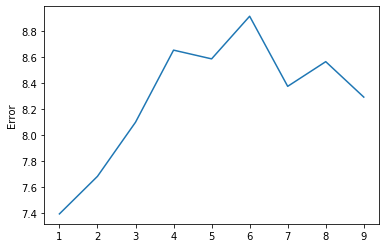

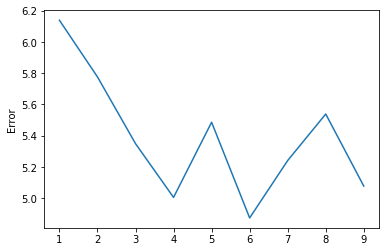

In [7]:
for rm in rmses:
    plt.plot(range(1, len(rm) + 1), rm)
    plt.ylabel("Error")
    plt.show()

In [8]:
def removeFromGroup(x):
    loc = 0
    y = {}
    for a in x:
        for b in x[a]:
            y[loc] = [ b ]
            loc += 1
    return y

In [9]:
!pip install scikit-elm

  0%|          | 0/99 [00:00<?, ?it/s]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 873us/step - loss: 478506.9062
Epoch 2/100
16/16 [==============================] - 0s 873us/step - loss: 63078.2266
Epoch 3/100
16/16 [==============================] - 0s 998us/step - loss: 16228.1621
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 3462.2788
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 1225.3051
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 814.3904
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 794.1881
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 850.8775
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 827.6893
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 862.6547
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 891.7331
Epoch 12/100
16/16 [==============================] - 0s 1ms/step - loss

16/16 [==============================] - 0s 1ms/step - loss: 838.9141
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1060.6573
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1164.2673


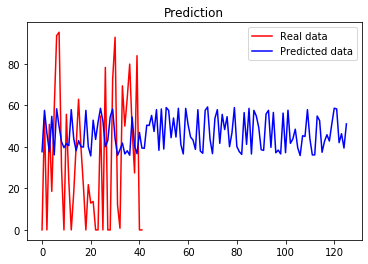

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 658918.8750
Epoch 2/100
16/16 [==============================] - 0s 997us/step - loss: 60798.1328
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 12667.2969
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 3317.2864
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 883.7994
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 686.1838
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 479.1111
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 461.4156
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 467.5402
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 453.6700
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 457.9191
Epoch 12/100
16/16 [==============================] - 0s 1ms/step - loss: 4

16/16 [==============================] - 0s 997us/step - loss: 549.6613
Epoch 99/100
16/16 [==============================] - 0s 997us/step - loss: 617.1900
Epoch 100/100
16/16 [==============================] - 0s 936us/step - loss: 673.8127


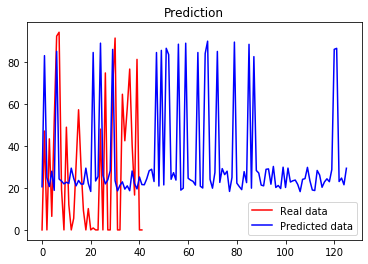

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 873us/step - loss: 1205766.7500
Epoch 2/100
16/16 [==============================] - 0s 873us/step - loss: 238238.9531
Epoch 3/100
16/16 [==============================] - 0s 873us/step - loss: 43372.0078
Epoch 4/100
16/16 [==============================] - 0s 873us/step - loss: 6183.0718
Epoch 5/100
16/16 [==============================] - 0s 873us/step - loss: 2301.1426
Epoch 6/100
16/16 [==============================] - 0s 810us/step - loss: 907.9734
Epoch 7/100
16/16 [==============================] - 0s 874us/step - loss: 537.3242
Epoch 8/100
16/16 [==============================] - 0s 938us/step - loss: 542.2661
Epoch 9/100
16/16 [==============================] - 0s 873us/step - loss: 556.8294
Epoch 10/100
16/16 [==============================] - 0s 873us/step - loss: 570.9597
Epoch 11/100
16/16 [==============================] - 0s 935us/step - loss: 651.8580
Epoch 12/100
16/16 [==============================] - 

16/16 [==============================] - 0s 875us/step - loss: 1221.3533
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 615.7113
Epoch 99/100
16/16 [==============================] - 0s 873us/step - loss: 750.9254
Epoch 100/100
16/16 [==============================] - 0s 935us/step - loss: 830.3054


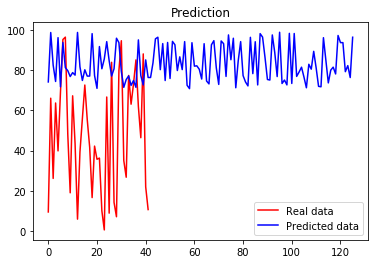

(132, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 22298.2773
Epoch 2/100
13/13 [==============================] - 0s 2ms/step - loss: 6285.7241
Epoch 3/100
13/13 [==============================] - 0s 2ms/step - loss: 2522.6438
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 2303.7415
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 2093.1128
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 1002.8328
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1090.7653
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 1041.8329
Epoch 9/100
13/13 [==============================] - 0s 844us/step - loss: 1055.9514
Epoch 10/100
13/13 [==============================] - 0s 844us/step - loss: 1177.0514
Epoch 11/100
13/13 [==============================] - 0s 844us/step - loss: 1033.9467
Epoch 12/100
13/13 [==============================] - 0s 997us/step -

13/13 [==============================] - 0s 997us/step - loss: 974.8274
Epoch 98/100
13/13 [==============================] - 0s 997us/step - loss: 1318.8535
Epoch 99/100
13/13 [==============================] - 0s 996us/step - loss: 1027.8773
Epoch 100/100
13/13 [==============================] - 0s 997us/step - loss: 995.8862


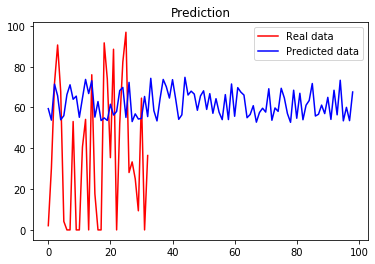

  1%|          | 1/99 [00:12<19:40, 12.04s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 843104.4375
Epoch 2/100
16/16 [==============================] - 0s 1ms/step - loss: 148017.7031
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 20319.3223
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 6273.7646
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 1959.6188
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 975.5809
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 1054.1257
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 1131.7557
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 959.3690
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 919.6630
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 885.0563
Epoch 12/100
16/16 [==============================] - 0s 1ms/step - loss: 9

16/16 [==============================] - 0s 935us/step - loss: 1219.0217
Epoch 98/100
16/16 [==============================] - 0s 873us/step - loss: 1290.5404
Epoch 99/100
16/16 [==============================] - 0s 873us/step - loss: 1249.7908
Epoch 100/100
16/16 [==============================] - 0s 873us/step - loss: 839.9302


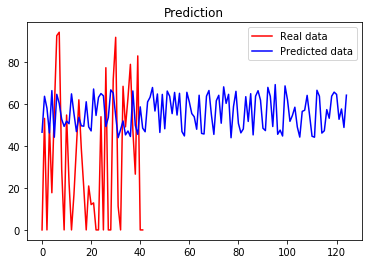

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 935us/step - loss: 218577.1562
Epoch 2/100
16/16 [==============================] - 0s 873us/step - loss: 31658.6191
Epoch 3/100
16/16 [==============================] - 0s 997us/step - loss: 6220.5195
Epoch 4/100
16/16 [==============================] - 0s 873us/step - loss: 2683.7122
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 906.8896
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 560.3350
Epoch 7/100
16/16 [==============================] - 0s 997us/step - loss: 534.6188
Epoch 8/100
16/16 [==============================] - 0s 997us/step - loss: 601.4853
Epoch 9/100
16/16 [==============================] - 0s 997us/step - loss: 470.6352
Epoch 10/100
16/16 [==============================] - 0s 997us/step - loss: 551.0497
Epoch 11/100
16/16 [==============================] - 0s 935us/step - loss: 496.0764
Epoch 12/100
16/16 [==============================] - 0s 1

16/16 [==============================] - 0s 1ms/step - loss: 733.9587
Epoch 98/100
16/16 [==============================] - 0s 997us/step - loss: 694.9677
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 776.6653
Epoch 100/100
16/16 [==============================] - 0s 997us/step - loss: 1084.9764


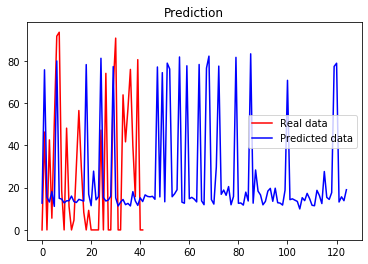

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 935us/step - loss: 5677590.0000
Epoch 2/100
16/16 [==============================] - 0s 935us/step - loss: 744679.1250
Epoch 3/100
16/16 [==============================] - 0s 935us/step - loss: 155815.6875
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 32681.7109
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 9364.5928
Epoch 6/100
16/16 [==============================] - 0s 2ms/step - loss: 4345.7915
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 2517.8811
Epoch 8/100
16/16 [==============================] - 0s 934us/step - loss: 1537.7729
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 1127.0688
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 783.3280
Epoch 11/100
16/16 [==============================] - 0s 935us/step - loss: 656.6189
Epoch 12/100
16/16 [==============================] - 0s 935

16/16 [==============================] - 0s 997us/step - loss: 603.0081
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 456.1196
Epoch 100/100
16/16 [==============================] - 0s 935us/step - loss: 675.1534


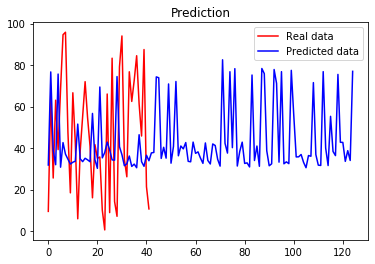

(132, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 143530.2812
Epoch 2/100
13/13 [==============================] - 0s 920us/step - loss: 26163.7656
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 6962.1436
Epoch 4/100
13/13 [==============================] - 0s 998us/step - loss: 4325.3530
Epoch 5/100
13/13 [==============================] - 0s 844us/step - loss: 1885.3848
Epoch 6/100
13/13 [==============================] - 0s 997us/step - loss: 1235.4910
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1030.3262
Epoch 8/100
13/13 [==============================] - 0s 924us/step - loss: 1017.9077
Epoch 9/100
13/13 [==============================] - 0s 920us/step - loss: 1354.7728
Epoch 10/100
13/13 [==============================] - 0s 921us/step - loss: 1313.9436
Epoch 11/100
13/13 [==============================] - 0s 921us/step - loss: 1331.7321
Epoch 12/100
13/13 [==============================] - 0

13/13 [==============================] - 0s 997us/step - loss: 1000.4352
Epoch 97/100
13/13 [==============================] - 0s 921us/step - loss: 1400.7483
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1303.7316
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1121.0385
Epoch 100/100
13/13 [==============================] - 0s 923us/step - loss: 1006.1513


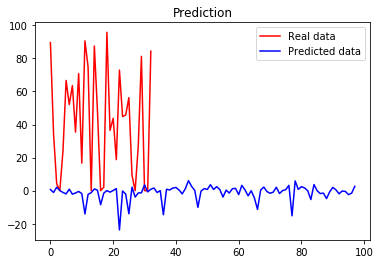

  2%|▏         | 2/99 [00:25<19:56, 12.33s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 935us/step - loss: 147921.0469
Epoch 2/100
16/16 [==============================] - 0s 873us/step - loss: 18714.6973
Epoch 3/100
16/16 [==============================] - 0s 935us/step - loss: 5584.9307
Epoch 4/100
16/16 [==============================] - 0s 935us/step - loss: 1542.0032
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 935.4307
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 1119.1371
Epoch 7/100
16/16 [==============================] - 0s 936us/step - loss: 1261.9298
Epoch 8/100
16/16 [==============================] - 0s 997us/step - loss: 989.3356
Epoch 9/100
16/16 [==============================] - 0s 995us/step - loss: 1045.1227
Epoch 10/100
16/16 [==============================] - 0s 937us/step - loss: 1159.9872
Epoch 11/100
16/16 [==============================] - 0s 937us/step - loss: 1195.8738
Epoch 12/100
16/16 [==============================] -

16/16 [==============================] - 0s 999us/step - loss: 2144.5029
Epoch 97/100
16/16 [==============================] - 0s 997us/step - loss: 1162.0398
Epoch 98/100
16/16 [==============================] - 0s 935us/step - loss: 2855.3848
Epoch 99/100
16/16 [==============================] - 0s 999us/step - loss: 4716.5239
Epoch 100/100
16/16 [==============================] - 0s 997us/step - loss: 1080.0471


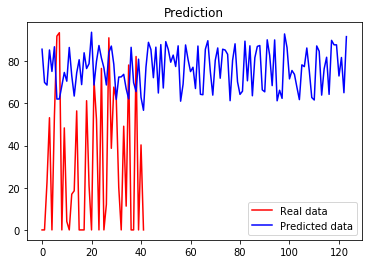

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 74042.0938
Epoch 2/100
16/16 [==============================] - 0s 1ms/step - loss: 7712.1846
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 4229.0757
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 1708.3170
Epoch 5/100
16/16 [==============================] - 0s 997us/step - loss: 1056.7533
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 561.3756
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 1476.0505
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 874.5604
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 882.2579
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 1058.9919
Epoch 11/100
16/16 [==============================] - 0s 997us/step - loss: 800.7643
Epoch 12/100
16/16 [==============================] - 0s 1ms/step - loss: 8

16/16 [==============================] - 0s 997us/step - loss: 1585.9948
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1255.8900
Epoch 99/100
16/16 [==============================] - 0s 995us/step - loss: 597.1478
Epoch 100/100
16/16 [==============================] - 0s 935us/step - loss: 669.7200


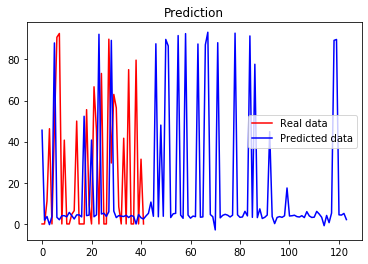

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 813872.1250
Epoch 2/100
16/16 [==============================] - 0s 1ms/step - loss: 71127.3594
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 32983.7500
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 7549.5981
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 3618.1980
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 990.1324
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 589.5369
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 538.9487
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 679.1269
Epoch 10/100
16/16 [==============================] - 0s 997us/step - loss: 680.6622
Epoch 11/100
16/16 [==============================] - 0s 810us/step - loss: 595.3962
Epoch 12/100
16/16 [==============================] - 0s 935us/step - loss

16/16 [==============================] - 0s 1ms/step - loss: 2636.3584
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1474.5360
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 900.1710
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 633.9155


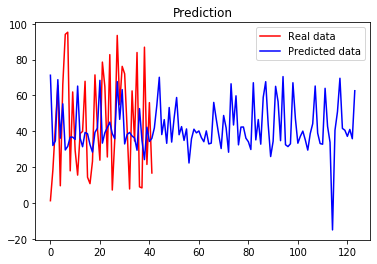

(132, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 542965.7500
Epoch 2/100
13/13 [==============================] - 0s 921us/step - loss: 94126.3438
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 30099.7637
Epoch 4/100
13/13 [==============================] - 0s 921us/step - loss: 7069.0425
Epoch 5/100
13/13 [==============================] - 0s 997us/step - loss: 2646.5508
Epoch 6/100
13/13 [==============================] - 0s 847us/step - loss: 1457.3872
Epoch 7/100
13/13 [==============================] - 0s 922us/step - loss: 1416.8187
Epoch 8/100
13/13 [==============================] - 0s 844us/step - loss: 1225.8157
Epoch 9/100
13/13 [==============================] - 0s 921us/step - loss: 1335.2406
Epoch 10/100
13/13 [==============================] - 0s 921us/step - loss: 1504.0714
Epoch 11/100
13/13 [==============================] - 0s 924us/step - loss: 1393.8464
Epoch 12/100
13/13 [==============================] 

13/13 [==============================] - 0s 1ms/step - loss: 1953.0054
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 3443.0420
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2624.8535
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 6458.3047


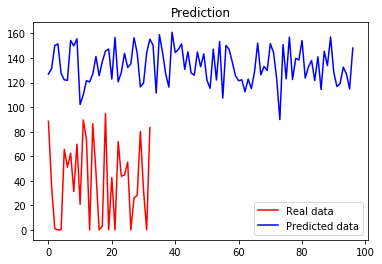

  3%|▎         | 3/99 [00:36<19:29, 12.19s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 938us/step - loss: 390614.5625
Epoch 2/100
16/16 [==============================] - 0s 810us/step - loss: 37710.5195
Epoch 3/100
16/16 [==============================] - 0s 935us/step - loss: 9834.5586
Epoch 4/100
16/16 [==============================] - 0s 935us/step - loss: 1951.9543
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 1314.3531
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 1023.1334
Epoch 7/100
16/16 [==============================] - 0s 997us/step - loss: 1152.7782
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 975.1924
Epoch 9/100
16/16 [==============================] - 0s 935us/step - loss: 1044.0216
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 906.4315
Epoch 11/100
16/16 [==============================] - 0s 937us/step - loss: 943.5019
Epoch 12/100
16/16 [==============================] - 0s

16/16 [==============================] - 0s 1ms/step - loss: 1450.0039
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 817.3183
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1984.5309
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1244.9092


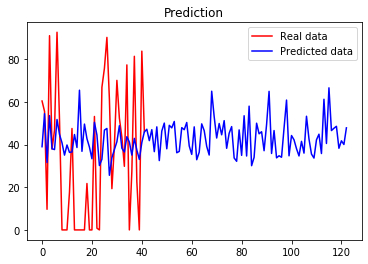

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 875us/step - loss: 12863788.0000
Epoch 2/100
16/16 [==============================] - 0s 997us/step - loss: 1390244.5000
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 436375.0625
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 171514.5469
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 92495.5859
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 72977.5312
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 60740.8398
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 58834.5938
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 45404.2617
Epoch 10/100
16/16 [==============================] - 0s 995us/step - loss: 39296.0391
Epoch 11/100
16/16 [==============================] - 0s 935us/step - loss: 35499.2656
Epoch 12/100
16/16 [==============================

16/16 [==============================] - 0s 1ms/step - loss: 925.1679
Epoch 98/100
16/16 [==============================] - 0s 1000us/step - loss: 779.9205
Epoch 99/100
16/16 [==============================] - 0s 997us/step - loss: 858.6788
Epoch 100/100
16/16 [==============================] - 0s 999us/step - loss: 994.0368


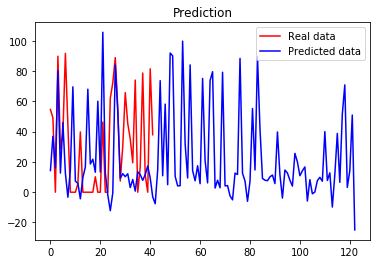

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 466276.3125
Epoch 2/100
16/16 [==============================] - 0s 997us/step - loss: 167752.2656
Epoch 3/100
16/16 [==============================] - 0s 938us/step - loss: 54992.3125
Epoch 4/100
16/16 [==============================] - 0s 935us/step - loss: 13070.6699
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 4436.2720
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 1703.7314
Epoch 7/100
16/16 [==============================] - 0s 996us/step - loss: 1035.7277
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 801.5678
Epoch 9/100
16/16 [==============================] - 0s 935us/step - loss: 975.4384
Epoch 10/100
16/16 [==============================] - 0s 935us/step - loss: 759.8080
Epoch 11/100
16/16 [==============================] - 0s 997us/step - loss: 797.7023
Epoch 12/100
16/16 [==============================] - 

16/16 [==============================] - 0s 997us/step - loss: 825.9930
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1329.6105
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 911.5285
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1116.3993


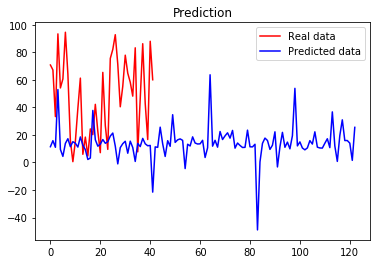

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 173793.5469
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 37908.7305
Epoch 3/100
12/12 [==============================] - 0s 831us/step - loss: 16515.6113
Epoch 4/100
12/12 [==============================] - 0s 831us/step - loss: 5968.0718
Epoch 5/100
12/12 [==============================] - 0s 831us/step - loss: 2840.9856
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 2491.3408
Epoch 7/100
12/12 [==============================] - 0s 997us/step - loss: 2899.8105
Epoch 8/100
12/12 [==============================] - 0s 915us/step - loss: 1777.2070
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 1550.8275
Epoch 10/100
12/12 [==============================] - 0s 914us/step - loss: 1514.7319
Epoch 11/100
12/12 [==============================] - 0s 914us/step - loss: 2113.4148
Epoch 12/100
12/12 [==============================

12/12 [==============================] - 0s 1ms/step - loss: 4215.6460
Epoch 98/100
12/12 [==============================] - 0s 914us/step - loss: 2999.4641
Epoch 99/100
12/12 [==============================] - 0s 914us/step - loss: 1885.7758
Epoch 100/100
12/12 [==============================] - 0s 997us/step - loss: 2331.6418


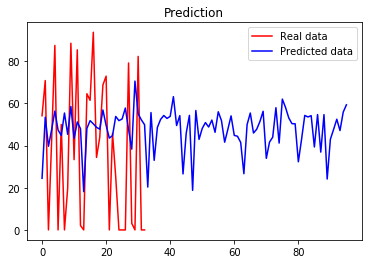

  4%|▍         | 4/99 [00:49<19:21, 12.22s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 935us/step - loss: 947232.9375
Epoch 2/100
16/16 [==============================] - 0s 935us/step - loss: 113049.3672
Epoch 3/100
16/16 [==============================] - 0s 873us/step - loss: 33102.2461
Epoch 4/100
16/16 [==============================] - 0s 937us/step - loss: 6887.4707
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 2066.8542
Epoch 6/100
16/16 [==============================] - 0s 937us/step - loss: 1000.0699
Epoch 7/100
16/16 [==============================] - 0s 873us/step - loss: 1093.4655
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 1173.2013
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 1042.8077
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 1093.2601
Epoch 11/100
16/16 [==============================] - 0s 2ms/step - loss: 1118.4851
Epoch 12/100
16/16 [==============================] - 0s 

16/16 [==============================] - 0s 997us/step - loss: 2139.4763
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1763.6995
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1861.7137
Epoch 100/100
16/16 [==============================] - 0s 1000us/step - loss: 1175.1261


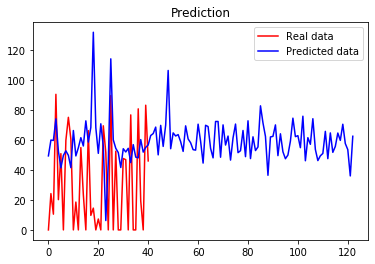

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 1852751.7500
Epoch 2/100
16/16 [==============================] - 0s 1ms/step - loss: 256634.4688
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 30372.8125
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 21757.6309
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 13308.4160
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 10458.1328
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 6946.8745
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 5013.3857
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 4753.7529
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 3421.3525
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 2501.8660
Epoch 12/100
16/16 [==============================] - 0s 1ms/step -

16/16 [==============================] - 0s 1ms/step - loss: 460.8052
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 443.4603
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 627.3157


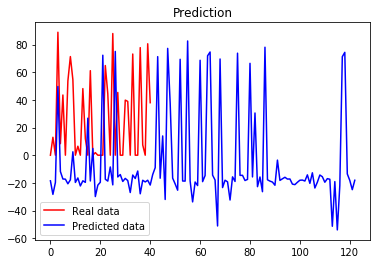

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 937us/step - loss: 302144.3438
Epoch 2/100
16/16 [==============================] - 0s 810us/step - loss: 56835.7734
Epoch 3/100
16/16 [==============================] - 0s 873us/step - loss: 14249.7998
Epoch 4/100
16/16 [==============================] - 0s 873us/step - loss: 6105.7930
Epoch 5/100
16/16 [==============================] - 0s 875us/step - loss: 5276.2808
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 2115.3186
Epoch 7/100
16/16 [==============================] - 0s 875us/step - loss: 1322.8848
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 916.1078
Epoch 9/100
16/16 [==============================] - 0s 997us/step - loss: 628.3815
Epoch 10/100
16/16 [==============================] - 0s 935us/step - loss: 590.6436
Epoch 11/100
16/16 [==============================] - 0s 997us/step - loss: 720.3065
Epoch 12/100
16/16 [==============================] - 

16/16 [==============================] - 0s 1ms/step - loss: 908.4142
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 2521.8457
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1663.8615
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1296.5132


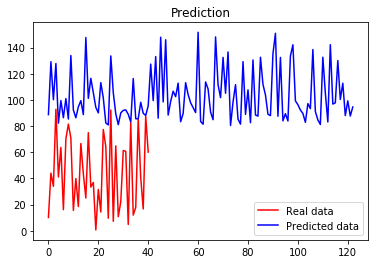

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 7074112.0000
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 1227127.6250
Epoch 3/100
12/12 [==============================] - 0s 918us/step - loss: 440143.7188
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 112352.8672
Epoch 5/100
12/12 [==============================] - 0s 831us/step - loss: 30777.4434
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 9273.5010
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 5285.6802
Epoch 8/100
12/12 [==============================] - 0s 997us/step - loss: 4645.4253
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 3626.3665
Epoch 10/100
12/12 [==============================] - 0s 831us/step - loss: 3659.2341
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 3645.4026
Epoch 12/100
12/12 [=========================

12/12 [==============================] - 0s 1ms/step - loss: 2171.9897
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2103.0725
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1998.5787
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2406.8923


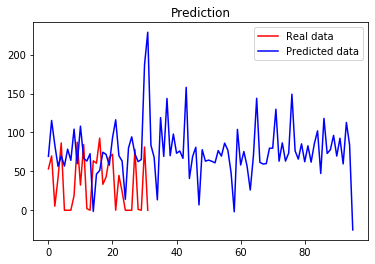

  5%|▌         | 5/99 [01:01<19:10, 12.24s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 938us/step - loss: 1006998.0625
Epoch 2/100
16/16 [==============================] - 0s 931us/step - loss: 106900.2969
Epoch 3/100
16/16 [==============================] - 0s 997us/step - loss: 29407.2246
Epoch 4/100
16/16 [==============================] - 0s 935us/step - loss: 9478.6338
Epoch 5/100
16/16 [==============================] - 0s 936us/step - loss: 2005.4423
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 1330.4683
Epoch 7/100
16/16 [==============================] - 0s 997us/step - loss: 1373.4724
Epoch 8/100
16/16 [==============================] - 0s 1000us/step - loss: 1609.8601
Epoch 9/100
16/16 [==============================] - 0s 1000us/step - loss: 1416.9006
Epoch 10/100
16/16 [==============================] - 0s 997us/step - loss: 1295.6145
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 1466.1626
Epoch 12/100
16/16 [============================

16/16 [==============================] - 0s 1ms/step - loss: 1689.3284
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1314.7268
Epoch 99/100
16/16 [==============================] - 0s 999us/step - loss: 3111.7493
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 2632.0520


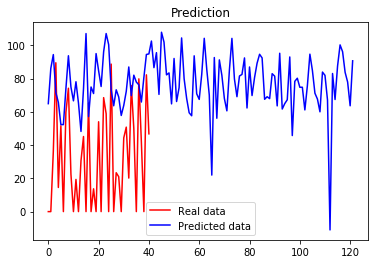

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 810us/step - loss: 1008883.8750
Epoch 2/100
16/16 [==============================] - 0s 935us/step - loss: 194251.6562
Epoch 3/100
16/16 [==============================] - 0s 873us/step - loss: 77789.2891
Epoch 4/100
16/16 [==============================] - 0s 873us/step - loss: 44158.2266
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 21439.4121
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 14735.8154
Epoch 7/100
16/16 [==============================] - 0s 936us/step - loss: 12146.5400
Epoch 8/100
16/16 [==============================] - 0s 873us/step - loss: 7887.3682
Epoch 9/100
16/16 [==============================] - 0s 935us/step - loss: 6238.2568
Epoch 10/100
16/16 [==============================] - 0s 935us/step - loss: 5221.2812
Epoch 11/100
16/16 [==============================] - 0s 875us/step - loss: 4402.9976
Epoch 12/100
16/16 [========================

16/16 [==============================] - 0s 999us/step - loss: 1123.2573
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 684.3367
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 733.5455
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 508.4733


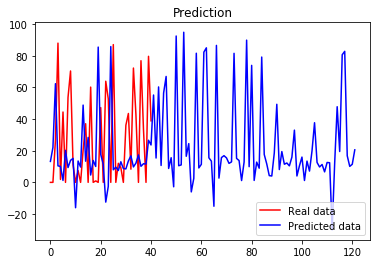

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 873us/step - loss: 1351730.3750
Epoch 2/100
16/16 [==============================] - 0s 875us/step - loss: 169624.6875
Epoch 3/100
16/16 [==============================] - 0s 810us/step - loss: 64902.1562
Epoch 4/100
16/16 [==============================] - 0s 935us/step - loss: 19616.1973
Epoch 5/100
16/16 [==============================] - 0s 873us/step - loss: 7831.7905
Epoch 6/100
16/16 [==============================] - 0s 937us/step - loss: 4648.1836
Epoch 7/100
16/16 [==============================] - 0s 873us/step - loss: 3318.7368
Epoch 8/100
16/16 [==============================] - 0s 875us/step - loss: 2847.4763
Epoch 9/100
16/16 [==============================] - 0s 935us/step - loss: 2796.6167
Epoch 10/100
16/16 [==============================] - 0s 873us/step - loss: 1597.4839
Epoch 11/100
16/16 [==============================] - 0s 935us/step - loss: 1196.0660
Epoch 12/100
16/16 [===========================

16/16 [==============================] - 0s 1ms/step - loss: 752.3077
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1158.0137
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1390.2542
Epoch 100/100
16/16 [==============================] - 0s 997us/step - loss: 1451.1747


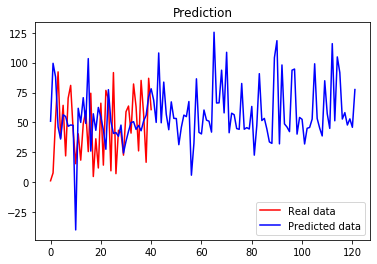

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 996us/step - loss: 390994.8750
Epoch 2/100
12/12 [==============================] - 0s 998us/step - loss: 102920.3828
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 33239.7227
Epoch 4/100
12/12 [==============================] - 0s 917us/step - loss: 11331.0684
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 4559.1294
Epoch 6/100
12/12 [==============================] - 0s 834us/step - loss: 3827.4885
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 3910.6533
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 4026.3306
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 2754.5071
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 2885.2251
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 3089.6897
Epoch 12/100
12/12 [==============================] 

12/12 [==============================] - 0s 1ms/step - loss: 3498.0608
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2481.0732
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 4106.7354
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 5964.7979


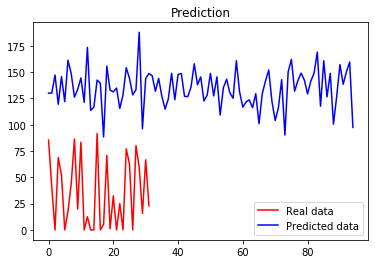

  6%|▌         | 6/99 [01:13<18:54, 12.20s/it]

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 1ms/step - loss: 204307.5156
Epoch 2/100
16/16 [==============================] - 0s 1ms/step - loss: 33613.2109
Epoch 3/100
16/16 [==============================] - 0s 1ms/step - loss: 6912.3853
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 3852.0283
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 1785.1904
Epoch 6/100
16/16 [==============================] - 0s 935us/step - loss: 1518.5205
Epoch 7/100
16/16 [==============================] - 0s 997us/step - loss: 1386.2859
Epoch 8/100
16/16 [==============================] - 0s 937us/step - loss: 1693.2819
Epoch 9/100
16/16 [==============================] - 0s 997us/step - loss: 2182.8286
Epoch 10/100
16/16 [==============================] - 0s 873us/step - loss: 1384.1602
Epoch 11/100
16/16 [==============================] - 0s 1000us/step - loss: 1348.3818
Epoch 12/100
16/16 [==============================] - 0s 997

16/16 [==============================] - 0s 1ms/step - loss: 2942.1804
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 3012.7480
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 1481.2192
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1171.6281


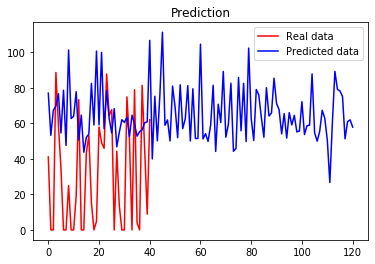

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 997us/step - loss: 6137640.5000
Epoch 2/100
16/16 [==============================] - 0s 997us/step - loss: 665197.3125
Epoch 3/100
16/16 [==============================] - 0s 935us/step - loss: 185410.2500
Epoch 4/100
16/16 [==============================] - 0s 1ms/step - loss: 92138.6953
Epoch 5/100
16/16 [==============================] - 0s 1ms/step - loss: 84184.4531
Epoch 6/100
16/16 [==============================] - 0s 1ms/step - loss: 72144.8906
Epoch 7/100
16/16 [==============================] - 0s 1ms/step - loss: 66329.6875
Epoch 8/100
16/16 [==============================] - 0s 1ms/step - loss: 58471.0391
Epoch 9/100
16/16 [==============================] - 0s 1ms/step - loss: 52745.1992
Epoch 10/100
16/16 [==============================] - 0s 1ms/step - loss: 48220.1133
Epoch 11/100
16/16 [==============================] - 0s 1ms/step - loss: 42099.9844
Epoch 12/100
16/16 [==============================] - 0

16/16 [==============================] - 0s 1ms/step - loss: 877.4393
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1071.2816
Epoch 99/100
16/16 [==============================] - 0s 2ms/step - loss: 916.7432
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 987.8927


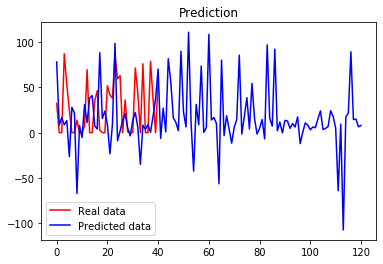

(168, 4)
Epoch 1/100
16/16 [==============================] - 0s 873us/step - loss: 906277.1875
Epoch 2/100
16/16 [==============================] - 0s 997us/step - loss: 127165.1094
Epoch 3/100
16/16 [==============================] - 0s 937us/step - loss: 70559.5938
Epoch 4/100
16/16 [==============================] - 0s 933us/step - loss: 28342.3145
Epoch 5/100
16/16 [==============================] - 0s 935us/step - loss: 19697.0801
Epoch 6/100
16/16 [==============================] - 0s 938us/step - loss: 7369.2202
Epoch 7/100
16/16 [==============================] - 0s 933us/step - loss: 6370.0894
Epoch 8/100
16/16 [==============================] - 0s 935us/step - loss: 4174.2715
Epoch 9/100
16/16 [==============================] - 0s 935us/step - loss: 2895.0322
Epoch 10/100
16/16 [==============================] - 0s 937us/step - loss: 2080.9387
Epoch 11/100
16/16 [==============================] - 0s 998us/step - loss: 1535.4211
Epoch 12/100
16/16 [===========================

16/16 [==============================] - 0s 1ms/step - loss: 674.9127
Epoch 98/100
16/16 [==============================] - 0s 1ms/step - loss: 1395.8519
Epoch 99/100
16/16 [==============================] - 0s 1ms/step - loss: 2067.4541
Epoch 100/100
16/16 [==============================] - 0s 1ms/step - loss: 1532.5977


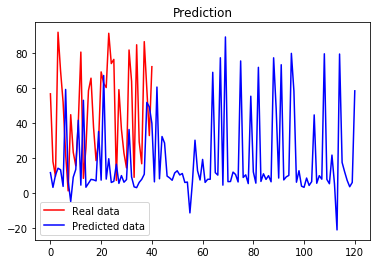

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 998us/step - loss: 1011557.9375
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 243406.7812
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 45267.3125
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 18709.7988
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 5723.1357
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 2613.7219
Epoch 7/100
12/12 [==============================] - 0s 917us/step - loss: 1433.5024
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 1381.6554
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 1524.1025
Epoch 10/100
12/12 [==============================] - 0s 914us/step - loss: 1420.7032
Epoch 11/100
12/12 [==============================] - 0s 999us/step - loss: 1376.4541
Epoch 12/100
12/12 [=============================

12/12 [==============================] - 0s 1ms/step - loss: 1431.2505
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2034.3479
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1291.7163
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 970.9211


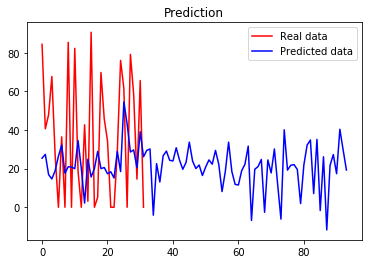

  7%|▋         | 7/99 [01:26<18:48, 12.26s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 867us/step - loss: 386495.4375
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 65535.2617
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 14758.4590
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 4316.8433
Epoch 5/100
15/15 [==============================] - 0s 798us/step - loss: 1431.1953
Epoch 6/100
15/15 [==============================] - 0s 867us/step - loss: 1806.1506
Epoch 7/100
15/15 [==============================] - 0s 864us/step - loss: 1917.8718
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 1946.7302
Epoch 9/100
15/15 [==============================] - 0s 864us/step - loss: 1631.2004
Epoch 10/100
15/15 [==============================] - 0s 798us/step - loss: 1617.4213
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 1869.4249
Epoch 12/100
15/15 [==============================

15/15 [==============================] - 0s 1ms/step - loss: 1615.8702
Epoch 97/100
15/15 [==============================] - 0s 1ms/step - loss: 2228.5034
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1525.5125
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2618.7600
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1750.8488


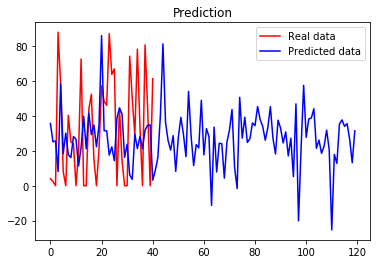

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 929us/step - loss: 336588.4062
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 170480.4844
Epoch 3/100
15/15 [==============================] - 0s 867us/step - loss: 100053.2656
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 83096.6016
Epoch 5/100
15/15 [==============================] - 0s 798us/step - loss: 35312.0234
Epoch 6/100
15/15 [==============================] - 0s 930us/step - loss: 24277.4609
Epoch 7/100
15/15 [==============================] - 0s 2ms/step - loss: 26657.5840
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 19068.0273
Epoch 9/100
15/15 [==============================] - 0s 867us/step - loss: 11219.4648
Epoch 10/100
15/15 [==============================] - 0s 864us/step - loss: 10630.4102
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 8805.4678
Epoch 12/100
15/15 [=========================

15/15 [==============================] - 0s 1ms/step - loss: 1198.0493
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 943.1947
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 860.1439
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 2022.5521


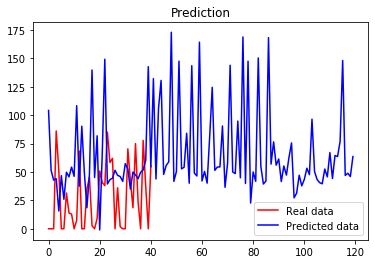

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 997us/step - loss: 1644204.2500
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 873260.6250
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 379505.0312
Epoch 4/100
15/15 [==============================] - 0s 997us/step - loss: 247394.7812
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 141615.2031
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 75642.7031
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 48546.6211
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 40451.2422
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 28825.5625
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 19412.7109
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 19950.1113
Epoch 12/100
15/15 [==============================] -

15/15 [==============================] - 0s 996us/step - loss: 696.5641
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 750.2916
Epoch 99/100
15/15 [==============================] - 0s 996us/step - loss: 1161.0579
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 821.6707


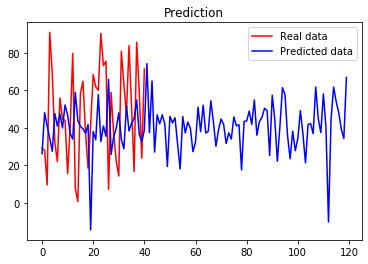

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 291403.6562
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 55223.9453
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 18474.2207
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 6734.6782
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 4586.7817
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 1733.1936
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 1415.2642
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 1267.7327
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 1273.4252
Epoch 10/100
12/12 [==============================] - 0s 997us/step - loss: 1220.1434
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1132.3041
Epoch 12/100
12/12 [==============================] - 0s 1ms/step - 

12/12 [==============================] - 0s 1ms/step - loss: 1008.3919
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2091.2859
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1944.8403


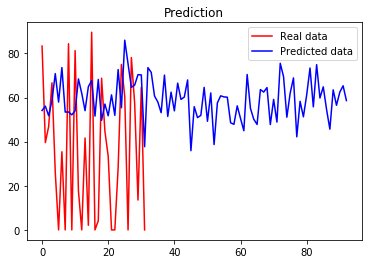

  8%|▊         | 8/99 [01:37<18:23, 12.12s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 425564.5312
Epoch 2/100
15/15 [==============================] - 0s 798us/step - loss: 52531.1875
Epoch 3/100
15/15 [==============================] - 0s 933us/step - loss: 11439.0713
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 3989.6213
Epoch 5/100
15/15 [==============================] - 0s 867us/step - loss: 3234.2961
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 2009.7911
Epoch 7/100
15/15 [==============================] - 0s 798us/step - loss: 1897.3464
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 1649.0350
Epoch 9/100
15/15 [==============================] - 0s 867us/step - loss: 1925.3312
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 1936.0024
Epoch 11/100
15/15 [==============================] - 0s 932us/step - loss: 2263.8296
Epoch 12/100
15/15 [==============================

15/15 [==============================] - 0s 1ms/step - loss: 1770.6287
Epoch 97/100
15/15 [==============================] - 0s 997us/step - loss: 1359.6565
Epoch 98/100
15/15 [==============================] - 0s 997us/step - loss: 2254.3577
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2743.8140
Epoch 100/100
15/15 [==============================] - 0s 997us/step - loss: 1672.2505


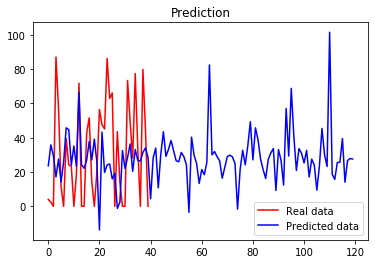

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 2140919.2500
Epoch 2/100
15/15 [==============================] - 0s 798us/step - loss: 192388.8594
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 125353.7578
Epoch 4/100
15/15 [==============================] - 0s 798us/step - loss: 54488.1367
Epoch 5/100
15/15 [==============================] - 0s 798us/step - loss: 34454.2031
Epoch 6/100
15/15 [==============================] - 0s 933us/step - loss: 29539.8359
Epoch 7/100
15/15 [==============================] - 0s 864us/step - loss: 25688.2871
Epoch 8/100
15/15 [==============================] - 0s 864us/step - loss: 19342.9609
Epoch 9/100
15/15 [==============================] - 0s 930us/step - loss: 20004.6934
Epoch 10/100
15/15 [==============================] - 0s 866us/step - loss: 12763.6045
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 10088.2920
Epoch 12/100
15/15 [===================

Epoch 97/100
15/15 [==============================] - 0s 997us/step - loss: 1213.1425
Epoch 98/100
15/15 [==============================] - 0s 997us/step - loss: 1335.0304
Epoch 99/100
15/15 [==============================] - 0s 933us/step - loss: 1076.8367
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1511.6255


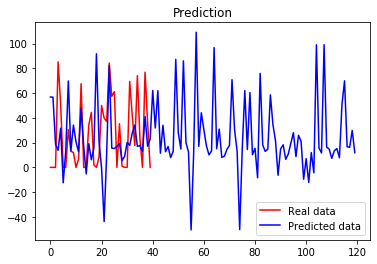

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 864us/step - loss: 1443211.3750
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 405644.4062
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 278509.3125
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 261912.9844
Epoch 5/100
15/15 [==============================] - 0s 1000us/step - loss: 148745.7188
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 89797.5547
Epoch 7/100
15/15 [==============================] - 0s 867us/step - loss: 66766.8125
Epoch 8/100
15/15 [==============================] - 0s 933us/step - loss: 49488.4805
Epoch 9/100
15/15 [==============================] - 0s 867us/step - loss: 49204.5273
Epoch 10/100
15/15 [==============================] - 0s 867us/step - loss: 28722.9395
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 17783.1387
Epoch 12/100
15/15 [================

15/15 [==============================] - 0s 1ms/step - loss: 2086.0425
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1098.6564
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1344.0692
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1319.3567


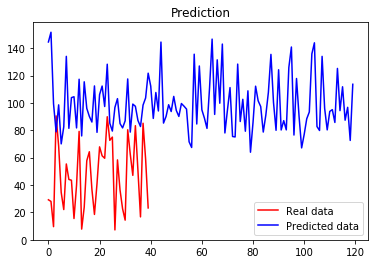

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 2ms/step - loss: 559338.2500
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 114995.1328
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 34940.4219
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 11319.9062
Epoch 5/100
12/12 [==============================] - 0s 2ms/step - loss: 3189.2202
Epoch 6/100
12/12 [==============================] - 0s 2ms/step - loss: 2688.8040
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 1995.1271
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 2356.9531
Epoch 9/100
12/12 [==============================] - 0s 2ms/step - loss: 3355.0354
Epoch 10/100
12/12 [==============================] - 0s 2ms/step - loss: 2763.7051
Epoch 11/100
12/12 [==============================] - 0s 2ms/step - loss: 3263.0342
Epoch 12/100
12/12 [==============================] - 0s 2ms/step - lo

12/12 [==============================] - 0s 2ms/step - loss: 898.3896
Epoch 99/100
12/12 [==============================] - 0s 2ms/step - loss: 1866.3923
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2134.6951


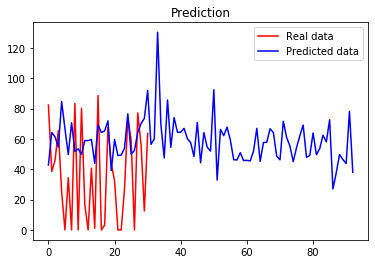

  9%|▉         | 9/99 [01:50<18:29, 12.33s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 997us/step - loss: 673055.0625
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 86340.1016
Epoch 3/100
15/15 [==============================] - 0s 933us/step - loss: 20648.6836
Epoch 4/100
15/15 [==============================] - 0s 997us/step - loss: 9349.9160
Epoch 5/100
15/15 [==============================] - 0s 1000us/step - loss: 5175.1387
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 2423.8118
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 2956.9412
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 2594.5530
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 2913.0940
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 3721.3105
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 3275.5137
Epoch 12/100
15/15 [==============================] - 0s 1ms/

15/15 [==============================] - 0s 1ms/step - loss: 2394.1096
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1868.4977
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2083.3354
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 2713.4250


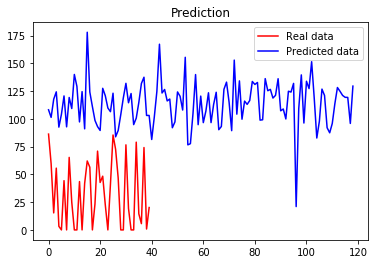

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 248417.8594
Epoch 2/100
15/15 [==============================] - 0s 934us/step - loss: 69091.3125
Epoch 3/100
15/15 [==============================] - 0s 931us/step - loss: 25615.6602
Epoch 4/100
15/15 [==============================] - 0s 930us/step - loss: 15014.2598
Epoch 5/100
15/15 [==============================] - 0s 997us/step - loss: 12251.6328
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 10919.2754
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 8901.0410
Epoch 8/100
15/15 [==============================] - 0s 930us/step - loss: 10756.3525
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 8727.4873
Epoch 10/100
15/15 [==============================] - 0s 932us/step - loss: 5024.1880
Epoch 11/100
15/15 [==============================] - 0s 997us/step - loss: 4304.7476
Epoch 12/100
15/15 [==========================

15/15 [==============================] - 0s 1ms/step - loss: 1368.5226
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 868.4116
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1431.9059


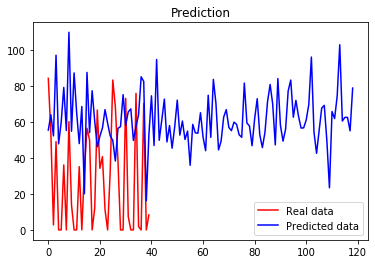

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 933us/step - loss: 529268.8125
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 128678.1719
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 57802.5156
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 36350.3359
Epoch 5/100
15/15 [==============================] - 0s 933us/step - loss: 14362.4307
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 8163.2656
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 3650.5024
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 2924.9167
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 3149.5176
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 2650.2542
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 2196.4116
Epoch 12/100
15/15 [==============================] - 0s 1ms/

15/15 [==============================] - 0s 1ms/step - loss: 604.7106
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 585.1528
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 904.3243


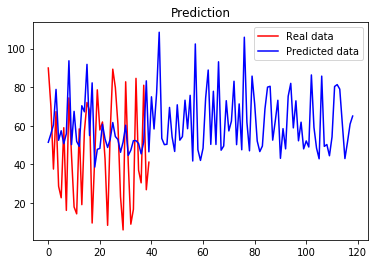

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 1728037.8750
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 404958.6875
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 93632.4453
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 23147.2871
Epoch 5/100
12/12 [==============================] - 0s 917us/step - loss: 13498.0518
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 3149.1650
Epoch 7/100
12/12 [==============================] - 0s 997us/step - loss: 2681.8149
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 3116.4609
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 2698.7961
Epoch 10/100
12/12 [==============================] - 0s 831us/step - loss: 2702.1562
Epoch 11/100
12/12 [==============================] - 0s 918us/step - loss: 2828.8804
Epoch 12/100
12/12 [============================

12/12 [==============================] - 0s 1ms/step - loss: 2466.7996
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1494.2148
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1634.0470
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1560.3282


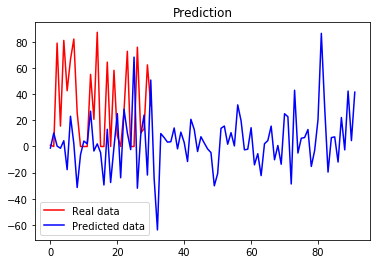

 10%|█         | 10/99 [02:02<18:07, 12.22s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 3679685.0000
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 335353.2188
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 73600.6562
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 19304.5293
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 5589.9478
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 2041.8790
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 1069.3047
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 905.9401
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 915.4586
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 938.7482
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 898.6280
Epoch 12/100
15/15 [==============================] - 0s 1ms/step - los

Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 906.7115
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1089.2714
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1119.3019


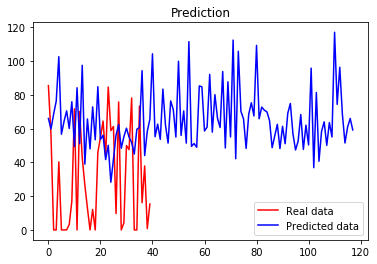

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 1799829.2500
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 143245.5312
Epoch 3/100
15/15 [==============================] - 0s 931us/step - loss: 81980.3750
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 31217.5957
Epoch 5/100
15/15 [==============================] - 0s 933us/step - loss: 20874.4707
Epoch 6/100
15/15 [==============================] - 0s 864us/step - loss: 15772.6865
Epoch 7/100
15/15 [==============================] - 0s 866us/step - loss: 12583.9160
Epoch 8/100
15/15 [==============================] - 0s 866us/step - loss: 8991.5273
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 6899.2563
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 6033.0615
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 5097.6758
Epoch 12/100
15/15 [============================

15/15 [==============================] - 0s 1ms/step - loss: 880.7889
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 701.6630
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 780.4623
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 727.2236


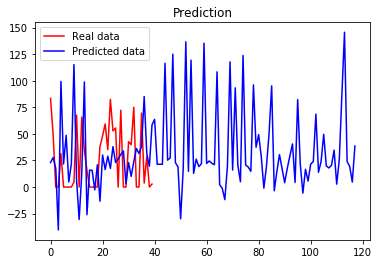

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 864us/step - loss: 326804.2500
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 113885.6328
Epoch 3/100
15/15 [==============================] - 0s 1000us/step - loss: 87318.7188
Epoch 4/100
15/15 [==============================] - 0s 934us/step - loss: 37417.5859
Epoch 5/100
15/15 [==============================] - 0s 933us/step - loss: 36484.4297
Epoch 6/100
15/15 [==============================] - 0s 867us/step - loss: 21704.8398
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 28944.6055
Epoch 8/100
15/15 [==============================] - 0s 933us/step - loss: 14432.0859
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 8187.5996
Epoch 10/100
15/15 [==============================] - 0s 933us/step - loss: 5620.6602
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 3189.4429
Epoch 12/100
15/15 [=========================

15/15 [==============================] - 0s 1ms/step - loss: 1632.8353
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 2513.0146
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 3866.4739
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 7467.7163


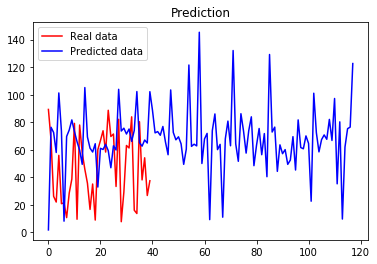

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 23015288.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 3383446.2500
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 1247757.3750
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 353162.2188
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 90427.0781
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 22166.2578
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 9051.0918
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 5022.7134
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 3320.1714
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 3086.8660
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 3001.7849
Epoch 12/100
12/12 [==============================] - 0s 1ms/s

12/12 [==============================] - 0s 1ms/step - loss: 2167.3071
Epoch 99/100
12/12 [==============================] - 0s 997us/step - loss: 2356.4688
Epoch 100/100
12/12 [==============================] - 0s 997us/step - loss: 2874.4053


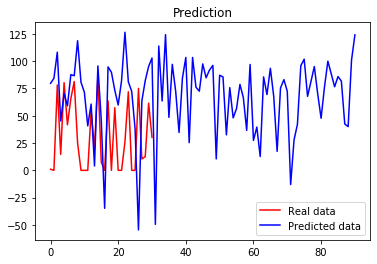

 11%|█         | 11/99 [02:15<18:03, 12.31s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 932us/step - loss: 1225735.1250
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 249811.8906
Epoch 3/100
15/15 [==============================] - 0s 931us/step - loss: 60057.4688
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 26023.8281
Epoch 5/100
15/15 [==============================] - 0s 1000us/step - loss: 9743.2812
Epoch 6/100
15/15 [==============================] - 0s 997us/step - loss: 6733.2744
Epoch 7/100
15/15 [==============================] - 0s 933us/step - loss: 6113.2793
Epoch 8/100
15/15 [==============================] - 0s 933us/step - loss: 7485.3599
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 10273.8828
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 8073.0762
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 5701.7598
Epoch 12/100
15/15 [===========================

15/15 [==============================] - 0s 1ms/step - loss: 3217.8945
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 2914.8882
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2237.3621
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1665.5378


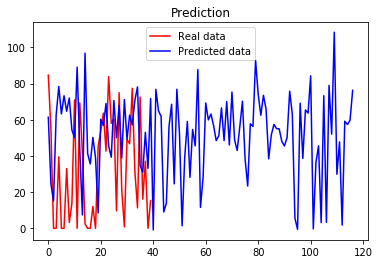

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 997us/step - loss: 3027866.7500
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 634933.6250
Epoch 3/100
15/15 [==============================] - 0s 931us/step - loss: 165529.2656
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 61691.6875
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 42206.3125
Epoch 6/100
15/15 [==============================] - 0s 997us/step - loss: 33651.2461
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 25781.0820
Epoch 8/100
15/15 [==============================] - 0s 864us/step - loss: 20613.7656
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 15913.7393
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 15049.8184
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 12583.9365
Epoch 12/100
15/15 [===========================

15/15 [==============================] - 0s 1ms/step - loss: 555.9435
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 677.0436
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 905.7729


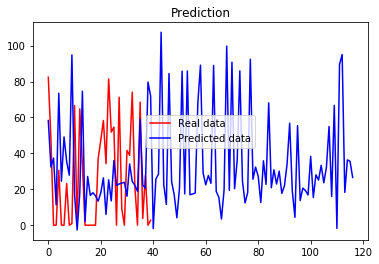

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 1056031.3750
Epoch 2/100
15/15 [==============================] - 0s 866us/step - loss: 151427.4688
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 59113.7773
Epoch 4/100
15/15 [==============================] - 0s 933us/step - loss: 23573.2734
Epoch 5/100
15/15 [==============================] - 0s 932us/step - loss: 15747.3184
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 12595.8457
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 10223.7256
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 7915.3569
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 6912.7734
Epoch 10/100
15/15 [==============================] - 0s 997us/step - loss: 6871.5933
Epoch 11/100
15/15 [==============================] - 0s 997us/step - loss: 6068.4268
Epoch 12/100
15/15 [==============================

15/15 [==============================] - 0s 1ms/step - loss: 1460.0009
Epoch 99/100
15/15 [==============================] - 0s 2ms/step - loss: 1745.8770
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 2716.2590


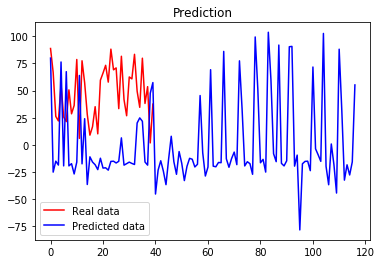

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 835us/step - loss: 18720804.0000
Epoch 2/100
12/12 [==============================] - 0s 917us/step - loss: 3489334.0000
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 1024027.4375
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 133959.7188
Epoch 5/100
12/12 [==============================] - 0s 914us/step - loss: 58852.8320
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 28808.3047
Epoch 7/100
12/12 [==============================] - 0s 831us/step - loss: 7844.8374
Epoch 8/100
12/12 [==============================] - 0s 916us/step - loss: 2904.1697
Epoch 9/100
12/12 [==============================] - 0s 915us/step - loss: 2300.6233
Epoch 10/100
12/12 [==============================] - 0s 997us/step - loss: 1587.5979
Epoch 11/100
12/12 [==============================] - 0s 914us/step - loss: 1229.9081
Epoch 12/100
12/12 [====================

12/12 [==============================] - 0s 1ms/step - loss: 1395.3650
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1193.2911
Epoch 99/100
12/12 [==============================] - 0s 1000us/step - loss: 1144.2465
Epoch 100/100
12/12 [==============================] - 0s 997us/step - loss: 1089.8721


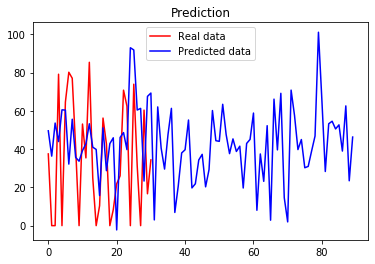

 12%|█▏        | 12/99 [02:27<17:47, 12.27s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 997us/step - loss: 458767.4062
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 65561.1641
Epoch 3/100
15/15 [==============================] - 0s 1000us/step - loss: 15782.4424
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 4652.7178
Epoch 5/100
15/15 [==============================] - 0s 997us/step - loss: 2871.1296
Epoch 6/100
15/15 [==============================] - 0s 997us/step - loss: 2063.5955
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 4940.9893
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 5065.7617
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 2346.9524
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 3846.2585
Epoch 11/100
15/15 [==============================] - 0s 997us/step - loss: 2669.3201
Epoch 12/100
15/15 [==============================]

15/15 [==============================] - 0s 997us/step - loss: 2104.4709
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1877.3102
Epoch 99/100
15/15 [==============================] - 0s 997us/step - loss: 2819.6787
Epoch 100/100
15/15 [==============================] - 0s 997us/step - loss: 1986.9686


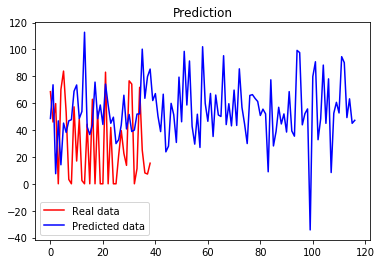

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 429198.1875
Epoch 2/100
15/15 [==============================] - 0s 864us/step - loss: 101108.0938
Epoch 3/100
15/15 [==============================] - 0s 934us/step - loss: 63650.1094
Epoch 4/100
15/15 [==============================] - 0s 997us/step - loss: 56266.1875
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 46905.0781
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 43348.6016
Epoch 7/100
15/15 [==============================] - 0s 864us/step - loss: 25407.5078
Epoch 8/100
15/15 [==============================] - 0s 930us/step - loss: 26077.8242
Epoch 9/100
15/15 [==============================] - 0s 864us/step - loss: 15718.0635
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 13861.6768
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 9066.1934
Epoch 12/100
15/15 [========================

15/15 [==============================] - 0s 1ms/step - loss: 2597.6538
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 3310.4368
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2276.0935
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1648.9697


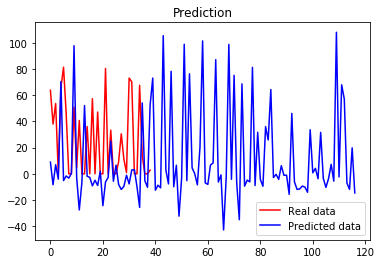

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 673563.5000
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 108617.6719
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 33902.1562
Epoch 4/100
15/15 [==============================] - 0s 933us/step - loss: 24487.7441
Epoch 5/100
15/15 [==============================] - 0s 997us/step - loss: 15877.1279
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 16079.6387
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 11790.1670
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 18161.8203
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 12307.3936
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 8231.4668
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 6283.3955
Epoch 12/100
15/15 [==============================] - 0

15/15 [==============================] - 0s 1ms/step - loss: 907.6849
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1416.2726
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 987.2841


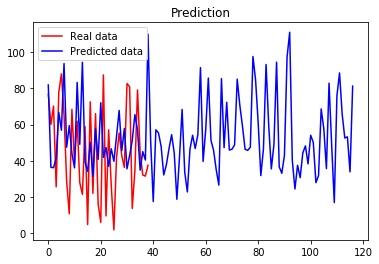

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 2161773.7500
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 326232.6562
Epoch 3/100
12/12 [==============================] - 0s 918us/step - loss: 98081.5234
Epoch 4/100
12/12 [==============================] - 0s 1000us/step - loss: 32182.8496
Epoch 5/100
12/12 [==============================] - 0s 998us/step - loss: 9792.3760
Epoch 6/100
12/12 [==============================] - 0s 917us/step - loss: 4291.0298
Epoch 7/100
12/12 [==============================] - 0s 997us/step - loss: 1830.0614
Epoch 8/100
12/12 [==============================] - 0s 997us/step - loss: 1327.7877
Epoch 9/100
12/12 [==============================] - 0s 997us/step - loss: 1296.3790
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 1289.7612
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1270.8192
Epoch 12/100
12/12 [==============================

12/12 [==============================] - 0s 997us/step - loss: 979.4077
Epoch 99/100
12/12 [==============================] - 0s 1000us/step - loss: 1340.2725
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1658.2501


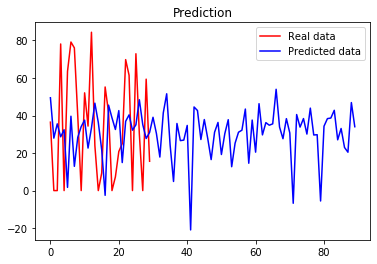

 13%|█▎        | 13/99 [02:39<17:32, 12.24s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 997us/step - loss: 2210947.2500
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 220204.1719
Epoch 3/100
15/15 [==============================] - 0s 1000us/step - loss: 54757.3438
Epoch 4/100
15/15 [==============================] - 0s 934us/step - loss: 12803.5000
Epoch 5/100
15/15 [==============================] - 0s 933us/step - loss: 5146.0005
Epoch 6/100
15/15 [==============================] - 0s 864us/step - loss: 2459.1975
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 1520.3319
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 1359.2540
Epoch 9/100
15/15 [==============================] - 0s 933us/step - loss: 1627.5510
Epoch 10/100
15/15 [==============================] - 0s 999us/step - loss: 2139.8511
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 1743.9454
Epoch 12/100
15/15 [============================

15/15 [==============================] - 0s 1ms/step - loss: 1738.8794
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1407.0217
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1045.3269
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1481.8710


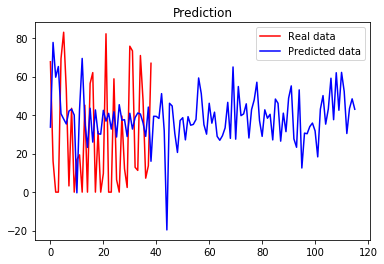

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 585830.2500
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 172593.6562
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 111864.8359
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 90332.1328
Epoch 5/100
15/15 [==============================] - 0s 975us/step - loss: 57016.7734
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 40263.6367
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 33296.7266
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 24318.4219
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 17799.4863
Epoch 10/100
15/15 [==============================] - 0s 997us/step - loss: 12130.4756
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 9932.3848
Epoch 12/100
15/15 [==============================]

15/15 [==============================] - 0s 1ms/step - loss: 447.7362
Epoch 99/100
15/15 [==============================] - 0s 997us/step - loss: 723.4156
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1067.0426


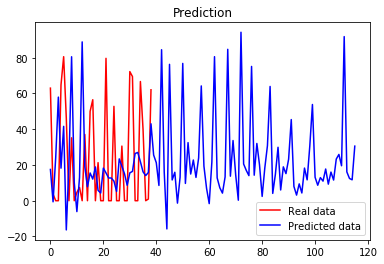

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 4830708.0000
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 728557.1875
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 161371.8906
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 104160.0156
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 46756.7188
Epoch 6/100
15/15 [==============================] - 0s 995us/step - loss: 34943.7188
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 31145.6816
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 25080.6602
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 25652.2852
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 21501.4941
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 20935.9531
Epoch 12/100
15/15 [==============================] - 0s 9

15/15 [==============================] - 0s 1ms/step - loss: 683.0889
Epoch 99/100
15/15 [==============================] - ETA: 0s - loss: 594.723 - 0s 1ms/step - loss: 675.5112
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 472.2623


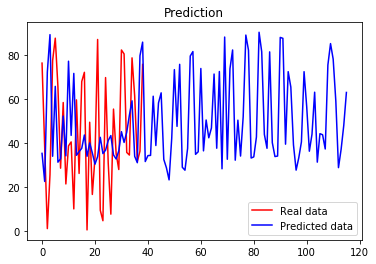

(132, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 694102.2500
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 132910.9688
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 57305.7695
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 18837.5293
Epoch 5/100
12/12 [==============================] - 0s 914us/step - loss: 14119.7910
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 10490.7207
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 8239.4717
Epoch 8/100
12/12 [==============================] - 0s 831us/step - loss: 8692.3086
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 6053.7261
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 6506.0854
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 5618.1318
Epoch 12/100
12/12 [==============================

12/12 [==============================] - 0s 1ms/step - loss: 1429.8765
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1430.2219
Epoch 99/100
12/12 [==============================] - 0s 997us/step - loss: 1286.9550
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1932.2664


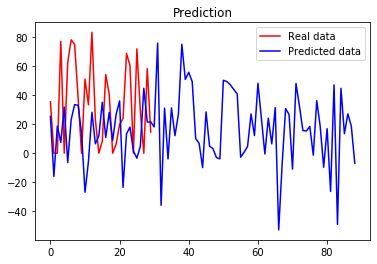

 14%|█▍        | 14/99 [02:52<17:30, 12.36s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 4528604.0000
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 551231.8125
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 121550.9922
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 19133.2891
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 7429.3374
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 1701.3698
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 950.2662
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 1033.6815
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 1008.5500
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 896.8024
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 844.7944
Epoch 12/100
15/15 [==============================] - 0s 1ms/step - los

15/15 [==============================] - 0s 1ms/step - loss: 734.3282
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 737.9807
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1134.5137


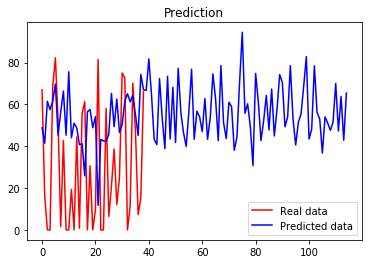

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 686644.3125
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 278950.4062
Epoch 3/100
15/15 [==============================] - 0s 997us/step - loss: 104483.0000
Epoch 4/100
15/15 [==============================] - 0s 997us/step - loss: 48344.4609
Epoch 5/100
15/15 [==============================] - 0s 933us/step - loss: 22940.1016
Epoch 6/100
15/15 [==============================] - 0s 997us/step - loss: 13035.1162
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 10424.2783
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 10277.5391
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 8583.4150
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 6587.6958
Epoch 11/100
15/15 [==============================] - 0s 933us/step - loss: 5807.5996
Epoch 12/100
15/15 [===========================

15/15 [==============================] - 0s 1ms/step - loss: 4298.1855
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 2651.5737
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 5162.9282
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1428.1626


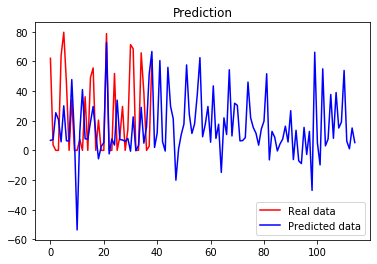

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 867us/step - loss: 10954569.0000
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 1505760.3750
Epoch 3/100
15/15 [==============================] - 0s 929us/step - loss: 546626.5000
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 391632.1250
Epoch 5/100
15/15 [==============================] - 0s 997us/step - loss: 267217.5938
Epoch 6/100
15/15 [==============================] - 0s 933us/step - loss: 210538.7500
Epoch 7/100
15/15 [==============================] - 0s 864us/step - loss: 178877.6719
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 170847.4219
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 143443.1250
Epoch 10/100
15/15 [==============================] - 0s 997us/step - loss: 127824.4062
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 111460.7422
Epoch 12/100
15/15 [=========

15/15 [==============================] - 0s 1ms/step - loss: 815.0470
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1026.3978
Epoch 99/100
15/15 [==============================] - 0s 997us/step - loss: 1307.0148
Epoch 100/100
15/15 [==============================] - 0s 1000us/step - loss: 1072.7086


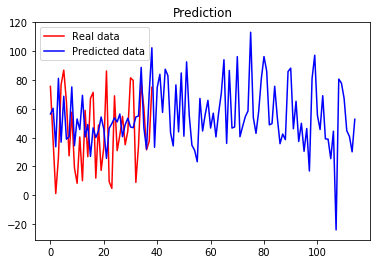

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 9462455.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 1284219.1250
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 420808.6250
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 138790.2344
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 41007.5742
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 20533.3457
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 10413.2139
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 5075.7246
Epoch 9/100
11/11 [==============================] - 0s 998us/step - loss: 4848.3271
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 4773.7891
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 4832.6270
Epoch 12/100
11/11 [==============================] - 0s 1ms/

11/11 [==============================] - 0s 1ms/step - loss: 4082.3657
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 3905.9304
Epoch 99/100
11/11 [==============================] - 0s 996us/step - loss: 4381.8589
Epoch 100/100
11/11 [==============================] - 0s 997us/step - loss: 6290.9487


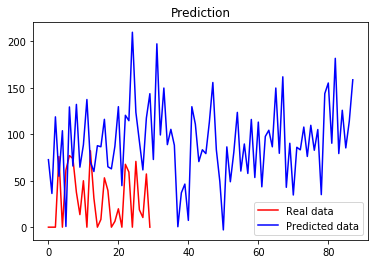

 15%|█▌        | 15/99 [03:04<17:07, 12.23s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 864us/step - loss: 241478.8906
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 39381.8164
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 8679.1748
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 2051.9170
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 1360.1266
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 1568.2163
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 1380.1379
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 1671.1798
Epoch 9/100
15/15 [==============================] - 0s 934us/step - loss: 2743.4619
Epoch 10/100
15/15 [==============================] - 0s 997us/step - loss: 2343.8457
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 2390.2844
Epoch 12/100
15/15 [==============================] - 0s 

15/15 [==============================] - 0s 1ms/step - loss: 1439.5951
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1876.4188
Epoch 99/100
15/15 [==============================] - 0s 997us/step - loss: 2333.0603
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1365.8129


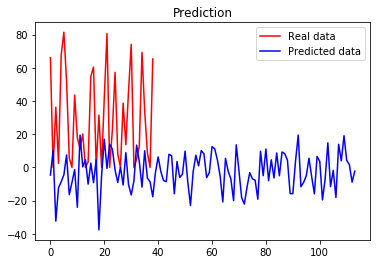

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 580033.2500
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 132200.0469
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 87969.2188
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 43182.1992
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 31103.0996
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 27681.3906
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 29571.9590
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 30356.3496
Epoch 9/100
15/15 [==============================] - 0s 997us/step - loss: 12641.2588
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 10325.8691
Epoch 11/100
15/15 [==============================] - 0s 997us/step - loss: 12529.2324
Epoch 12/100
15/15 [==============================] - 0s 1m

15/15 [==============================] - 0s 931us/step - loss: 1683.0520
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 624.1836
Epoch 99/100
15/15 [==============================] - 0s 997us/step - loss: 726.6870
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 592.7495


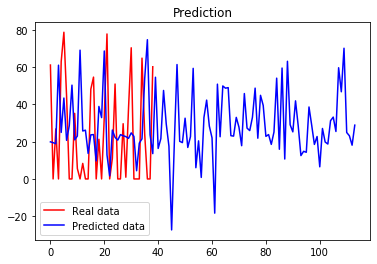

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 867us/step - loss: 3817635.7500
Epoch 2/100
15/15 [==============================] - 0s 997us/step - loss: 875914.8750
Epoch 3/100
15/15 [==============================] - 0s 954us/step - loss: 176050.5781
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 134119.3438
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 107513.2188
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 59686.9062
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 50648.6797
Epoch 8/100
15/15 [==============================] - 0s 934us/step - loss: 35029.7930
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 28813.3594
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 22213.4473
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 17670.8164
Epoch 12/100
15/15 [=================

15/15 [==============================] - 0s 1000us/step - loss: 1262.7648
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1970.6873
Epoch 99/100
15/15 [==============================] - 0s 931us/step - loss: 2117.1145
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 5206.0840


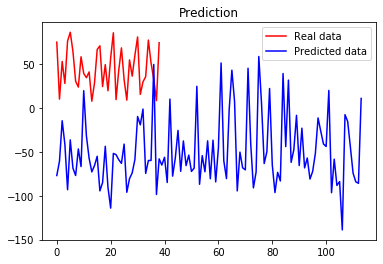

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 4065494.5000
Epoch 2/100
11/11 [==============================] - 0s 907us/step - loss: 818221.4375
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 287327.5938
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 88134.2500
Epoch 5/100
11/11 [==============================] - 0s 997us/step - loss: 29718.0840
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 9355.9092
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 5342.8784
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 2299.3196
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 1718.7743
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 1655.0914
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 1442.5632
Epoch 12/100
11/11 [==============================]

11/11 [==============================] - 0s 1ms/step - loss: 1435.6116
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1055.2478
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1212.9332
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1214.0662


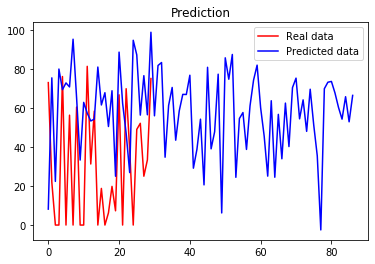

 16%|█▌        | 16/99 [03:16<16:50, 12.18s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1000us/step - loss: 6557741.0000
Epoch 2/100
15/15 [==============================] - 0s 864us/step - loss: 971860.6875
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 150832.5625
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 39099.8789
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 10049.8359
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 3318.0454
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 1208.8615
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 1216.1299
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 1187.7866
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 1084.3767
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 1070.0594
Epoch 12/100
15/15 [==========================

Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1329.0695
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1295.9517
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1403.0552


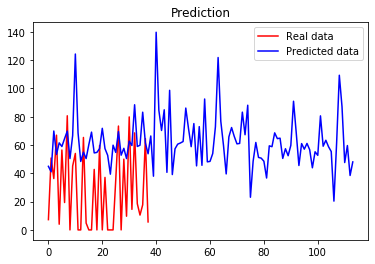

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 798us/step - loss: 516770.5938
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 194252.4219
Epoch 3/100
15/15 [==============================] - 0s 997us/step - loss: 86010.6875
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 57054.8125
Epoch 5/100
15/15 [==============================] - 0s 997us/step - loss: 38438.2188
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 36421.9062
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 31694.0293
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 28651.9941
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 25967.4961
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 19281.8203
Epoch 11/100
15/15 [==============================] - 0s 931us/step - loss: 17778.1582
Epoch 12/100
15/15 [=====================

15/15 [==============================] - 0s 1ms/step - loss: 1829.8859
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1431.4017
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 924.2538
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 2080.2500


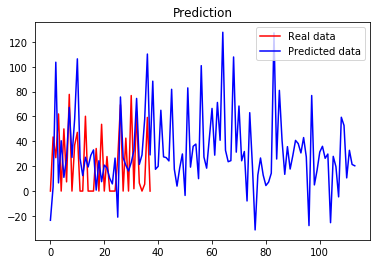

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 2553056.7500
Epoch 2/100
15/15 [==============================] - 0s 931us/step - loss: 518571.8125
Epoch 3/100
15/15 [==============================] - 0s 864us/step - loss: 314424.8750
Epoch 4/100
15/15 [==============================] - 0s 864us/step - loss: 218811.1562
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 153657.2031
Epoch 6/100
15/15 [==============================] - 0s 931us/step - loss: 106027.6328
Epoch 7/100
15/15 [==============================] - 0s 997us/step - loss: 99361.1953
Epoch 8/100
15/15 [==============================] - 0s 931us/step - loss: 96294.8984
Epoch 9/100
15/15 [==============================] - 0s 933us/step - loss: 62230.0781
Epoch 10/100
15/15 [==============================] - 0s 997us/step - loss: 50389.9648
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 53350.8438
Epoch 12/100
15/15 [==================

Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 2360.8848
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 2224.1091
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1177.9170


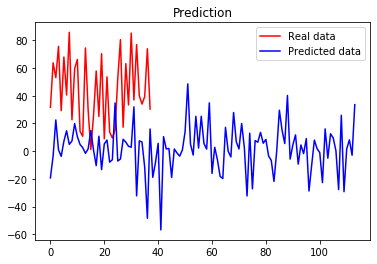

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 1282376.8750
Epoch 2/100
11/11 [==============================] - 0s 994us/step - loss: 197682.9844
Epoch 3/100
11/11 [==============================] - 0s 911us/step - loss: 88427.3984
Epoch 4/100
11/11 [==============================] - 0s 906us/step - loss: 25755.6758
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 11752.4375
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 8325.2822
Epoch 7/100
11/11 [==============================] - 0s 997us/step - loss: 5934.7588
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 5610.6978
Epoch 9/100
11/11 [==============================] - 0s 910us/step - loss: 5122.7954
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 4349.5049
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 4575.8633
Epoch 12/100
11/11 [==============================

11/11 [==============================] - 0s 1ms/step - loss: 2287.4636
Epoch 98/100
11/11 [==============================] - ETA: 0s - loss: 3082.80 - 0s 1ms/step - loss: 3257.9656
Epoch 99/100
11/11 [==============================] - 0s 910us/step - loss: 8401.0312
Epoch 100/100
11/11 [==============================] - 0s 2ms/step - loss: 8425.5996


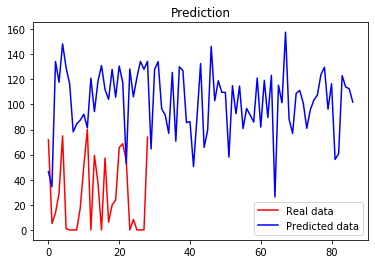

 17%|█▋        | 17/99 [03:28<16:44, 12.25s/it]

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 1ms/step - loss: 534991.4375
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 81963.2578
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 14423.8047
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 5212.3442
Epoch 5/100
15/15 [==============================] - 0s 1ms/step - loss: 2410.9861
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 1806.3413
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 2051.6304
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 1806.0475
Epoch 9/100
15/15 [==============================] - 0s 1ms/step - loss: 1783.3212
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 1905.0502
Epoch 11/100
15/15 [==============================] - 0s 1ms/step - loss: 1779.2123
Epoch 12/100
15/15 [==============================] - 0s 1ms/step - loss

15/15 [==============================] - 0s 1ms/step - loss: 2080.7891
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1581.2882
Epoch 99/100
15/15 [==============================] - 0s 1000us/step - loss: 2899.2212
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 1444.6815


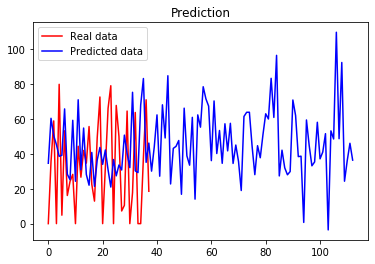

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 865us/step - loss: 1593143.8750
Epoch 2/100
15/15 [==============================] - 0s 867us/step - loss: 144162.4688
Epoch 3/100
15/15 [==============================] - 0s 867us/step - loss: 95843.0938
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 72741.9141
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 64546.6133
Epoch 6/100
15/15 [==============================] - 0s 932us/step - loss: 68670.3750
Epoch 7/100
15/15 [==============================] - 0s 864us/step - loss: 62763.3438
Epoch 8/100
15/15 [==============================] - 0s 934us/step - loss: 61311.5195
Epoch 9/100
15/15 [==============================] - 0s 931us/step - loss: 56781.4102
Epoch 10/100
15/15 [==============================] - 0s 931us/step - loss: 56665.2383
Epoch 11/100
15/15 [==============================] - 0s 995us/step - loss: 51720.2930
Epoch 12/100
15/15 [====================

15/15 [==============================] - 0s 1ms/step - loss: 3469.1873
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 1992.4730
Epoch 99/100
15/15 [==============================] - 0s 1ms/step - loss: 1122.9811
Epoch 100/100
15/15 [==============================] - 0s 1ms/step - loss: 2398.9883


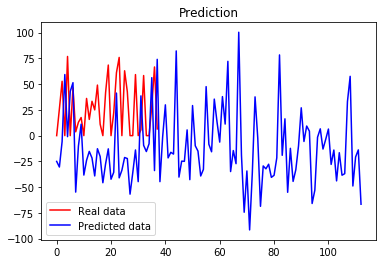

(168, 4)
Epoch 1/100
15/15 [==============================] - 0s 931us/step - loss: 6040828.0000
Epoch 2/100
15/15 [==============================] - 0s 932us/step - loss: 1150921.2500
Epoch 3/100
15/15 [==============================] - 0s 931us/step - loss: 243218.9688
Epoch 4/100
15/15 [==============================] - 0s 931us/step - loss: 107647.6250
Epoch 5/100
15/15 [==============================] - 0s 931us/step - loss: 61330.1602
Epoch 6/100
15/15 [==============================] - 0s 928us/step - loss: 51617.9297
Epoch 7/100
15/15 [==============================] - 0s 931us/step - loss: 45686.5039
Epoch 8/100
15/15 [==============================] - 0s 864us/step - loss: 42853.0977
Epoch 9/100
15/15 [==============================] - 0s 934us/step - loss: 41527.4531
Epoch 10/100
15/15 [==============================] - 0s 933us/step - loss: 36474.0312
Epoch 11/100
15/15 [==============================] - 0s 997us/step - loss: 33299.6719
Epoch 12/100
15/15 [=================

15/15 [==============================] - 0s 1ms/step - loss: 626.2360
Epoch 98/100
15/15 [==============================] - 0s 1ms/step - loss: 452.5315
Epoch 99/100
15/15 [==============================] - 0s 931us/step - loss: 573.8970
Epoch 100/100
15/15 [==============================] - 0s 997us/step - loss: 476.2950


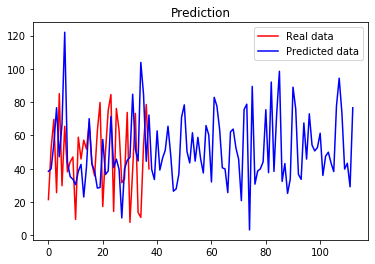

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 812us/step - loss: 531784.8125
Epoch 2/100
11/11 [==============================] - 0s 910us/step - loss: 106807.1641
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 47148.3125
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 18757.7988
Epoch 5/100
11/11 [==============================] - 0s 910us/step - loss: 22846.9453
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 9240.3086
Epoch 7/100
11/11 [==============================] - 0s 997us/step - loss: 10174.2012
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 6360.4717
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 6519.7739
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 6919.9297
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 8462.7891
Epoch 12/100
11/11 [==============================] 

11/11 [==============================] - 0s 1ms/step - loss: 2077.9116
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1649.3608
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1875.9618


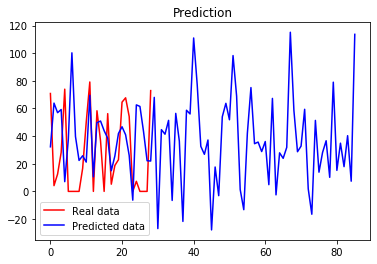

 18%|█▊        | 18/99 [03:40<16:23, 12.14s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 921167.6250
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 157462.4219
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 37589.9609
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 8681.5889
Epoch 5/100
14/14 [==============================] - 0s 996us/step - loss: 4330.7739
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 3806.3455
Epoch 7/100
14/14 [==============================] - 0s 953us/step - loss: 4703.1997
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 4065.3948
Epoch 9/100
14/14 [==============================] - 0s 1000us/step - loss: 4224.2573
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 4050.9163
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 3897.0918
Epoch 12/100
14/14 [==============================] - 0s 997us

14/14 [==============================] - 0s 929us/step - loss: 2410.0911
Epoch 98/100
14/14 [==============================] - 0s 997us/step - loss: 1508.6677
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1297.5625
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1026.8011


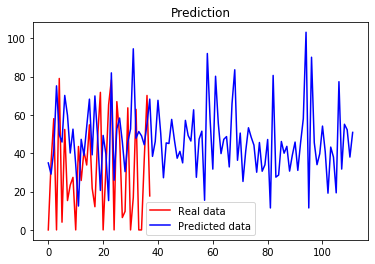

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 780us/step - loss: 827526.6250
Epoch 2/100
14/14 [==============================] - 0s 784us/step - loss: 453647.0625
Epoch 3/100
14/14 [==============================] - 0s 855us/step - loss: 147436.8906
Epoch 4/100
14/14 [==============================] - 0s 855us/step - loss: 42368.7773
Epoch 5/100
14/14 [==============================] - 0s 855us/step - loss: 34361.7930
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 34799.2148
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 32404.0664
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 23871.5410
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 23615.8457
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 21825.0801
Epoch 11/100
14/14 [==============================] - ETA: 0s - loss: 1220.04 - 0s 926us/step - loss: 14304.8096
Epoch 12/100
1

Epoch 97/100
14/14 [==============================] - 0s 997us/step - loss: 2297.7781
Epoch 98/100
14/14 [==============================] - 0s 997us/step - loss: 1159.0129
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 2092.4507
Epoch 100/100
14/14 [==============================] - 0s 1000us/step - loss: 1539.1071


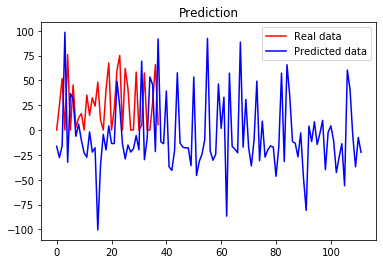

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 2389815.0000
Epoch 2/100
14/14 [==============================] - 0s 997us/step - loss: 409989.8438
Epoch 3/100
14/14 [==============================] - 0s 855us/step - loss: 244632.5000
Epoch 4/100
14/14 [==============================] - 0s 855us/step - loss: 122263.8594
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 76231.4453
Epoch 6/100
14/14 [==============================] - 0s 858us/step - loss: 58076.1289
Epoch 7/100
14/14 [==============================] - 0s 855us/step - loss: 54469.3711
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 41290.1484
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 39065.5586
Epoch 10/100
14/14 [==============================] - 0s 855us/step - loss: 24379.5352
Epoch 11/100
14/14 [==============================] - 0s 929us/step - loss: 21792.1230
Epoch 12/100
14/14 [==================

14/14 [==============================] - 0s 1ms/step - loss: 1254.7268
Epoch 97/100
14/14 [==============================] - 0s 1ms/step - loss: 403.0033
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 478.4956
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 587.7889
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 676.1420


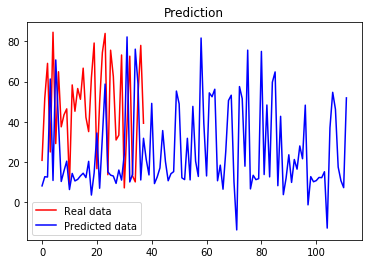

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 2787064.0000
Epoch 2/100
11/11 [==============================] - 0s 911us/step - loss: 489546.7812
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 218048.7969
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 54449.5703
Epoch 5/100
11/11 [==============================] - 0s 997us/step - loss: 33749.0430
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 14152.5352
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 7963.2163
Epoch 8/100
11/11 [==============================] - 0s 910us/step - loss: 10209.3105
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 7637.6792
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 7762.1719
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 9133.5264
Epoch 12/100
11/11 [===========================

11/11 [==============================] - 0s 1ms/step - loss: 5459.7612
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 3679.3904
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3722.7065
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3330.2808


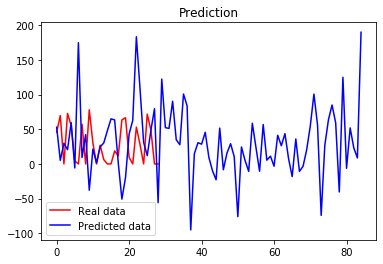

 19%|█▉        | 19/99 [03:51<15:56, 11.95s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 798322.2500
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 102135.5547
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 18653.3496
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 6251.0107
Epoch 5/100
14/14 [==============================] - 0s 997us/step - loss: 2943.6963
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 2324.5540
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 2695.7642
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 2343.1650
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 2120.7505
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 3390.0918
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 3913.3386
Epoch 12/100
14/14 [=============================

14/14 [==============================] - 0s 2ms/step - loss: 1803.2922
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1336.0475
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 2252.4895
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1131.8116


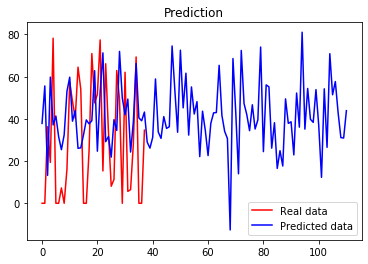

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 823787.2500
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 248181.6094
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 158419.4062
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 135215.8125
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 61238.1367
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 68845.9062
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 48007.3789
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 38480.0273
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 48726.2891
Epoch 10/100
14/14 [==============================] - 0s 926us/step - loss: 29363.5254
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 37882.8477
Epoch 12/100
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 1ms/step - loss: 3985.8259
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 4856.4912
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1952.2277


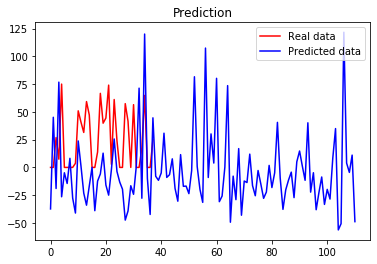

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 13519902.0000
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 1591093.8750
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 567675.5625
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 241358.9844
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 100719.4297
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 97758.4219
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 84190.8281
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 73402.9062
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 64561.0391
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 73217.3984
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 61582.5938
Epoch 12/100
14/14 [=======================

14/14 [==============================] - 0s 997us/step - loss: 1832.5182
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 2282.3867
Epoch 99/100
14/14 [==============================] - 0s 928us/step - loss: 1778.4308
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1780.1722


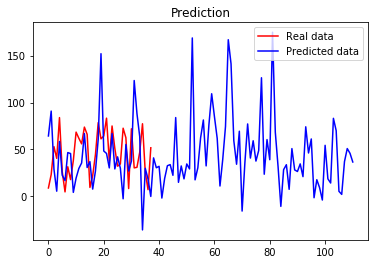

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 448232.8438
Epoch 2/100
11/11 [==============================] - 0s 816us/step - loss: 95342.9844
Epoch 3/100
11/11 [==============================] - 0s 816us/step - loss: 35900.0117
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 17049.2793
Epoch 5/100
11/11 [==============================] - 0s 910us/step - loss: 7236.3906
Epoch 6/100
11/11 [==============================] - 0s 906us/step - loss: 6173.4834
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 5189.9951
Epoch 8/100
11/11 [==============================] - 0s 907us/step - loss: 3439.7935
Epoch 9/100
11/11 [==============================] - 0s 910us/step - loss: 4725.6372
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 5371.2310
Epoch 11/100
11/11 [==============================] - 0s 998us/step - loss: 3025.4402
Epoch 12/100
11/11 [==============================]

11/11 [==============================] - 0s 1ms/step - loss: 932.2692
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 855.2161
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 977.4137


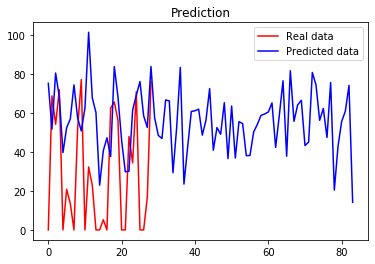

 20%|██        | 20/99 [04:03<15:47, 11.99s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 997us/step - loss: 2459918.2500
Epoch 2/100
14/14 [==============================] - 0s 929us/step - loss: 489482.6875
Epoch 3/100
14/14 [==============================] - 0s 930us/step - loss: 110112.9297
Epoch 4/100
14/14 [==============================] - 0s 855us/step - loss: 28408.8242
Epoch 5/100
14/14 [==============================] - 0s 997us/step - loss: 7904.6948
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 4471.3916
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 2606.0308
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 1750.5862
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 1533.8882
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 1728.4714
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 1479.9590
Epoch 12/100
14/14 [==============================] - 

14/14 [==============================] - 0s 1ms/step - loss: 1395.9349
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1891.3389
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1327.5765


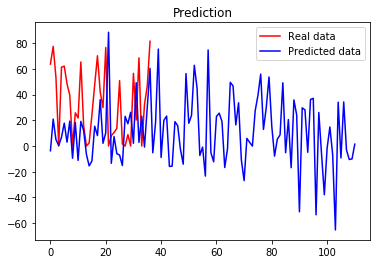

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 1169093.5000
Epoch 2/100
14/14 [==============================] - 0s 784us/step - loss: 169170.2188
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 57613.4805
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 43978.4492
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 40686.6211
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 35832.7031
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 32861.6680
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 26219.1191
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 22925.7441
Epoch 10/100
14/14 [==============================] - 0s 926us/step - loss: 22694.1270
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 20475.6523
Epoch 12/100
14/14 [======================

14/14 [==============================] - 0s 1ms/step - loss: 616.6583
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 888.8799
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 455.2828
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 481.0565


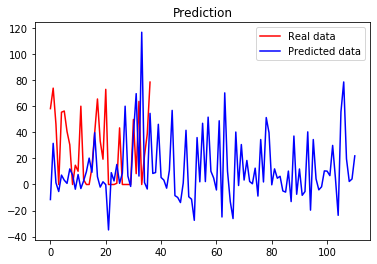

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 997us/step - loss: 1480138.3750
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 288105.0000
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 165831.2031
Epoch 4/100
14/14 [==============================] - 0s 929us/step - loss: 141769.0156
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 114851.2891
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 136032.3281
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 91409.3359
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 116280.1875
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 80511.6406
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 47570.5234
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 43997.2031
Epoch 12/100
14/14 [=============================

14/14 [==============================] - 0s 1ms/step - loss: 750.4561
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1197.3538
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 805.7922


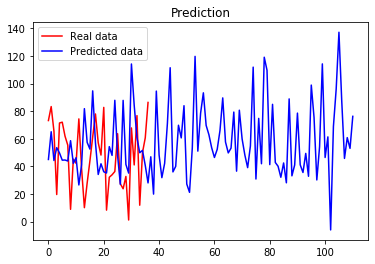

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 564804.8125
Epoch 2/100
11/11 [==============================] - 0s 907us/step - loss: 90588.2422
Epoch 3/100
11/11 [==============================] - 0s 911us/step - loss: 34921.4922
Epoch 4/100
11/11 [==============================] - 0s 816us/step - loss: 17045.6348
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 3773.5205
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 4086.9810
Epoch 7/100
11/11 [==============================] - 0s 997us/step - loss: 4247.7437
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 4553.4976
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 5527.9321
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 3054.6926
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 3466.1306
Epoch 12/100
11/11 [==============================]

11/11 [==============================] - 0s 998us/step - loss: 1983.4623
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1366.8125
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1974.7794
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2405.1299


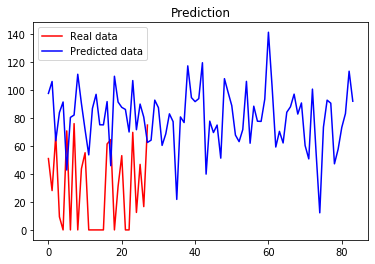

 21%|██        | 21/99 [04:16<15:52, 12.21s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 912609.8750
Epoch 2/100
14/14 [==============================] - 0s 995us/step - loss: 179006.2344
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 40466.6328
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 11519.4297
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 3033.2009
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 1735.7520
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 1532.3959
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 1395.6304
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 1542.9419
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 1164.8259
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 1324.5441
Epoch 12/100
14/14 [==============================] - 0s 1ms/step 

14/14 [==============================] - 0s 926us/step - loss: 3526.7864
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 3151.3540
Epoch 100/100
14/14 [==============================] - 0s 997us/step - loss: 3330.4790


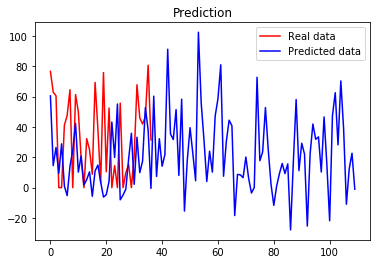

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 811785.8750
Epoch 2/100
14/14 [==============================] - 0s 930us/step - loss: 130170.0781
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 74400.2266
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 45244.8242
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 62989.2891
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 28640.2949
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 21773.5586
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 18139.0215
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 19350.2129
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 17591.4941
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 14114.6641
Epoch 12/100
14/14 [=======================

14/14 [==============================] - 0s 926us/step - loss: 751.6086
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 958.8196
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1867.7996
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1003.7668


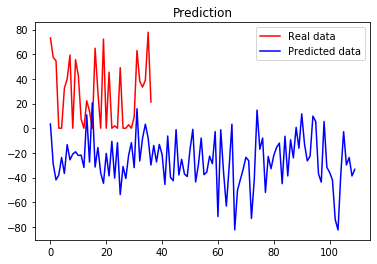

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 1091892.6250
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 418185.2812
Epoch 3/100
14/14 [==============================] - 0s 857us/step - loss: 202136.9688
Epoch 4/100
14/14 [==============================] - 0s 929us/step - loss: 111981.0391
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 82728.7031
Epoch 6/100
14/14 [==============================] - 0s 855us/step - loss: 65977.3281
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 40003.4062
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 35424.8008
Epoch 9/100
14/14 [==============================] - 0s 929us/step - loss: 20290.5020
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 20291.3730
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 14432.7754
Epoch 12/100
14/14 [====================

14/14 [==============================] - 0s 1ms/step - loss: 2402.3042
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1859.2445
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 663.3792
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1298.2805


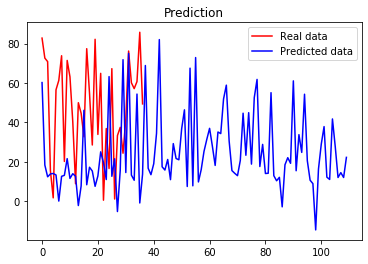

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 1163039.2500
Epoch 2/100
11/11 [==============================] - 0s 816us/step - loss: 251362.7188
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 93854.9062
Epoch 4/100
11/11 [==============================] - 0s 998us/step - loss: 41334.8477
Epoch 5/100
11/11 [==============================] - 0s 999us/step - loss: 13670.3857
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 6415.3843
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 5928.2739
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 7091.7539
Epoch 9/100
11/11 [==============================] - 0s 907us/step - loss: 6043.6587
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 5938.2607
Epoch 11/100
11/11 [==============================] - 0s 907us/step - loss: 7545.4448
Epoch 12/100
11/11 [==============================] 

11/11 [==============================] - 0s 2ms/step - loss: 3651.3079
Epoch 98/100
11/11 [==============================] - 0s 2ms/step - loss: 12252.0840
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 11264.7812
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 16055.1465


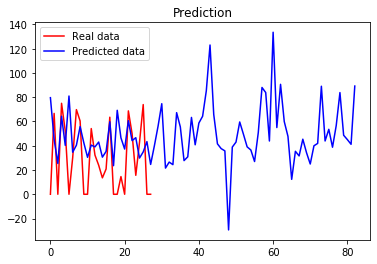

 22%|██▏       | 22/99 [04:28<15:30, 12.08s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 1542551.2500
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 285980.5938
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 77353.4062
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 24551.8652
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 9486.2021
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 3800.2839
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 3261.5642
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 2226.9019
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 2090.1265
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 2074.9172
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 1980.3438
Epoch 12/100
14/14 [==============================] - 0s 996us/step

Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 3529.6370
Epoch 99/100
14/14 [==============================] - 0s 926us/step - loss: 3798.0061
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 3805.6848


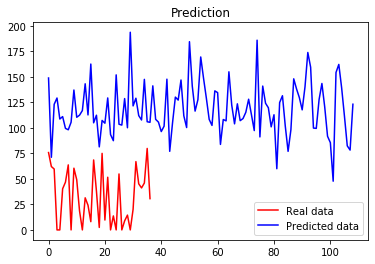

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 2299924.2500
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 453440.0312
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 141777.9219
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 69046.7891
Epoch 5/100
14/14 [==============================] - 0s 929us/step - loss: 49010.2383
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 39253.5078
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 32721.4219
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 25440.7207
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 23568.0820
Epoch 10/100
14/14 [==============================] - 0s 999us/step - loss: 19101.9023
Epoch 11/100
14/14 [==============================] - 0s 998us/step - loss: 17578.2617
Epoch 12/100
14/14 [===================

14/14 [==============================] - 0s 1ms/step - loss: 908.9733
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 899.7481
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 900.6613
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1241.1376


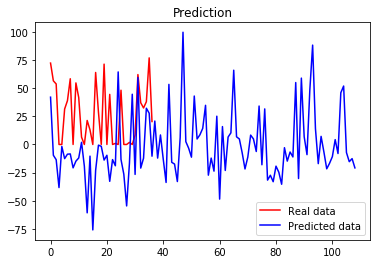

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 3841468.0000
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 605465.6250
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 501167.0000
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 227397.4375
Epoch 5/100
14/14 [==============================] - 0s 928us/step - loss: 160216.7500
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 164767.9688
Epoch 7/100
14/14 [==============================] - 0s 996us/step - loss: 125871.9609
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 115318.7969
Epoch 9/100
14/14 [==============================] - 0s 998us/step - loss: 132124.5000
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 104995.4297
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 100301.3281
Epoch 12/100
14/14 [=============

14/14 [==============================] - 0s 1ms/step - loss: 1929.4385
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1316.0157
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1219.3010
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1694.2141


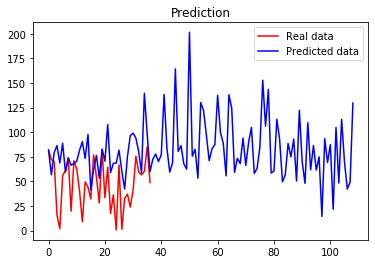

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 1238915.1250
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 247376.8750
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 86414.7344
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 45086.0039
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 22101.2617
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 10382.0576
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 4140.7388
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 2760.2043
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 2623.9485
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 2419.0229
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 2681.0884
Epoch 12/100
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 1ms/step - loss: 14506.2041
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 16181.4375
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 4270.1377


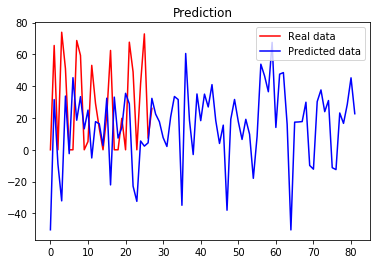

 23%|██▎       | 23/99 [04:40<15:10, 11.98s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 2430139.5000
Epoch 2/100
14/14 [==============================] - 0s 858us/step - loss: 390186.4062
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 88030.3828
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 18750.4805
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 6450.8950
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 3506.6240
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 1846.9734
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 1748.9275
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 1889.9554
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 1892.7362
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 1657.8712
Epoch 12/100
14/14 [==============================]

14/14 [==============================] - 0s 1ms/step - loss: 1752.9291
Epoch 98/100
14/14 [==============================] - 0s 997us/step - loss: 1584.7498
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 1427.7085
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 2563.5090


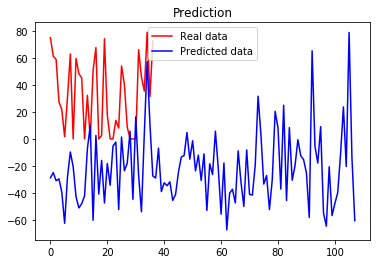

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 924733.1875
Epoch 2/100
14/14 [==============================] - 0s 997us/step - loss: 334330.0000
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 194692.1406
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 119556.6953
Epoch 5/100
14/14 [==============================] - 0s 997us/step - loss: 91088.5625
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 68847.3516
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 41643.6094
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 47690.2656
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 35691.0039
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 25999.7246
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 22029.3086
Epoch 12/100
14/14 [===========================

14/14 [==============================] - 0s 1ms/step - loss: 2841.2109
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1821.6860
Epoch 99/100
14/14 [==============================] - 0s 2ms/step - loss: 2886.4844
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1337.8125


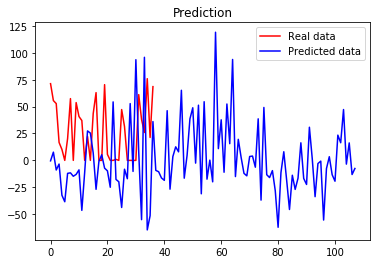

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 784us/step - loss: 1252556.7500
Epoch 2/100
14/14 [==============================] - 0s 857us/step - loss: 317655.1562
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 74380.5312
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 41669.9570
Epoch 5/100
14/14 [==============================] - 0s 857us/step - loss: 34904.1680
Epoch 6/100
14/14 [==============================] - 0s 929us/step - loss: 32199.8027
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 27208.0547
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 17409.5547
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 14158.9961
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 15808.8193
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 12455.6650
Epoch 12/100
14/14 [==========================

14/14 [==============================] - 0s 1ms/step - loss: 525.4199
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 448.2162
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 893.2433
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 621.0568


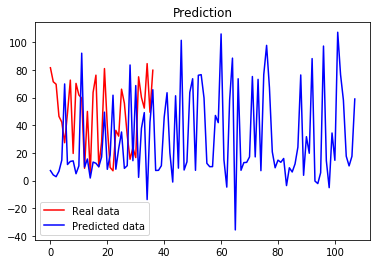

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 6688034.0000
Epoch 2/100
11/11 [==============================] - 0s 816us/step - loss: 877991.5000
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 218124.4375
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 65585.4844
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 23125.8672
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 9221.5947
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 3577.8125
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 1796.5656
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 1951.9326
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 1818.5426
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 1381.8152
Epoch 12/100
11/11 [==============================] - 0s 1m

11/11 [==============================] - 0s 1ms/step - loss: 1232.0105
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1406.8619
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1138.7271


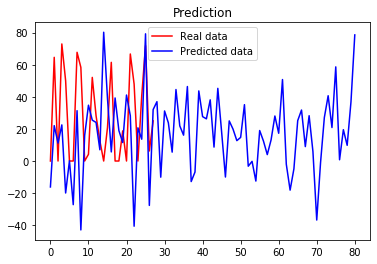

 24%|██▍       | 24/99 [04:52<15:03, 12.05s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 7754190.0000
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 1265447.0000
Epoch 3/100
14/14 [==============================] - 0s 855us/step - loss: 276923.3125
Epoch 4/100
14/14 [==============================] - 0s 855us/step - loss: 76591.1719
Epoch 5/100
14/14 [==============================] - 0s 997us/step - loss: 17791.8105
Epoch 6/100
14/14 [==============================] - 0s 995us/step - loss: 5739.8311
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 3301.5916
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 3084.7424
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 3124.8708
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 3099.6575
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 3315.0637
Epoch 12/100
14/14 [==============================

14/14 [==============================] - 0s 1ms/step - loss: 2719.1479
Epoch 98/100
14/14 [==============================] - 0s 929us/step - loss: 3978.0859
Epoch 99/100
14/14 [==============================] - 0s 928us/step - loss: 2254.0271
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1965.7316


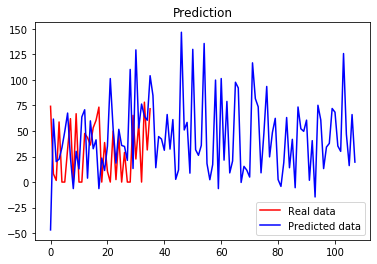

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 4627875.0000
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 1045115.5625
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 313716.2812
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 180481.7969
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 89843.1406
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 79893.7891
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 74640.3438
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 53509.8438
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 49759.3828
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 50925.3438
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 48515.5078
Epoch 12/100
14/14 [=====================

14/14 [==============================] - 0s 1ms/step - loss: 1573.8477
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1428.6909
Epoch 99/100
14/14 [==============================] - 0s 926us/step - loss: 1568.6827
Epoch 100/100
14/14 [==============================] - 0s 999us/step - loss: 2166.1174


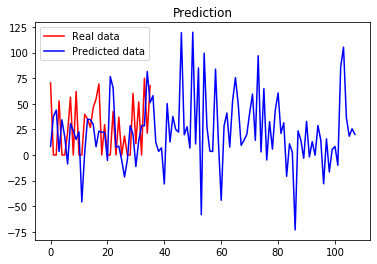

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 997us/step - loss: 2447408.2500
Epoch 2/100
14/14 [==============================] - 0s 930us/step - loss: 880241.0625
Epoch 3/100
14/14 [==============================] - 0s 994us/step - loss: 413647.0000
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 299257.5312
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 204612.6875
Epoch 6/100
14/14 [==============================] - 0s 855us/step - loss: 207695.9844
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 162219.2188
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 204840.7812
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 167564.9219
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 122093.7109
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 116655.3516
Epoch 12/100
14/14 [===============

14/14 [==============================] - 0s 1ms/step - loss: 1355.6669
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 885.5182
Epoch 99/100
14/14 [==============================] - 0s 1000us/step - loss: 1360.1870
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1552.1749


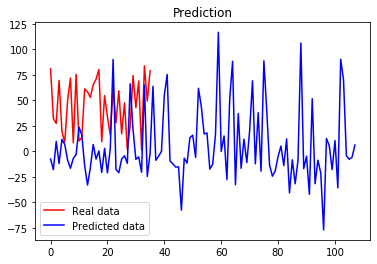

(132, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 8566658.0000
Epoch 2/100
11/11 [==============================] - 0s 725us/step - loss: 1139922.1250
Epoch 3/100
11/11 [==============================] - 0s 998us/step - loss: 316127.3438
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 110623.4453
Epoch 5/100
11/11 [==============================] - 0s 997us/step - loss: 50229.9492
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 18259.4570
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 9983.6279
Epoch 8/100
11/11 [==============================] - 0s 907us/step - loss: 12550.3213
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 12160.1709
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 8122.6875
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 8334.0732
Epoch 12/100
11/11 [====================

11/11 [==============================] - 0s 1ms/step - loss: 4268.4492
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 3913.5540
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3322.9089
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1750.2074


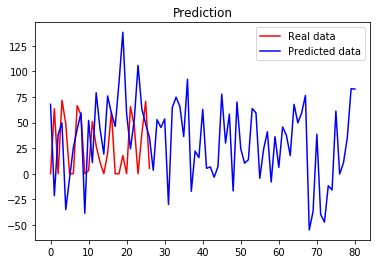

 25%|██▌       | 25/99 [05:04<14:49, 12.02s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 2ms/step - loss: 3154145.7500
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 380624.0000
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 86014.7500
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 28234.1953
Epoch 5/100
14/14 [==============================] - 0s 997us/step - loss: 8731.6533
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 3541.0129
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 2037.2268
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 1583.0647
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 1407.2245
Epoch 10/100
14/14 [==============================] - 0s 926us/step - loss: 1364.7743
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 1299.1355
Epoch 12/100
14/14 [==============================] - 0s 1ms/step

14/14 [==============================] - 0s 926us/step - loss: 2442.5649
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1520.5425
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 2888.9512
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 3023.2798


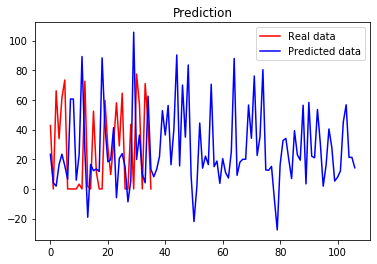

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 2028674.1250
Epoch 2/100
14/14 [==============================] - 0s 929us/step - loss: 352800.7188
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 301548.3438
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 106531.5703
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 100407.3281
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 68668.2422
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 50798.9062
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 55792.1953
Epoch 9/100
14/14 [==============================] - 0s 858us/step - loss: 46955.8555
Epoch 10/100
14/14 [==============================] - 0s 1000us/step - loss: 32836.3047
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 24890.4180
Epoch 12/100
14/14 [====================

14/14 [==============================] - 0s 1ms/step - loss: 1288.0278
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 661.7543
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 643.9523
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 608.3276


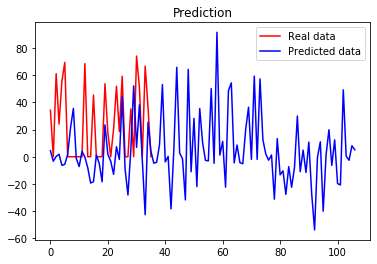

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 1923070.7500
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 412232.1250
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 134671.8594
Epoch 4/100
14/14 [==============================] - 0s 2ms/step - loss: 72080.2500
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 75720.8281
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 76247.4141
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 54040.0234
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 40081.5898
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 49377.0195
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 36311.2344
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 27127.9453
Epoch 12/100
14/14 [==============================] - 0s 1m

14/14 [==============================] - 0s 997us/step - loss: 697.5782
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 815.1824
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 498.4533
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 514.0417


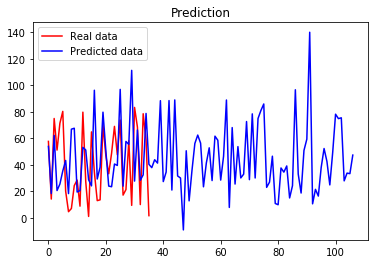

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 1804083.6250
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 537188.5000
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 195187.1875
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 91369.8906
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 55654.3984
Epoch 6/100
10/10 [==============================] - 0s 898us/step - loss: 26717.8535
Epoch 7/100
10/10 [==============================] - 0s 898us/step - loss: 18020.5664
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 17042.8398
Epoch 9/100
10/10 [==============================] - 0s 898us/step - loss: 11292.8740
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 8899.2090
Epoch 11/100
10/10 [==============================] - 0s 897us/step - loss: 9950.8965
Epoch 12/100
10/10 [=======================

10/10 [==============================] - 0s 1ms/step - loss: 3186.1836
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2732.6775
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2991.7974
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 3449.8188


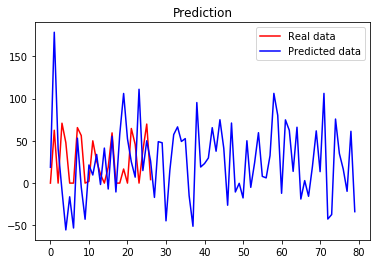

 26%|██▋       | 26/99 [05:15<14:26, 11.87s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 22254222.0000
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 2257238.2500
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 502831.1250
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 123898.1250
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 38435.8164
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 15533.5488
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 6640.9072
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 3147.3840
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 3081.2898
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 2688.0737
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 2710.1816
Epoch 12/100
14/14 [==============================] - 0s 1ms/st

14/14 [==============================] - 0s 1ms/step - loss: 1621.9226
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1660.7529
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 2105.9248
Epoch 100/100
14/14 [==============================] - 0s 926us/step - loss: 1912.5094


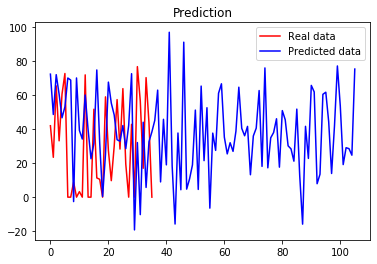

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 6511386.0000
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 995935.0000
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 283317.5625
Epoch 4/100
14/14 [==============================] - 0s 855us/step - loss: 90414.5156
Epoch 5/100
14/14 [==============================] - 0s 923us/step - loss: 63038.8398
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 56052.1836
Epoch 7/100
14/14 [==============================] - 0s 926us/step - loss: 47191.9961
Epoch 8/100
14/14 [==============================] - 0s 999us/step - loss: 44307.4531
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 48840.6172
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 44350.0430
Epoch 11/100
14/14 [==============================] - 0s 926us/step - loss: 42017.6172
Epoch 12/100
14/14 [=====================

14/14 [==============================] - 0s 1ms/step - loss: 2503.0044
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 4009.2271
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1712.2527
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 2114.7346


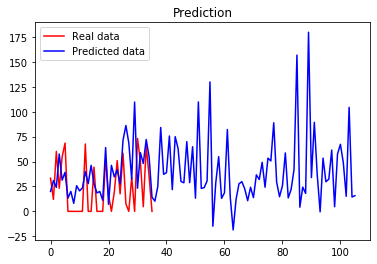

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 855us/step - loss: 2756594.0000
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 532232.6250
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 231224.9062
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 130401.7188
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 105844.1484
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 94010.9141
Epoch 7/100
14/14 [==============================] - 0s 855us/step - loss: 87733.3047
Epoch 8/100
14/14 [==============================] - 0s 929us/step - loss: 60008.0938
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 59749.9062
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 53576.0469
Epoch 11/100
14/14 [==============================] - 0s 995us/step - loss: 95226.5156
Epoch 12/100
14/14 [=======================

14/14 [==============================] - 0s 1ms/step - loss: 1325.5823
Epoch 98/100
14/14 [==============================] - 0s 926us/step - loss: 1197.7594
Epoch 99/100
14/14 [==============================] - 0s 926us/step - loss: 2057.7336
Epoch 100/100
14/14 [==============================] - 0s 997us/step - loss: 1451.2699


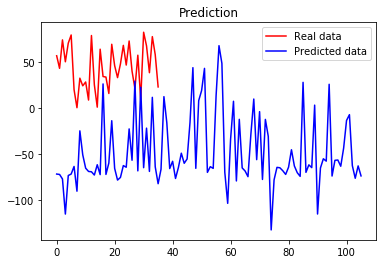

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 1825145.5000
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 330117.6875
Epoch 3/100
10/10 [==============================] - 0s 897us/step - loss: 130635.2188
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 51608.6641
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 23049.3262
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 10162.9600
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 16098.7344
Epoch 8/100
10/10 [==============================] - 0s 997us/step - loss: 16793.9570
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 9870.3418
Epoch 10/100
10/10 [==============================] - 0s 2ms/step - loss: 5596.6738
Epoch 11/100
10/10 [==============================] - 0s 898us/step - loss: 5231.5181
Epoch 12/100
10/10 [==============================] 

10/10 [==============================] - 0s 1ms/step - loss: 3224.5605
Epoch 98/100
10/10 [==============================] - 0s 997us/step - loss: 2818.6748
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 5779.3047
Epoch 100/100
10/10 [==============================] - 0s 997us/step - loss: 6704.3843


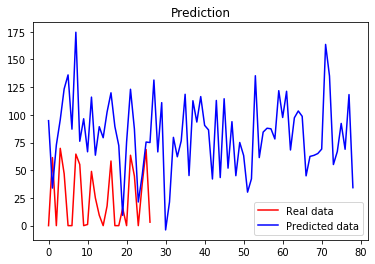

 27%|██▋       | 27/99 [05:28<14:19, 11.94s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 973076.4375
Epoch 2/100
14/14 [==============================] - 0s 784us/step - loss: 131266.4375
Epoch 3/100
14/14 [==============================] - 0s 997us/step - loss: 41974.6719
Epoch 4/100
14/14 [==============================] - 0s 929us/step - loss: 9785.6807
Epoch 5/100
14/14 [==============================] - 0s 1000us/step - loss: 2600.7666
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 5396.3105
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 2616.6414
Epoch 8/100
14/14 [==============================] - 0s 999us/step - loss: 1818.4275
Epoch 9/100
14/14 [==============================] - 0s 997us/step - loss: 3353.0264
Epoch 10/100
14/14 [==============================] - 0s 926us/step - loss: 3679.5295
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 1977.4801
Epoch 12/100
14/14 [==============================

14/14 [==============================] - 0s 1ms/step - loss: 3230.7429
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 3428.1021
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1058.5964
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1733.8422


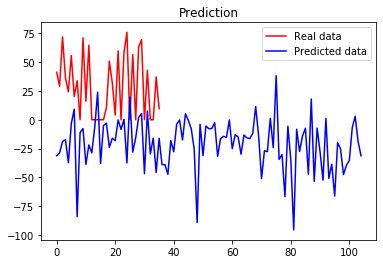

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 2136556.0000
Epoch 2/100
14/14 [==============================] - 0s 997us/step - loss: 306870.6562
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 206597.0625
Epoch 4/100
14/14 [==============================] - 0s 858us/step - loss: 64961.9805
Epoch 5/100
14/14 [==============================] - 0s 926us/step - loss: 64235.9922
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 46228.0898
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 31369.9824
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 27810.1094
Epoch 9/100
14/14 [==============================] - 0s 1ms/step - loss: 26778.4141
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 20868.2520
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 21356.8555
Epoch 12/100
14/14 [==============================]

14/14 [==============================] - 0s 1ms/step - loss: 531.6740
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 544.0872
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 544.5948


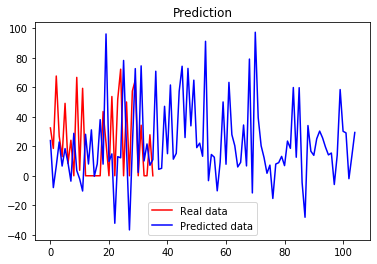

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 1712562.2500
Epoch 2/100
14/14 [==============================] - 0s 926us/step - loss: 381389.0625
Epoch 3/100
14/14 [==============================] - 0s 926us/step - loss: 165623.8906
Epoch 4/100
14/14 [==============================] - 0s 926us/step - loss: 94464.6484
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 69501.6641
Epoch 6/100
14/14 [==============================] - 0s 926us/step - loss: 63445.2461
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 57102.8047
Epoch 8/100
14/14 [==============================] - 0s 997us/step - loss: 43592.5781
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 59434.4922
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 23906.7598
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 19430.7070
Epoch 12/100
14/14 [===========================

14/14 [==============================] - 0s 1ms/step - loss: 527.9225
Epoch 98/100
14/14 [==============================] - 0s 997us/step - loss: 715.2822
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1246.1340
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 736.9653


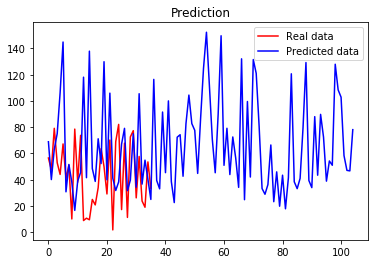

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 9596766.0000
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 1523230.8750
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 481261.7812
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 166202.4844
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 61041.6172
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 24285.7285
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 9908.7969
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 5357.5186
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 3489.5239
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 3173.6716
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 2875.3755
Epoch 12/100
10/10 [==============================] - 

10/10 [==============================] - 0s 997us/step - loss: 2524.5444
Epoch 98/100
10/10 [==============================] - 0s 997us/step - loss: 2320.3232
Epoch 99/100
10/10 [==============================] - 0s 898us/step - loss: 2639.4414
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2045.6488


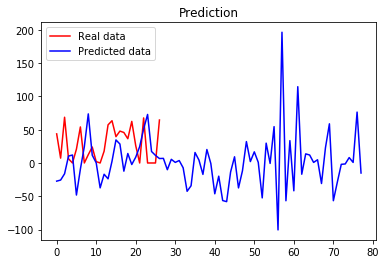

 28%|██▊       | 28/99 [05:39<14:01, 11.86s/it]

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 923us/step - loss: 61181728.0000
Epoch 2/100
14/14 [==============================] - 0s 858us/step - loss: 4758796.0000
Epoch 3/100
14/14 [==============================] - 0s 1000us/step - loss: 1640256.7500
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 346240.8750
Epoch 5/100
14/14 [==============================] - 0s 1000us/step - loss: 46940.3320
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 11448.5283
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 5201.9673
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 1816.6202
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 1349.8418
Epoch 10/100
14/14 [==============================] - 0s 929us/step - loss: 1104.1243
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 1037.5972
Epoch 12/100
14/14 [========================

14/14 [==============================] - 0s 1ms/step - loss: 1072.5085
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1228.2355
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 1204.3208
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1141.4983


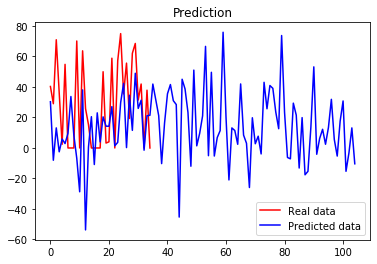

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 1ms/step - loss: 2839780.5000
Epoch 2/100
14/14 [==============================] - 0s 1ms/step - loss: 500348.6562
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 252425.5781
Epoch 4/100
14/14 [==============================] - 0s 1ms/step - loss: 213347.6719
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 177744.0000
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 181821.0312
Epoch 7/100
14/14 [==============================] - 0s 1ms/step - loss: 145601.5469
Epoch 8/100
14/14 [==============================] - 0s 1ms/step - loss: 205822.0156
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 115355.4609
Epoch 10/100
14/14 [==============================] - 0s 997us/step - loss: 118970.9922
Epoch 11/100
14/14 [==============================] - 0s 1ms/step - loss: 170598.6094
Epoch 12/100
14/14 [=============================

14/14 [==============================] - 0s 1ms/step - loss: 6638.0469
Epoch 98/100
14/14 [==============================] - 0s 997us/step - loss: 4636.0591
Epoch 99/100
14/14 [==============================] - 0s 997us/step - loss: 3339.0559
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 4082.0071


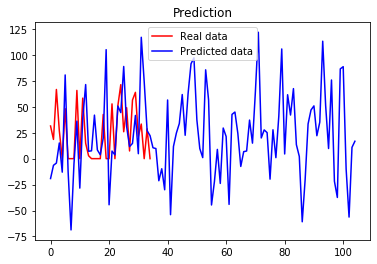

(168, 4)
Epoch 1/100
14/14 [==============================] - 0s 926us/step - loss: 2255540.5000
Epoch 2/100
14/14 [==============================] - 0s 855us/step - loss: 320875.9375
Epoch 3/100
14/14 [==============================] - 0s 1ms/step - loss: 87760.8359
Epoch 4/100
14/14 [==============================] - 0s 997us/step - loss: 67998.6094
Epoch 5/100
14/14 [==============================] - 0s 1ms/step - loss: 47362.2227
Epoch 6/100
14/14 [==============================] - 0s 997us/step - loss: 45051.0234
Epoch 7/100
14/14 [==============================] - 0s 997us/step - loss: 42792.7656
Epoch 8/100
14/14 [==============================] - 0s 926us/step - loss: 33390.9727
Epoch 9/100
14/14 [==============================] - 0s 926us/step - loss: 28974.4531
Epoch 10/100
14/14 [==============================] - 0s 1ms/step - loss: 25835.3086
Epoch 11/100
14/14 [==============================] - 0s 997us/step - loss: 26231.5234
Epoch 12/100
14/14 [==========================

14/14 [==============================] - 0s 1ms/step - loss: 1068.6548
Epoch 98/100
14/14 [==============================] - 0s 1ms/step - loss: 1269.9659
Epoch 99/100
14/14 [==============================] - 0s 1ms/step - loss: 859.3671
Epoch 100/100
14/14 [==============================] - 0s 1ms/step - loss: 1250.2341


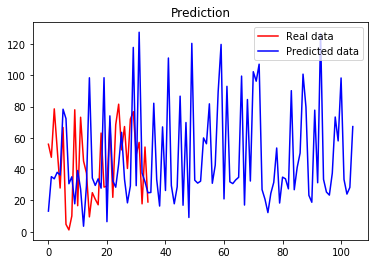

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 2389464.2500
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 607717.6875
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 166713.5625
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 41310.1289
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 14750.4277
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 7701.5435
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 3360.3430
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 2342.1997
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 2038.0243
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 2152.1797
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 2429.2681
Epoch 12/100
10/10 [==============================] - 0

10/10 [==============================] - 0s 1ms/step - loss: 1819.2616
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 3097.5969
Epoch 99/100
10/10 [==============================] - 0s 997us/step - loss: 3699.1826
Epoch 100/100
10/10 [==============================] - 0s 997us/step - loss: 1309.5602


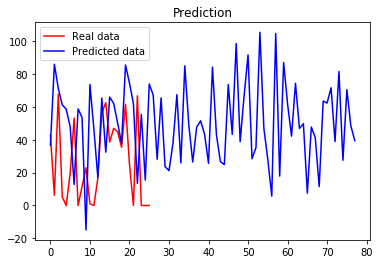

 29%|██▉       | 29/99 [05:51<13:50, 11.86s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 3315444.0000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 435463.1250
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 93026.7500
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 38038.9961
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 5680.4028
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 3082.8994
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1025.3330
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 680.0393
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 713.8223
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 766.0583
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 843.6169
Epoch 12/100
13/13 [==============================] - 0s 1ms/step - los

13/13 [==============================] - 0s 1000us/step - loss: 1028.1931
Epoch 99/100
13/13 [==============================] - 0s 923us/step - loss: 589.1316
Epoch 100/100
13/13 [==============================] - 0s 921us/step - loss: 818.1517


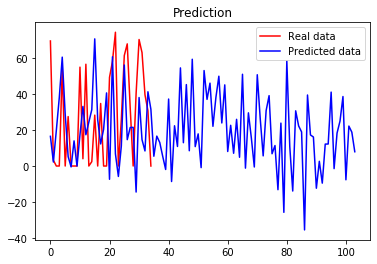

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 847us/step - loss: 1350133.5000
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 303942.1250
Epoch 3/100
13/13 [==============================] - 0s 844us/step - loss: 83267.1719
Epoch 4/100
13/13 [==============================] - 0s 921us/step - loss: 58440.4844
Epoch 5/100
13/13 [==============================] - 0s 920us/step - loss: 43943.8359
Epoch 6/100
13/13 [==============================] - 0s 922us/step - loss: 48491.6953
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 39138.9219
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 35933.4375
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 36288.2656
Epoch 10/100
13/13 [==============================] - 0s 921us/step - loss: 43048.3750
Epoch 11/100
13/13 [==============================] - 0s 844us/step - loss: 35727.0234
Epoch 12/100
13/13 [======================

13/13 [==============================] - 0s 1ms/step - loss: 1738.5358
Epoch 97/100
13/13 [==============================] - 0s 2ms/step - loss: 1866.5876
Epoch 98/100
13/13 [==============================] - 0s 997us/step - loss: 1673.2112
Epoch 99/100
13/13 [==============================] - 0s 921us/step - loss: 703.5184
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 632.7328


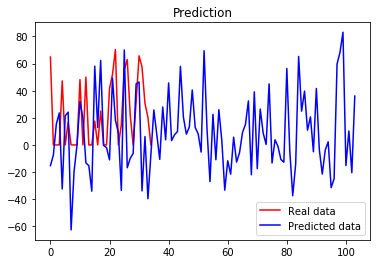

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 2108152.0000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 458349.6875
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 380672.5312
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 247098.7656
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 132264.2344
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 83492.9297
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 77930.4922
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 64601.3359
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 47733.5078
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 48672.2500
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 73844.0938
Epoch 12/100
13/13 [==============================] - 0s 

13/13 [==============================] - 0s 997us/step - loss: 3822.6721
Epoch 98/100
13/13 [==============================] - 0s 997us/step - loss: 3405.0229
Epoch 99/100
13/13 [==============================] - 0s 920us/step - loss: 3915.5806
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 4348.8057


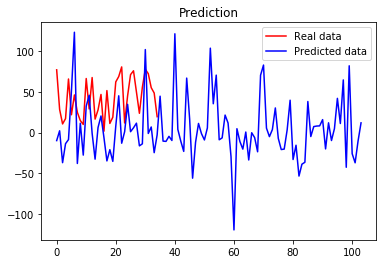

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 901us/step - loss: 7053529.0000
Epoch 2/100
10/10 [==============================] - 0s 993us/step - loss: 1526947.3750
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 546873.7500
Epoch 4/100
10/10 [==============================] - 0s 897us/step - loss: 205340.1250
Epoch 5/100
10/10 [==============================] - 0s 798us/step - loss: 84580.7188
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 37022.3086
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 20954.5449
Epoch 8/100
10/10 [==============================] - 0s 997us/step - loss: 10439.2354
Epoch 9/100
10/10 [==============================] - 0s 898us/step - loss: 5947.7402
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 5367.0771
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 5477.9746
Epoch 12/100
10/10 [==========================

10/10 [==============================] - 0s 997us/step - loss: 2085.0208
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 1577.9451
Epoch 99/100
10/10 [==============================] - 0s 997us/step - loss: 1895.2372
Epoch 100/100
10/10 [==============================] - 0s 997us/step - loss: 2634.9878


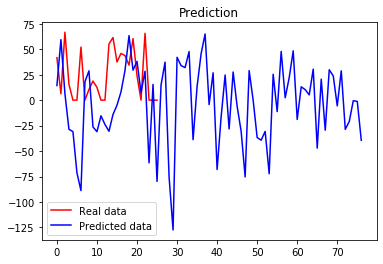

 30%|███       | 30/99 [06:02<13:13, 11.50s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 2969710.0000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 331728.9375
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 128432.3984
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 24081.7324
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 6293.7646
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 2849.9216
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1369.3546
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 1236.8505
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 1437.5852
Epoch 10/100
13/13 [==============================] - 0s 998us/step - loss: 1290.0807
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 1061.4442
Epoch 12/100
13/13 [==============================] - 0s 1ms/ste

13/13 [==============================] - 0s 1ms/step - loss: 1077.1603
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1093.3618
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1032.8192


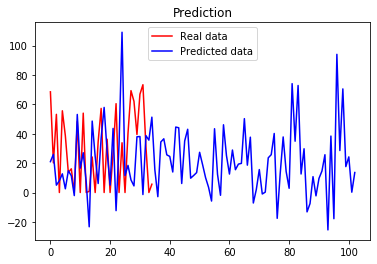

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 997us/step - loss: 2111263.7500
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 342882.0938
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 205814.7969
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 114762.0859
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 86376.4297
Epoch 6/100
13/13 [==============================] - 0s 997us/step - loss: 75220.4922
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 66614.7344
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 68916.9844
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 47012.6875
Epoch 10/100
13/13 [==============================] - 0s 998us/step - loss: 36290.7109
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 36733.9844
Epoch 12/100
13/13 [==============================] 

13/13 [==============================] - 0s 1ms/step - loss: 1218.1261
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1088.3945
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1669.9791
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1437.7048


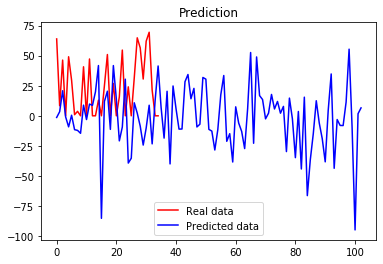

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 9931521.0000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 1321127.1250
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 441951.3750
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 180204.0156
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 99524.8750
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 63441.1758
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 60358.2461
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 57750.2344
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 52413.8750
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 50650.8359
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 46112.5977
Epoch 12/100
13/13 [==============================] - 0s 

13/13 [==============================] - 0s 1ms/step - loss: 2121.0706
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1954.5133
Epoch 99/100
13/13 [==============================] - 0s 997us/step - loss: 1733.7971
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1712.7706


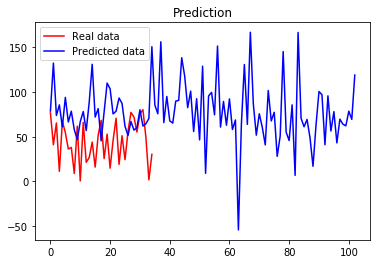

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 897us/step - loss: 2751287.2500
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 524456.5000
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 250857.5781
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 70903.8906
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 41461.0117
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 23715.1836
Epoch 7/100
10/10 [==============================] - 0s 898us/step - loss: 12336.2188
Epoch 8/100
10/10 [==============================] - 0s 901us/step - loss: 7891.9414
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 6057.1489
Epoch 10/100
10/10 [==============================] - 0s 898us/step - loss: 5490.4780
Epoch 11/100
10/10 [==============================] - 0s 798us/step - loss: 7193.7861
Epoch 12/100
10/10 [=========================

10/10 [==============================] - 0s 998us/step - loss: 3604.4207
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 3597.9556
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 3742.8145
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2689.0479


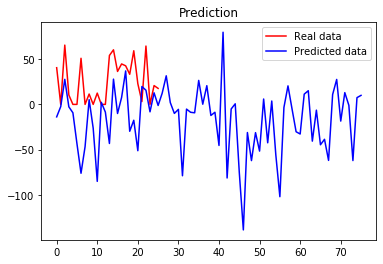

 31%|███▏      | 31/99 [06:13<13:05, 11.55s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 1022612.2500
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 248634.0625
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 61931.2383
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 11656.5518
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 3197.3630
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 2255.8677
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 964.4577
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 1008.3416
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 1064.6597
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 1014.0551
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 990.3269
Epoch 12/100
13/13 [==============================] - 0s 1ms/step - los

13/13 [==============================] - 0s 998us/step - loss: 3033.2131
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 866.8477
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1122.4923
Epoch 100/100
13/13 [==============================] - 0s 997us/step - loss: 1667.5088


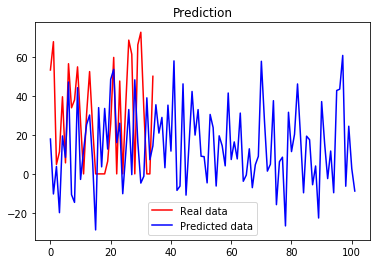

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 924us/step - loss: 10111213.0000
Epoch 2/100
13/13 [==============================] - 0s 2ms/step - loss: 1519396.3750
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 440964.6250
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 143345.9062
Epoch 5/100
13/13 [==============================] - 0s 921us/step - loss: 53097.7930
Epoch 6/100
13/13 [==============================] - 0s 920us/step - loss: 30529.0312
Epoch 7/100
13/13 [==============================] - 0s 997us/step - loss: 21323.8594
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 20085.6699
Epoch 9/100
13/13 [==============================] - 0s 920us/step - loss: 19070.5742
Epoch 10/100
13/13 [==============================] - 0s 923us/step - loss: 18731.9277
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 17722.6699
Epoch 12/100
13/13 [====================

13/13 [==============================] - 0s 997us/step - loss: 1414.2133
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1275.4191
Epoch 99/100
13/13 [==============================] - 0s 997us/step - loss: 1587.1832
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1569.5894


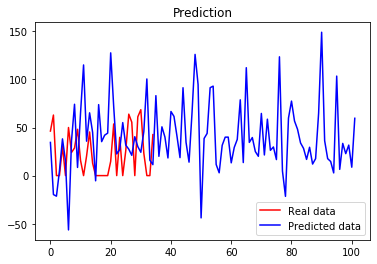

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 38366560.0000
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 5230583.5000
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 1861904.3750
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 813908.3125
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 498896.9062
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 292602.2812
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 248589.0000
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 239791.7188
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 199346.2812
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 168331.4375
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 155589.2812
Epoch 12/100
13/13 [==========================

13/13 [==============================] - 0s 1ms/step - loss: 4520.3813
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 4184.1035
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 4857.9048
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 4071.4504


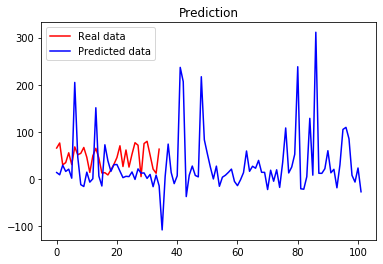

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 4824467.0000
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 1117077.1250
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 386221.9375
Epoch 4/100
10/10 [==============================] - 0s 902us/step - loss: 136502.2656
Epoch 5/100
10/10 [==============================] - 0s 798us/step - loss: 56625.6484
Epoch 6/100
10/10 [==============================] - 0s 898us/step - loss: 20328.4062
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 10497.6572
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 7365.6157
Epoch 9/100
10/10 [==============================] - 0s 897us/step - loss: 6301.9736
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 4000.4326
Epoch 11/100
10/10 [==============================] - 0s 898us/step - loss: 4017.9126
Epoch 12/100
10/10 [=========================

10/10 [==============================] - 0s 1ms/step - loss: 2145.1689
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2221.0789
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1539.8621
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1744.3452


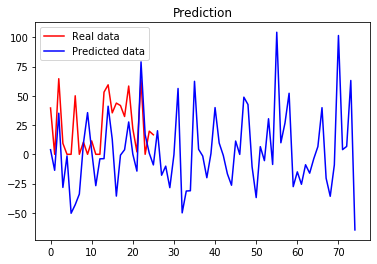

 32%|███▏      | 32/99 [06:25<12:49, 11.49s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 2330464.7500
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 311966.5000
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 90025.5000
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 32593.8242
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 9621.2637
Epoch 6/100
13/13 [==============================] - 0s 923us/step - loss: 3659.4265
Epoch 7/100
13/13 [==============================] - 0s 923us/step - loss: 2505.9788
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 2345.6172
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 2169.8225
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 2199.0303
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 2298.6436
Epoch 12/100
13/13 [==============================] -

13/13 [==============================] - 0s 1ms/step - loss: 1415.6260
Epoch 98/100
13/13 [==============================] - 0s 2ms/step - loss: 1355.9381
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2999.7112
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 2491.8555


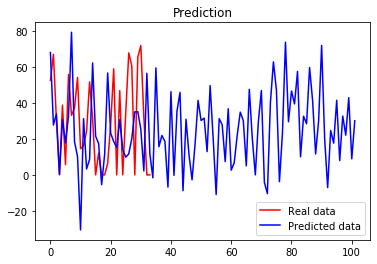

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 844us/step - loss: 11376040.0000
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 2171820.7500
Epoch 3/100
13/13 [==============================] - 0s 920us/step - loss: 528232.3750
Epoch 4/100
13/13 [==============================] - 0s 921us/step - loss: 273472.9688
Epoch 5/100
13/13 [==============================] - 0s 997us/step - loss: 179423.9062
Epoch 6/100
13/13 [==============================] - 0s 997us/step - loss: 159843.1250
Epoch 7/100
13/13 [==============================] - 0s 997us/step - loss: 145665.0625
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 122935.7188
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 129063.9219
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 118450.4297
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 114526.3516
Epoch 12/100
13/13 [=============

13/13 [==============================] - 0s 1ms/step - loss: 9432.9268
Epoch 97/100
13/13 [==============================] - 0s 1ms/step - loss: 11893.0381
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 8223.5088
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 6074.3638
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 4269.9214


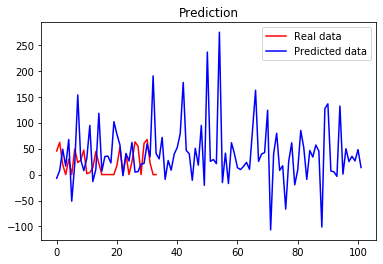

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 504649.4062
Epoch 2/100
13/13 [==============================] - 0s 997us/step - loss: 74873.0703
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 49478.7812
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 34384.3516
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 22825.6230
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 20470.3301
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 32360.3359
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 16891.9727
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 13798.5469
Epoch 10/100
13/13 [==============================] - 0s 997us/step - loss: 12015.9551
Epoch 11/100
13/13 [==============================] - 0s 924us/step - loss: 12980.7012
Epoch 12/100
13/13 [==============================] - 0s 1

13/13 [==============================] - 0s 997us/step - loss: 916.6266
Epoch 98/100
13/13 [==============================] - 0s 997us/step - loss: 555.0862
Epoch 99/100
13/13 [==============================] - 0s 995us/step - loss: 382.3578
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 632.0615


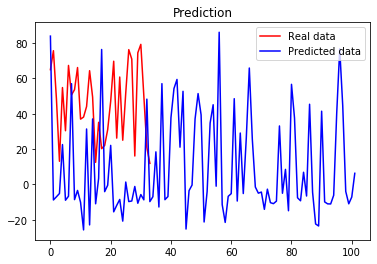

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 3540735.2500
Epoch 2/100
10/10 [==============================] - 0s 897us/step - loss: 942024.9375
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 318713.3438
Epoch 4/100
10/10 [==============================] - 0s 898us/step - loss: 94470.6875
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 44072.6680
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 20277.7305
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 7547.6133
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 5145.1602
Epoch 9/100
10/10 [==============================] - 0s 998us/step - loss: 2404.4009
Epoch 10/100
10/10 [==============================] - 0s 996us/step - loss: 2747.1680
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 2101.2366
Epoch 12/100
10/10 [============================

10/10 [==============================] - 0s 1ms/step - loss: 1984.3311
Epoch 98/100
10/10 [==============================] - 0s 897us/step - loss: 1851.3733
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1597.6155
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2959.9521


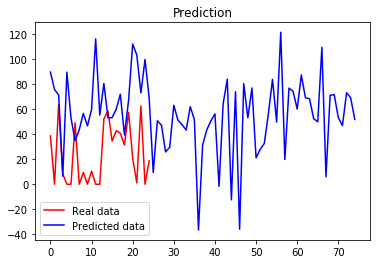

 33%|███▎      | 33/99 [06:36<12:28, 11.35s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 836047.7500
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 158501.9844
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 39991.9609
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 14264.2305
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 5409.6045
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 2490.5898
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 2223.3323
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 4438.9678
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 2340.3186
Epoch 10/100
13/13 [==============================] - 0s 975us/step - loss: 3178.1548
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 5500.3652
Epoch 12/100
13/13 [==============================] - 0s 1ms/step - 

13/13 [==============================] - 0s 1ms/step - loss: 2517.5537
Epoch 98/100
13/13 [==============================] - 0s 921us/step - loss: 2782.0710
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 3290.2661
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1097.7417


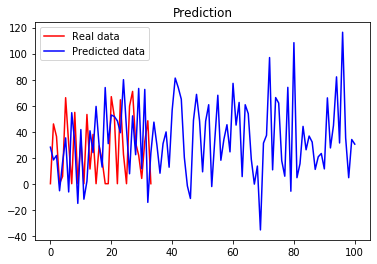

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 997us/step - loss: 2927119.5000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 367517.0625
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 133911.3906
Epoch 4/100
13/13 [==============================] - 0s 2ms/step - loss: 89293.5938
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 79426.8750
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 73349.9219
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 73628.7734
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 67188.4766
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 41947.4570
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 40603.5938
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 37568.4688
Epoch 12/100
13/13 [==============================] - 0s 1m

13/13 [==============================] - 0s 1ms/step - loss: 739.5220
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1326.8837
Epoch 100/100
13/13 [==============================] - 0s 2ms/step - loss: 1552.9292


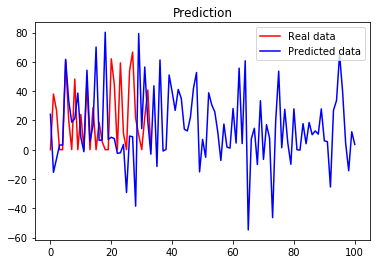

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 920us/step - loss: 2958639.2500
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 528388.8750
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 213165.5469
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 156252.4062
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 101294.0000
Epoch 6/100
13/13 [==============================] - 0s 997us/step - loss: 81415.5078
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 75222.0000
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 56790.7031
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 50007.5117
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 45002.4258
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 38263.1953
Epoch 12/100
13/13 [==============================] - 0

Epoch 98/100
13/13 [==============================] - 0s 2ms/step - loss: 1258.7880
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1543.0303
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1878.3301


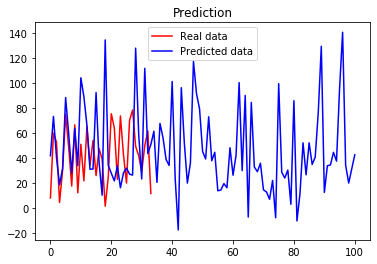

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 914839.4375
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 168717.5469
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 51377.0430
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 19137.5195
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 8514.0635
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 8735.7471
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 10076.8486
Epoch 8/100
10/10 [==============================] - 0s 998us/step - loss: 7550.3589
Epoch 9/100
10/10 [==============================] - 0s 998us/step - loss: 10123.6924
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 6768.7886
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 6982.4277
Epoch 12/100
10/10 [==============================] - 0s 1ms/ste

10/10 [==============================] - 0s 997us/step - loss: 2872.7070
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2265.8340
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1652.5083
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2175.3867


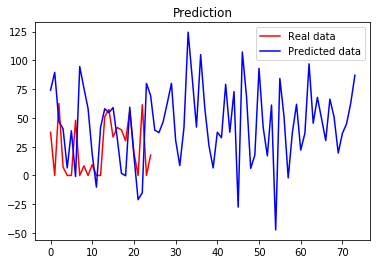

 34%|███▍      | 34/99 [06:49<12:47, 11.81s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 997us/step - loss: 1299438.5000
Epoch 2/100
13/13 [==============================] - 0s 997us/step - loss: 249427.8750
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 73906.3438
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 22311.2598
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 5766.5293
Epoch 6/100
13/13 [==============================] - 0s 997us/step - loss: 2660.3413
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1526.4207
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 971.4542
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 890.7115
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 834.0911
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 810.2372
Epoch 12/100
13/13 [==============================] - 0s 1m

13/13 [==============================] - 0s 2ms/step - loss: 1863.7858
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 2236.9395
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 784.1321
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1642.8521


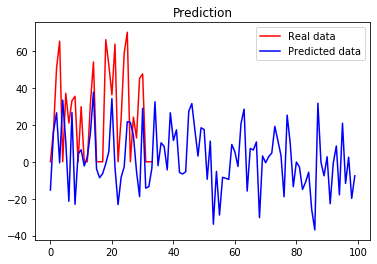

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 3980614.5000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 734267.2500
Epoch 3/100
13/13 [==============================] - 0s 2ms/step - loss: 217372.1250
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 111460.7422
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 75689.2109
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 49954.2305
Epoch 7/100
13/13 [==============================] - 0s 2ms/step - loss: 45973.8203
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 42678.5781
Epoch 9/100
13/13 [==============================] - 0s 2ms/step - loss: 38980.5781
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 33653.4531
Epoch 11/100
13/13 [==============================] - 0s 2ms/step - loss: 37005.5312
Epoch 12/100
13/13 [==============================] - 0s 1ms

13/13 [==============================] - 0s 997us/step - loss: 1825.5679
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1303.1514
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1516.3380
Epoch 100/100
13/13 [==============================] - 0s 997us/step - loss: 1970.9803


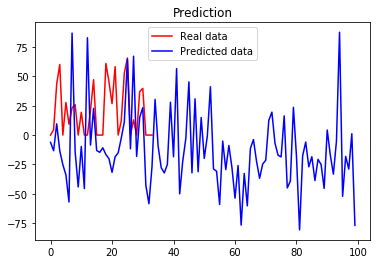

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 997us/step - loss: 5481792.0000
Epoch 2/100
13/13 [==============================] - 0s 997us/step - loss: 1430810.1250
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 545961.7500
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 307414.2500
Epoch 5/100
13/13 [==============================] - 0s 844us/step - loss: 213917.8750
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 188666.1875
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 175389.7031
Epoch 8/100
13/13 [==============================] - 0s 997us/step - loss: 124350.4531
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 109734.2109
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 98568.6797
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 85145.6328
Epoch 12/100
13/13 [====================

13/13 [==============================] - 0s 1ms/step - loss: 1794.4231
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 2390.3293
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2351.5557
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 2340.8184


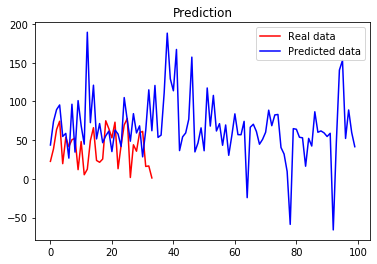

(132, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 3182739.7500
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 959241.1875
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 253836.1094
Epoch 4/100
10/10 [==============================] - 0s 902us/step - loss: 108482.7500
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 50749.3828
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 14568.3477
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 12148.6670
Epoch 8/100
10/10 [==============================] - 0s 997us/step - loss: 7772.7100
Epoch 9/100
10/10 [==============================] - 0s 898us/step - loss: 3763.0398
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 3184.6150
Epoch 11/100
10/10 [==============================] - 0s 898us/step - loss: 2099.3997
Epoch 12/100
10/10 [============================

10/10 [==============================] - 0s 1ms/step - loss: 2362.5955
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 1072.7773
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1742.6465
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 987.1878


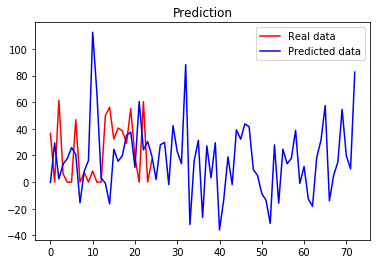

 35%|███▌      | 35/99 [07:00<12:33, 11.77s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 1844919.1250
Epoch 2/100
13/13 [==============================] - 0s 997us/step - loss: 362647.0312
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 81406.9297
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 20914.9883
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 7145.0371
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 1864.7705
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1424.9056
Epoch 8/100
13/13 [==============================] - 0s 920us/step - loss: 1980.9670
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 1194.5645
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 1230.0923
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 2386.4980
Epoch 12/100
13/13 [==============================] - 0s 1m

13/13 [==============================] - 0s 1ms/step - loss: 784.9741
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1035.0514
Epoch 100/100
13/13 [==============================] - 0s 2ms/step - loss: 1234.1222


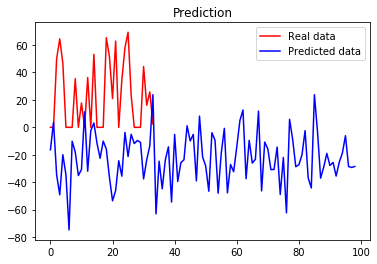

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 924us/step - loss: 1980047.6250
Epoch 2/100
13/13 [==============================] - 0s 921us/step - loss: 729151.3750
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 274143.7500
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 185419.2969
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 162212.1094
Epoch 6/100
13/13 [==============================] - 0s 924us/step - loss: 133186.1250
Epoch 7/100
13/13 [==============================] - 0s 844us/step - loss: 101878.6094
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 80205.9688
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 80097.2109
Epoch 10/100
13/13 [==============================] - 0s 921us/step - loss: 62801.3477
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 82284.3516
Epoch 12/100
13/13 [=========================

13/13 [==============================] - 0s 997us/step - loss: 2134.0271
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 7471.7070
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 6589.3794
Epoch 100/100
13/13 [==============================] - 0s 997us/step - loss: 6378.7656


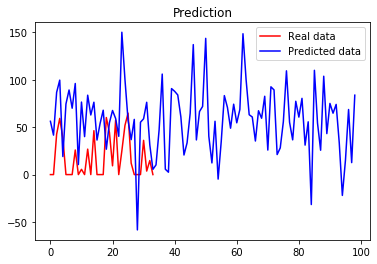

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 847us/step - loss: 3677563.2500
Epoch 2/100
13/13 [==============================] - 0s 924us/step - loss: 588425.1875
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 377954.9062
Epoch 4/100
13/13 [==============================] - 0s 921us/step - loss: 213469.5312
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 127893.1797
Epoch 6/100
13/13 [==============================] - 0s 999us/step - loss: 121395.6562
Epoch 7/100
13/13 [==============================] - 0s 921us/step - loss: 110864.1953
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 112695.5391
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 97362.1094
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 121342.6172
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 126361.0000
Epoch 12/100
13/13 [====================

13/13 [==============================] - 0s 1ms/step - loss: 5319.9727
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 4753.4038
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 7247.6982
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 4843.0742


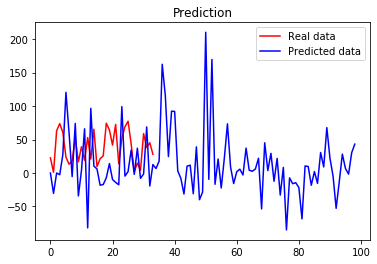

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 887us/step - loss: 13369152.0000
Epoch 2/100
9/9 [==============================] - 0s 886us/step - loss: 2911765.0000
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 1136507.5000
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 438040.0625
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 195192.5000
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 91271.6094
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 40562.4531
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 23955.0078
Epoch 9/100
9/9 [==============================] - 0s 887us/step - loss: 17850.4766
Epoch 10/100
9/9 [==============================] - 0s 887us/step - loss: 15013.1699
Epoch 11/100
9/9 [==============================] - 0s 891us/step - loss: 12140.3584
Epoch 12/100
9/9 [==============================] - 0s 776us/step 

9/9 [==============================] - 0s 1ms/step - loss: 7756.6040
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 6396.8877


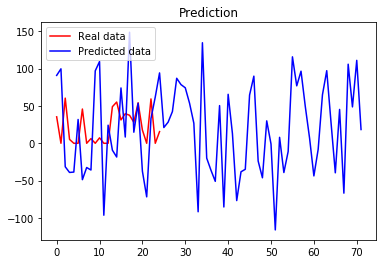

 36%|███▋      | 36/99 [07:12<12:20, 11.75s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 924us/step - loss: 497750.5000
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 89324.6328
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 25180.9277
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 7137.8320
Epoch 5/100
13/13 [==============================] - 0s 920us/step - loss: 2060.1682
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 1133.3361
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 1178.6362
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 1172.7312
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 1121.3350
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 1454.3229
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 1755.0016
Epoch 12/100
13/13 [==============================] - 0s 1ms/ste

13/13 [==============================] - 0s 1ms/step - loss: 870.5560
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1036.5747
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1596.7521


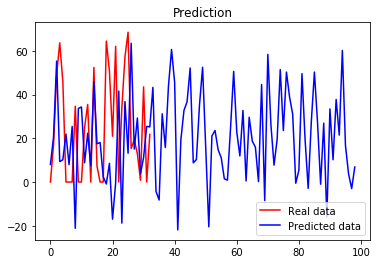

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 844us/step - loss: 2252664.5000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 450371.8750
Epoch 3/100
13/13 [==============================] - 0s 921us/step - loss: 263883.4062
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 189985.8594
Epoch 5/100
13/13 [==============================] - 0s 921us/step - loss: 156794.9531
Epoch 6/100
13/13 [==============================] - 0s 767us/step - loss: 130370.3828
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 135735.7031
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 142657.6094
Epoch 9/100
13/13 [==============================] - 0s 997us/step - loss: 116636.4531
Epoch 10/100
13/13 [==============================] - 0s 996us/step - loss: 80985.4219
Epoch 11/100
13/13 [==============================] - 0s 921us/step - loss: 78753.9922
Epoch 12/100
13/13 [===================

13/13 [==============================] - 0s 1ms/step - loss: 1754.3296
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1216.9480
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 1134.2108
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1956.0182


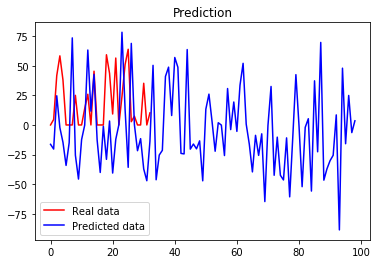

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 6945122.5000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 1476804.2500
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 533482.0000
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 430574.3125
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 330994.7812
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 294924.8750
Epoch 7/100
13/13 [==============================] - 0s 997us/step - loss: 284140.7812
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 299781.3438
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 246375.2188
Epoch 10/100
13/13 [==============================] - 0s 923us/step - loss: 212433.0312
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 140651.9219
Epoch 12/100
13/13 [==========================

13/13 [==============================] - 0s 1ms/step - loss: 6380.2783
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 13311.3545
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 4498.7788
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 6151.8477


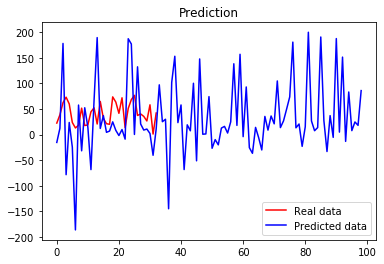

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 5151318.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 1714562.7500
Epoch 3/100
9/9 [==============================] - 0s 887us/step - loss: 640206.0000
Epoch 4/100
9/9 [==============================] - 0s 886us/step - loss: 209922.1562
Epoch 5/100
9/9 [==============================] - 0s 886us/step - loss: 71341.1328
Epoch 6/100
9/9 [==============================] - 0s 780us/step - loss: 35956.7578
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 22565.9375
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 11762.2598
Epoch 9/100
9/9 [==============================] - 0s 886us/step - loss: 9742.3750
Epoch 10/100
9/9 [==============================] - 0s 998us/step - loss: 7643.8291
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 6982.9575
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - 

9/9 [==============================] - 0s 997us/step - loss: 2436.9690


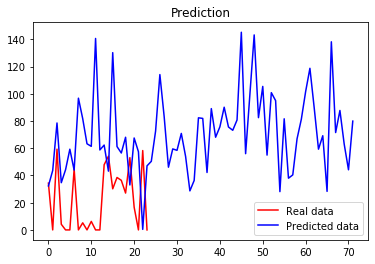

 37%|███▋      | 37/99 [07:23<12:02, 11.66s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 1ms/step - loss: 6192379.5000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 1187986.5000
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 165643.4688
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 59294.6172
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 10584.4932
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 4491.5923
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 2237.9612
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 1894.2689
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 1500.1489
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 1567.6621
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 1377.4083
Epoch 12/100
13/13 [==============================] - 0s 1ms/step 

13/13 [==============================] - 0s 1ms/step - loss: 1519.2236
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2212.7568
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 1174.7317


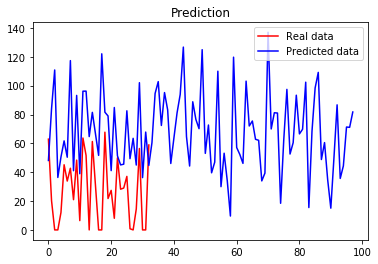

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 22779590.0000
Epoch 2/100
13/13 [==============================] - 0s 921us/step - loss: 3042051.5000
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 845084.5625
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 290385.2500
Epoch 5/100
13/13 [==============================] - 0s 997us/step - loss: 151576.5156
Epoch 6/100
13/13 [==============================] - 0s 921us/step - loss: 100625.5547
Epoch 7/100
13/13 [==============================] - 0s 997us/step - loss: 88773.0938
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 85692.9609
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 74091.1875
Epoch 10/100
13/13 [==============================] - 0s 997us/step - loss: 66565.1016
Epoch 11/100
13/13 [==============================] - 0s 997us/step - loss: 63231.3281
Epoch 12/100
13/13 [====================

13/13 [==============================] - 0s 1ms/step - loss: 4329.9233
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 3416.2590
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2917.1086
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 2187.9189


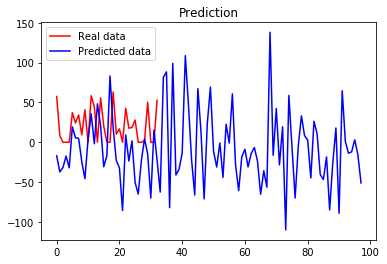

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 921us/step - loss: 3296198.0000
Epoch 2/100
13/13 [==============================] - 0s 995us/step - loss: 985138.6250
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 437265.1875
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 272420.8750
Epoch 5/100
13/13 [==============================] - 0s 844us/step - loss: 209371.8438
Epoch 6/100
13/13 [==============================] - 0s 844us/step - loss: 175985.4531
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 205463.1875
Epoch 8/100
13/13 [==============================] - 0s 921us/step - loss: 231795.3750
Epoch 9/100
13/13 [==============================] - 0s 998us/step - loss: 112343.4297
Epoch 10/100
13/13 [==============================] - 0s 997us/step - loss: 94254.1328
Epoch 11/100
13/13 [==============================] - 0s 923us/step - loss: 117476.4062
Epoch 12/100
13/13 [================

13/13 [==============================] - 0s 1ms/step - loss: 1113.2086
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 755.7161
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 790.9797
Epoch 100/100
13/13 [==============================] - 0s 1ms/step - loss: 916.9435


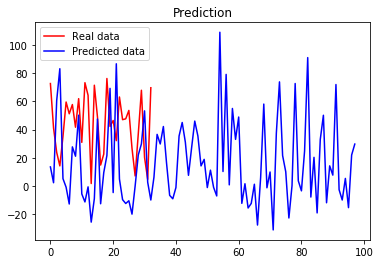

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 886us/step - loss: 1684040.3750
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 309319.0938
Epoch 3/100
9/9 [==============================] - 0s 998us/step - loss: 167653.5625
Epoch 4/100
9/9 [==============================] - 0s 998us/step - loss: 50513.8750
Epoch 5/100
9/9 [==============================] - 0s 2ms/step - loss: 39529.6836
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 19909.4727
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 7888.7183
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 6174.5112
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 5087.3550
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 5229.5015
Epoch 11/100
9/9 [==============================] - 0s 891us/step - loss: 6908.3804
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss: 5476

9/9 [==============================] - 0s 1ms/step - loss: 5359.0498


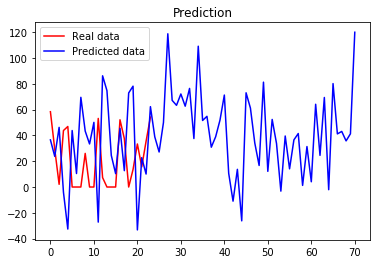

 38%|███▊      | 38/99 [07:36<12:05, 11.89s/it]

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 997us/step - loss: 5847653.0000
Epoch 2/100
13/13 [==============================] - 0s 844us/step - loss: 925266.2500
Epoch 3/100
13/13 [==============================] - 0s 844us/step - loss: 242268.4531
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 78784.8125
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 18497.2109
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 6110.4238
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 3459.9302
Epoch 8/100
13/13 [==============================] - 0s 767us/step - loss: 3110.6201
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 2289.4766
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 2094.3232
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 2148.7485
Epoch 12/100
13/13 [==============================] - 0s 99

13/13 [==============================] - 0s 1ms/step - loss: 1684.9802
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 1568.5331
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2027.4222
Epoch 100/100
13/13 [==============================] - 0s 2ms/step - loss: 1538.9978


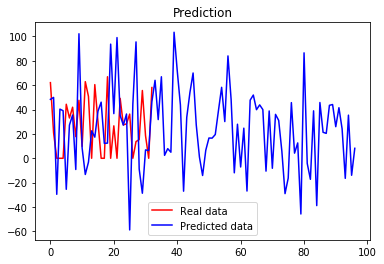

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 844us/step - loss: 15912924.0000
Epoch 2/100
13/13 [==============================] - 0s 1ms/step - loss: 3190671.7500
Epoch 3/100
13/13 [==============================] - 0s 1ms/step - loss: 866336.2500
Epoch 4/100
13/13 [==============================] - 0s 1ms/step - loss: 239702.7656
Epoch 5/100
13/13 [==============================] - 0s 1ms/step - loss: 99329.0078
Epoch 6/100
13/13 [==============================] - 0s 1ms/step - loss: 83290.2734
Epoch 7/100
13/13 [==============================] - 0s 1ms/step - loss: 75371.3750
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 69767.0078
Epoch 9/100
13/13 [==============================] - 0s 1ms/step - loss: 63728.0000
Epoch 10/100
13/13 [==============================] - 0s 1ms/step - loss: 59294.4961
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 51949.0039
Epoch 12/100
13/13 [==============================] - 0s

13/13 [==============================] - 0s 1ms/step - loss: 2121.3486
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 2851.4463
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 2104.1582
Epoch 100/100
13/13 [==============================] - 0s 997us/step - loss: 2366.4421


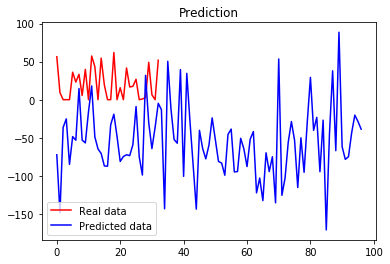

(168, 4)
Epoch 1/100
13/13 [==============================] - 0s 844us/step - loss: 1380852.2500
Epoch 2/100
13/13 [==============================] - 0s 997us/step - loss: 536285.8750
Epoch 3/100
13/13 [==============================] - 0s 997us/step - loss: 310189.7500
Epoch 4/100
13/13 [==============================] - 0s 997us/step - loss: 122277.8438
Epoch 5/100
13/13 [==============================] - 0s 847us/step - loss: 203160.6562
Epoch 6/100
13/13 [==============================] - 0s 921us/step - loss: 83758.6562
Epoch 7/100
13/13 [==============================] - 0s 844us/step - loss: 64925.5273
Epoch 8/100
13/13 [==============================] - 0s 1ms/step - loss: 58387.8516
Epoch 9/100
13/13 [==============================] - 0s 924us/step - loss: 60405.8047
Epoch 10/100
13/13 [==============================] - 0s 997us/step - loss: 47554.2539
Epoch 11/100
13/13 [==============================] - 0s 1ms/step - loss: 23856.8965
Epoch 12/100
13/13 [=====================

13/13 [==============================] - 0s 1ms/step - loss: 2131.0471
Epoch 98/100
13/13 [==============================] - 0s 1ms/step - loss: 4205.1724
Epoch 99/100
13/13 [==============================] - 0s 1ms/step - loss: 9075.2393
Epoch 100/100
13/13 [==============================] - 0s 2ms/step - loss: 5031.4971


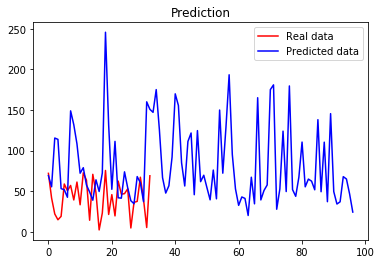

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 18757904.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 2352260.7500
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 1089810.0000
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 595672.3750
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 176105.1406
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 48245.6602
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 38207.1055
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 23823.5977
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 13712.3857
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 10632.8711
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 9480.1055
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 8998.

9/9 [==============================] - 0s 997us/step - loss: 4479.5557


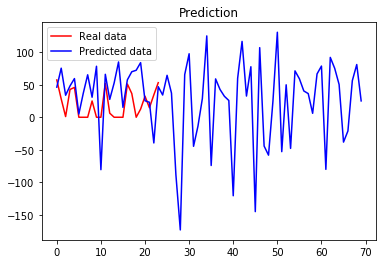

 39%|███▉      | 39/99 [07:48<11:51, 11.86s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 917us/step - loss: 1081587.5000
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 192299.3281
Epoch 3/100
12/12 [==============================] - 0s 834us/step - loss: 54493.0195
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 17198.4180
Epoch 5/100
12/12 [==============================] - 0s 831us/step - loss: 6273.5649
Epoch 6/100
12/12 [==============================] - 0s 832us/step - loss: 2116.5566
Epoch 7/100
12/12 [==============================] - 0s 831us/step - loss: 1227.4916
Epoch 8/100
12/12 [==============================] - 0s 748us/step - loss: 1012.8374
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 1063.8002
Epoch 10/100
12/12 [==============================] - 0s 914us/step - loss: 1175.0314
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1240.7711
Epoch 12/100
12/12 [==============================]

12/12 [==============================] - 0s 1ms/step - loss: 1077.0938
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1057.2843
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 3311.3899
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1206.4066


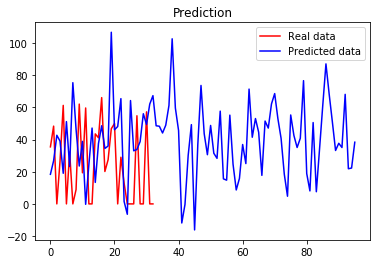

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 27962062.0000
Epoch 2/100
12/12 [==============================] - 0s 917us/step - loss: 2518204.7500
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 600016.0625
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 347097.0938
Epoch 5/100
12/12 [==============================] - 0s 834us/step - loss: 155481.3594
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 87198.6484
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 85966.3359
Epoch 8/100
12/12 [==============================] - 0s 995us/step - loss: 74888.5469
Epoch 9/100
12/12 [==============================] - 0s 998us/step - loss: 69173.8516
Epoch 10/100
12/12 [==============================] - 0s 917us/step - loss: 59850.0820
Epoch 11/100
12/12 [==============================] - 0s 831us/step - loss: 63061.3008
Epoch 12/100
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 2416.2341
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1881.2609
Epoch 99/100
12/12 [==============================] - 0s 997us/step - loss: 1857.8358
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1788.3413


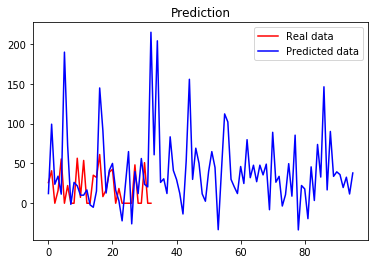

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 831us/step - loss: 4298657.0000
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 502408.0938
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 221833.3281
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 135804.0156
Epoch 5/100
12/12 [==============================] - 0s 831us/step - loss: 99993.9141
Epoch 6/100
12/12 [==============================] - 0s 748us/step - loss: 65904.1484
Epoch 7/100
12/12 [==============================] - 0s 830us/step - loss: 63560.2773
Epoch 8/100
12/12 [==============================] - 0s 831us/step - loss: 50786.9062
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 40438.4180
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 34490.2930
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 28704.9316
Epoch 12/100
12/12 [====================

12/12 [==============================] - 0s 2ms/step - loss: 2438.6460
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 3333.7334
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2227.5691
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2775.2014


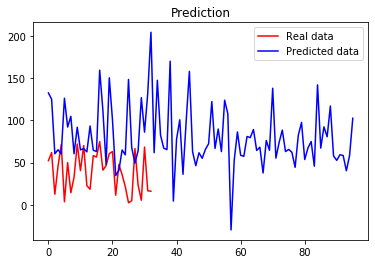

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 1426995.6250
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 353624.0312
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 127688.8672
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 57365.5430
Epoch 5/100
9/9 [==============================] - 0s 2ms/step - loss: 15472.5439
Epoch 6/100
9/9 [==============================] - 0s 2ms/step - loss: 16601.9336
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 6376.9360
Epoch 8/100
9/9 [==============================] - 0s 2ms/step - loss: 6220.4395
Epoch 9/100
9/9 [==============================] - 0s 2ms/step - loss: 4146.0981
Epoch 10/100
9/9 [==============================] - 0s 2ms/step - loss: 7300.2998
Epoch 11/100
9/9 [==============================] - 0s 2ms/step - loss: 6966.1406
Epoch 12/100
9/9 [==============================] - 0s 2ms/step - loss: 5021.5654
Epoch 

9/9 [==============================] - 0s 997us/step - loss: 2651.9800


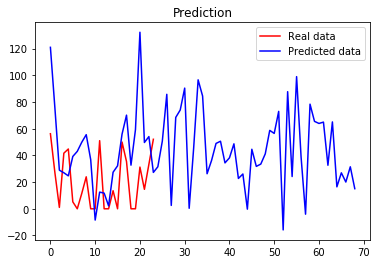

 40%|████      | 40/99 [07:59<11:27, 11.65s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 1075446.5000
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 229054.5625
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 74609.7578
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 25239.4941
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 11447.9658
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 5903.1934
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 4430.3623
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 3288.6055
Epoch 9/100
12/12 [==============================] - 0s 997us/step - loss: 2865.5264
Epoch 10/100
12/12 [==============================] - 0s 834us/step - loss: 3517.7375
Epoch 11/100
12/12 [==============================] - 0s 832us/step - loss: 3266.7688
Epoch 12/100
12/12 [==============================] 

12/12 [==============================] - 0s 997us/step - loss: 3298.0906
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 4673.1436
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 4925.5083
Epoch 100/100
12/12 [==============================] - 0s 997us/step - loss: 1304.1025


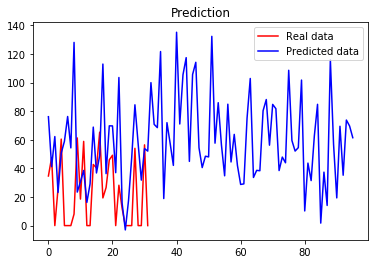

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 1587588.6250
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 192303.1094
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 107457.0703
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 68896.4922
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 64401.9219
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 45640.8555
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 38586.4102
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 40072.1758
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 32707.4941
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 30588.9688
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 25918.3359
Epoch 12/100
12/12 [==============================] - 0s 1m

12/12 [==============================] - 0s 1ms/step - loss: 1902.7362
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2025.5502
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 959.1608
Epoch 100/100
12/12 [==============================] - 0s 914us/step - loss: 1079.5055


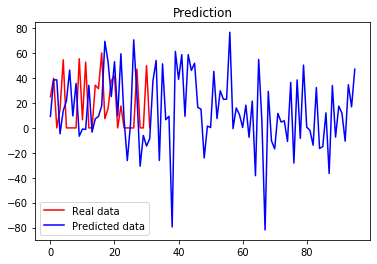

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 6949056.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 1484766.6250
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 358177.5312
Epoch 4/100
12/12 [==============================] - 0s 998us/step - loss: 160343.5156
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 166354.6875
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 99698.7109
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 101939.8984
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 92229.9609
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 79800.3750
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 71032.2578
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 66129.8203
Epoch 12/100
12/12 [==============================] -

12/12 [==============================] - 0s 997us/step - loss: 2184.7483
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1713.3304
Epoch 99/100
12/12 [==============================] - 0s 1000us/step - loss: 1960.8726
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2672.1047


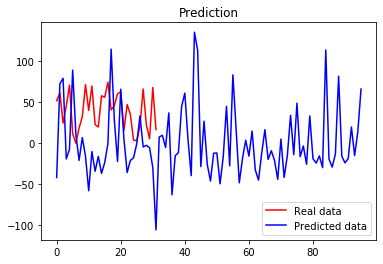

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 887us/step - loss: 2421311.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 738433.1875
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 194965.5156
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 86419.6875
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 65535.7031
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 51796.8711
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 27704.8379
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 27101.4648
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 23358.9355
Epoch 10/100
9/9 [==============================] - 0s 998us/step - loss: 21520.7148
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 28122.3496
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 30550.4

Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2079.2078


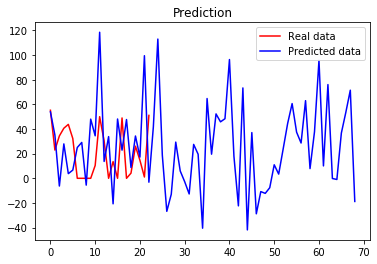

 41%|████▏     | 41/99 [08:10<11:14, 11.63s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 5579834.5000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 957275.1250
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 236359.8125
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 95705.9609
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 28042.2324
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 6032.4355
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 2546.7964
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 2091.6816
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 1839.2262
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 2372.8923
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 2424.6404
Epoch 12/100
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 5315.4258
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 3578.7615
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 3485.5662


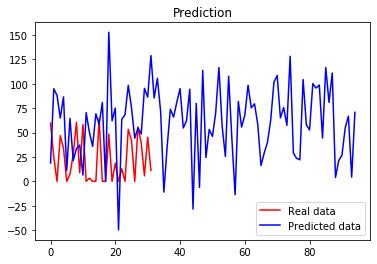

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 831us/step - loss: 9994823.0000
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 1392288.2500
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 822772.6250
Epoch 4/100
12/12 [==============================] - 0s 831us/step - loss: 358436.2188
Epoch 5/100
12/12 [==============================] - 0s 914us/step - loss: 337773.0000
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 260715.5000
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 206672.1875
Epoch 8/100
12/12 [==============================] - 0s 997us/step - loss: 281260.0312
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 201308.8438
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 97585.6875
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 86320.1016
Epoch 12/100
12/12 [==================

Epoch 97/100
12/12 [==============================] - 0s 1ms/step - loss: 3614.7830
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 3367.7766
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 3309.3958
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 3709.0269


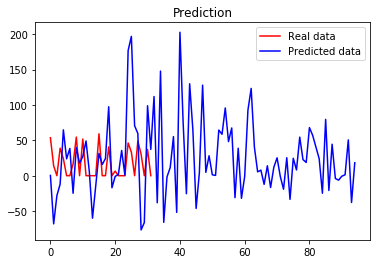

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 998us/step - loss: 2356192.7500
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 434960.0312
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 174271.4844
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 114253.9609
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 80528.9766
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 79983.7891
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 67974.9219
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 56064.3828
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 39972.2344
Epoch 10/100
12/12 [==============================] - 0s 997us/step - loss: 36485.6758
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 26421.2578
Epoch 12/100
12/12 [==============================] 

12/12 [==============================] - 0s 2ms/step - loss: 2385.9141
Epoch 98/100
12/12 [==============================] - 0s 2ms/step - loss: 1570.1337
Epoch 99/100
12/12 [==============================] - 0s 998us/step - loss: 1237.5167
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1659.9814


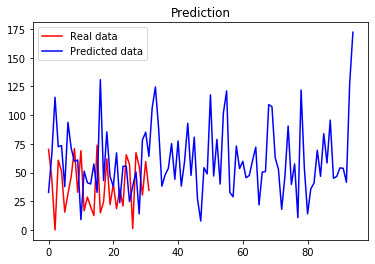

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 960052.8125
Epoch 2/100
9/9 [==============================] - 0s 886us/step - loss: 295437.2188
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 85241.6953
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 31485.4844
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 20015.2031
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 5633.3032
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 3889.2744
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 3039.2637
Epoch 9/100
9/9 [==============================] - 0s 993us/step - loss: 3583.0320
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 2708.7324
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 2059.3850
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 2073.35

9/9 [==============================] - 0s 1ms/step - loss: 1169.4990


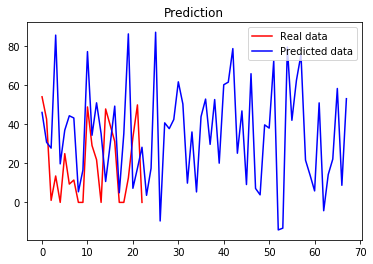

 42%|████▏     | 42/99 [08:22<11:07, 11.72s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 1279793.1250
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 204417.4219
Epoch 3/100
12/12 [==============================] - 0s 748us/step - loss: 58444.2617
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 16829.5098
Epoch 5/100
12/12 [==============================] - 0s 914us/step - loss: 4988.4883
Epoch 6/100
12/12 [==============================] - 0s 831us/step - loss: 2141.0383
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 1585.5819
Epoch 8/100
12/12 [==============================] - 0s 997us/step - loss: 1961.5146
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 2389.4661
Epoch 10/100
12/12 [==============================] - 0s 831us/step - loss: 2081.4944
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 1649.9640
Epoch 12/100
12/12 [==============================] -

Epoch 97/100
12/12 [==============================] - 0s 997us/step - loss: 967.8375
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1282.1522
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1564.6980
Epoch 100/100
12/12 [==============================] - 0s 997us/step - loss: 1461.2872


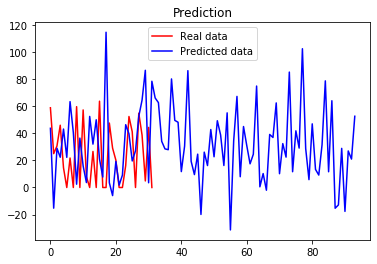

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 1313407.8750
Epoch 2/100
12/12 [==============================] - 0s 917us/step - loss: 203292.2500
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 79365.3750
Epoch 4/100
12/12 [==============================] - 0s 834us/step - loss: 35095.9258
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 14626.9346
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 12417.6631
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 9859.3174
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 10706.8682
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 10352.6152
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 7035.4116
Epoch 11/100
12/12 [==============================] - 0s 914us/step - loss: 5818.0200
Epoch 12/100
12/12 [=============================

12/12 [==============================] - 0s 2ms/step - loss: 573.0746
Epoch 98/100
12/12 [==============================] - 0s 2ms/step - loss: 684.6453
Epoch 99/100
12/12 [==============================] - 0s 2ms/step - loss: 696.7112
Epoch 100/100
12/12 [==============================] - 0s 2ms/step - loss: 576.1396


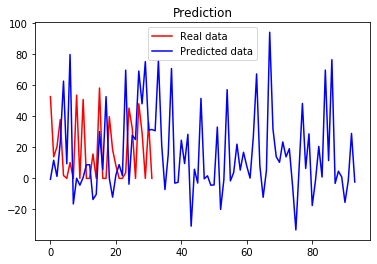

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 3222433.7500
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 873536.0000
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 394766.0938
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 194164.1250
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 88856.4766
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 58510.7656
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 56290.4141
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 42750.3672
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 51473.1055
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 35172.4531
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 36136.3359
Epoch 12/100
12/12 [==============================] - 

12/12 [==============================] - 0s 997us/step - loss: 2654.0752
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1701.8740
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1854.9543
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1537.4039


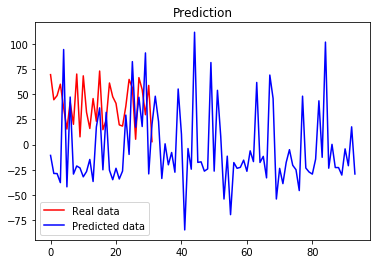

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 3832850.2500
Epoch 2/100
9/9 [==============================] - 0s 998us/step - loss: 1060473.5000
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 280148.8438
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 128294.6250
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 62720.7969
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 23326.9414
Epoch 7/100
9/9 [==============================] - 0s 998us/step - loss: 14590.2764
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 9508.2393
Epoch 9/100
9/9 [==============================] - 0s 887us/step - loss: 5500.3022
Epoch 10/100
9/9 [==============================] - 0s 886us/step - loss: 5766.3452
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 4457.1836
Epoch 12/100
9/9 [==============================] - 0s 887us/step - loss:

9/9 [==============================] - 0s 1ms/step - loss: 2141.2478


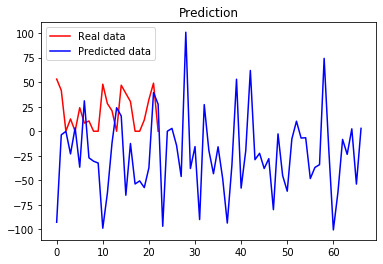

 43%|████▎     | 43/99 [08:34<10:49, 11.60s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 3741911.5000
Epoch 2/100
12/12 [==============================] - 0s 917us/step - loss: 532545.8750
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 180328.8438
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 53129.3594
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 15470.7705
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 3961.9607
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 2054.6392
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 1616.9001
Epoch 9/100
12/12 [==============================] - 0s 997us/step - loss: 1525.3523
Epoch 10/100
12/12 [==============================] - 0s 915us/step - loss: 1714.2095
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1655.8878
Epoch 12/100
12/12 [==============================] -

12/12 [==============================] - 0s 2ms/step - loss: 1266.8870
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1112.7192
Epoch 100/100
12/12 [==============================] - 0s 2ms/step - loss: 1174.7751


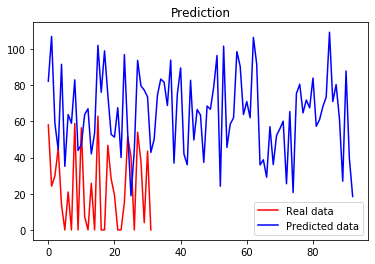

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 2063021.7500
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 394155.6250
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 162359.4844
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 41141.6406
Epoch 5/100
12/12 [==============================] - 0s 2ms/step - loss: 32950.6719
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 15632.8867
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 9825.1514
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 10305.7617
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 9204.2852
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 8816.5654
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 9532.2412
Epoch 12/100
12/12 [==============================] - 0s 1m

12/12 [==============================] - 0s 1ms/step - loss: 1049.5187
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 854.1244
Epoch 100/100
12/12 [==============================] - 0s 2ms/step - loss: 738.9460


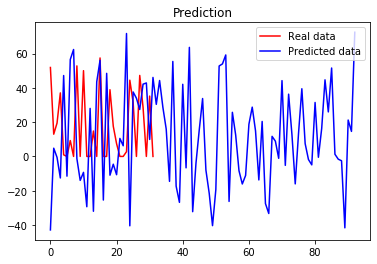

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 12038324.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 2682936.7500
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 743351.5000
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 548761.5000
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 442143.9688
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 316758.1562
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 258142.1094
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 247631.3281
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 213902.8750
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 172906.7500
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 139131.4844
Epoch 12/100
12/12 [==============================]

12/12 [==============================] - 0s 1ms/step - loss: 2365.2134
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2709.3767
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1809.5580
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2172.7385


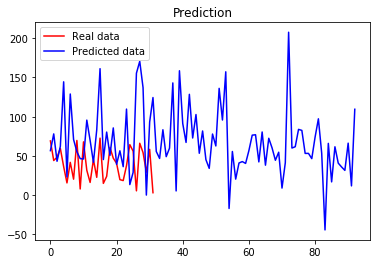

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 7624333.5000
Epoch 2/100
9/9 [==============================] - 0s 2ms/step - loss: 1414595.5000
Epoch 3/100
9/9 [==============================] - 0s 2ms/step - loss: 376711.2500
Epoch 4/100
9/9 [==============================] - 0s 2ms/step - loss: 125781.7891
Epoch 5/100
9/9 [==============================] - 0s 2ms/step - loss: 91674.3594
Epoch 6/100
9/9 [==============================] - 0s 2ms/step - loss: 46742.9688
Epoch 7/100
9/9 [==============================] - 0s 2ms/step - loss: 15676.1152
Epoch 8/100
9/9 [==============================] - 0s 2ms/step - loss: 5353.0303
Epoch 9/100
9/9 [==============================] - 0s 2ms/step - loss: 2775.7822
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 1559.5961
Epoch 11/100
9/9 [==============================] - 0s 2ms/step - loss: 1299.6171
Epoch 12/100
9/9 [==============================] - 0s 2ms/step - loss: 1430.7327
Epo

9/9 [==============================] - 0s 2ms/step - loss: 843.9097


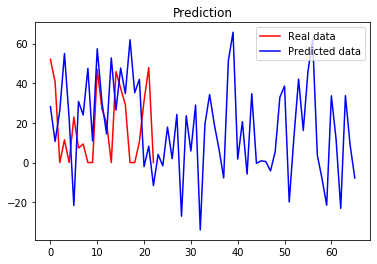

 44%|████▍     | 44/99 [08:47<11:04, 12.09s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 11462228.0000
Epoch 2/100
12/12 [==============================] - 0s 918us/step - loss: 2288365.5000
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 415433.0625
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 151669.8438
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 53779.9688
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 10124.7959
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 6604.6772
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 2637.9287
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 1940.9187
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 1863.7429
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1742.1450
Epoch 12/100
12/12 [==============================] - 0s 1ms/

12/12 [==============================] - 0s 1ms/step - loss: 2151.9031
Epoch 99/100
12/12 [==============================] - 0s 2ms/step - loss: 2402.7056
Epoch 100/100
12/12 [==============================] - 0s 2ms/step - loss: 1449.9646


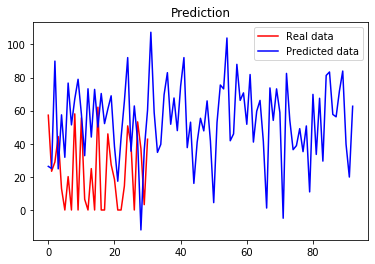

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 1071166.5000
Epoch 2/100
12/12 [==============================] - 0s 2ms/step - loss: 301496.3438
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 296443.4375
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 186595.9062
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 174764.2188
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 164197.1250
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 73874.6484
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 61114.5039
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 46101.3438
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 47121.0859
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 54281.6992
Epoch 12/100
12/12 [==============================] - 0s 1

Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1246.6189
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2584.6680
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 2039.0616


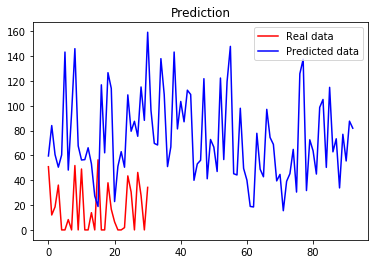

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 1430761.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 298155.9688
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 152445.3750
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 51417.9688
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 32679.3594
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 23183.3340
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 19432.7480
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 14714.7666
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 13136.0146
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 11693.3740
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 12917.2539
Epoch 12/100
12/12 [==============================] - 0s 1ms/

12/12 [==============================] - 0s 1ms/step - loss: 1134.7184
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 703.6671
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 487.0345


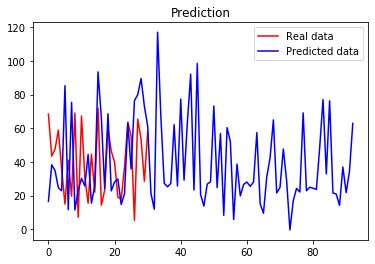

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 892us/step - loss: 2964942.5000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 660376.1250
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 209639.1562
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 143553.2500
Epoch 5/100
9/9 [==============================] - 0s 891us/step - loss: 101500.3594
Epoch 6/100
9/9 [==============================] - 0s 997us/step - loss: 43655.9219
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 22892.5312
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 14531.4590
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 14622.1641
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 11382.3955
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 12680.4707
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss:

9/9 [==============================] - 0s 1ms/step - loss: 30869.6152
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 20144.3965


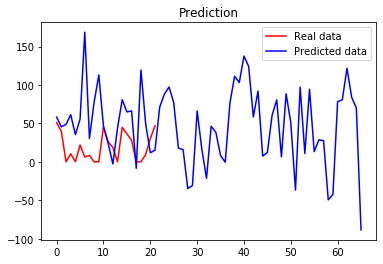

 45%|████▌     | 45/99 [09:00<11:05, 12.33s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 2007863.5000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 388555.4375
Epoch 3/100
12/12 [==============================] - 0s 2ms/step - loss: 97771.9453
Epoch 4/100
12/12 [==============================] - 0s 2ms/step - loss: 25324.6367
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 7001.1011
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 4304.5107
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 3822.8374
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 2811.6453
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 3041.9968
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 3198.9402
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 4375.6494
Epoch 12/100
12/12 [==============================] - 0s 1ms/step

12/12 [==============================] - 0s 1ms/step - loss: 2164.8040
Epoch 99/100
12/12 [==============================] - 0s 997us/step - loss: 1574.0244
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1894.2825


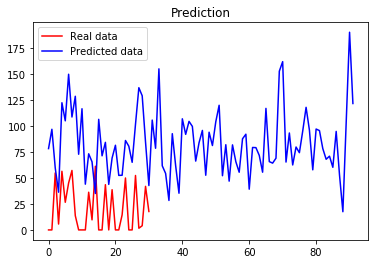

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 5629846.5000
Epoch 2/100
12/12 [==============================] - 0s 999us/step - loss: 1315756.7500
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 370688.5312
Epoch 4/100
12/12 [==============================] - 0s 834us/step - loss: 121168.1641
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 58630.4766
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 50224.4180
Epoch 7/100
12/12 [==============================] - 0s 918us/step - loss: 42745.9414
Epoch 8/100
12/12 [==============================] - 0s 834us/step - loss: 34448.3242
Epoch 9/100
12/12 [==============================] - 0s 918us/step - loss: 31600.6094
Epoch 10/100
12/12 [==============================] - 0s 834us/step - loss: 26253.4453
Epoch 11/100
12/12 [==============================] - 0s 917us/step - loss: 23193.9395
Epoch 12/100
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 2027.5186
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2312.5601
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1631.0121
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1274.9120


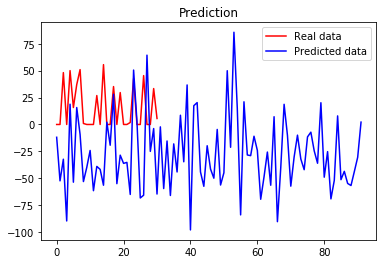

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 1895141.7500
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 565724.5000
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 286851.9688
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 157729.2812
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 88189.7734
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 61992.9453
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 64543.0742
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 59386.5273
Epoch 9/100
12/12 [==============================] - 0s 997us/step - loss: 50677.7461
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 37825.1875
Epoch 11/100
12/12 [==============================] - 0s 996us/step - loss: 41247.9375
Epoch 12/100
12/12 [==============================

12/12 [==============================] - 0s 1ms/step - loss: 1190.5859
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1014.0320
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1392.5393
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 4369.4170


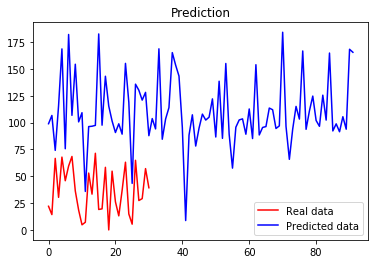

(132, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 2152884.5000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 851559.3750
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 232307.4844
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 72584.8359
Epoch 5/100
9/9 [==============================] - 0s 779us/step - loss: 51577.1602
Epoch 6/100
9/9 [==============================] - 0s 890us/step - loss: 18932.5801
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 25958.4219
Epoch 8/100
9/9 [==============================] - 0s 890us/step - loss: 14702.1533
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 16174.7715
Epoch 10/100
9/9 [==============================] - 0s 887us/step - loss: 23239.0781
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 20096.5254
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - los

9/9 [==============================] - 0s 1ms/step - loss: 4720.6475
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 3190.9001


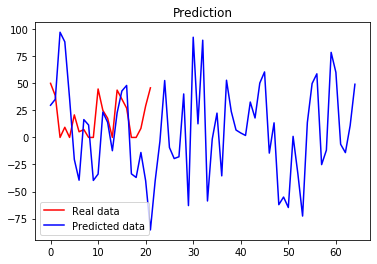

 46%|████▋     | 46/99 [09:11<10:42, 12.12s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 1884414.2500
Epoch 2/100
12/12 [==============================] - 0s 918us/step - loss: 394504.7188
Epoch 3/100
12/12 [==============================] - 0s 914us/step - loss: 128738.3281
Epoch 4/100
12/12 [==============================] - 0s 834us/step - loss: 43826.9844
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 15879.8320
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 5787.2988
Epoch 7/100
12/12 [==============================] - 0s 917us/step - loss: 4891.7993
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 6675.9487
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 3903.9541
Epoch 10/100
12/12 [==============================] - 0s 918us/step - loss: 2666.8621
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 2103.7888
Epoch 12/100
12/12 [==============================] -

Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1791.2576
Epoch 99/100
12/12 [==============================] - 0s 997us/step - loss: 2026.9579
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 6290.9341


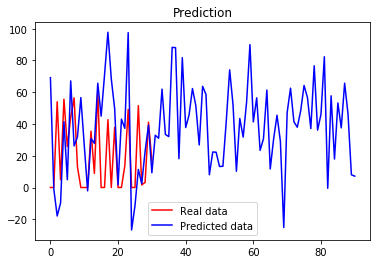

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 917us/step - loss: 1099796.3750
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 190234.5469
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 75962.6797
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 38480.1055
Epoch 5/100
12/12 [==============================] - 0s 997us/step - loss: 32167.9375
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 20974.2344
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 17291.9395
Epoch 8/100
12/12 [==============================] - 0s 831us/step - loss: 15750.3818
Epoch 9/100
12/12 [==============================] - 0s 998us/step - loss: 14144.3203
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 13684.8955
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 19593.1797
Epoch 12/100
12/12 [============================

12/12 [==============================] - 0s 1ms/step - loss: 1469.5570
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2157.4099
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1894.9987


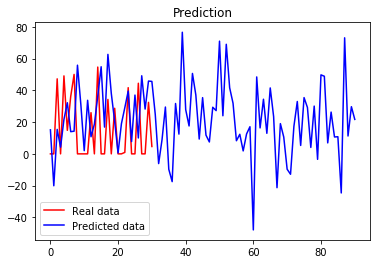

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 1629469.3750
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 473973.5938
Epoch 3/100
12/12 [==============================] - 0s 916us/step - loss: 156892.5312
Epoch 4/100
12/12 [==============================] - 0s 914us/step - loss: 68724.2656
Epoch 5/100
12/12 [==============================] - 0s 914us/step - loss: 43218.9219
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 27966.7988
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 26025.4121
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 22132.9277
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 21979.3203
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 16519.2012
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 15841.3008
Epoch 12/100
12/12 [==============================] -

12/12 [==============================] - 0s 1ms/step - loss: 403.2914
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 358.6326
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 381.9419


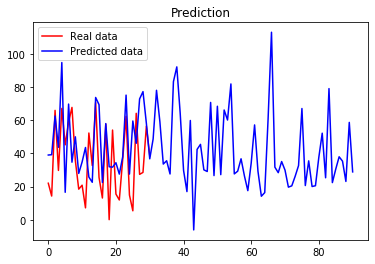

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 3049887.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1264464.1250
Epoch 3/100
8/8 [==============================] - 0s 873us/step - loss: 315482.3125
Epoch 4/100
8/8 [==============================] - 0s 878us/step - loss: 209801.2031
Epoch 5/100
8/8 [==============================] - 0s 874us/step - loss: 126395.9609
Epoch 6/100
8/8 [==============================] - 0s 876us/step - loss: 51113.9961
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 46791.6641
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 17028.1738
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 18812.1211
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 14039.2451
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 13588.1230
Epoch 12/100
8/8 [==============================] - 0s 1ms/step 

Epoch 99/100
8/8 [==============================] - 0s 2ms/step - loss: 5354.7881
Epoch 100/100
8/8 [==============================] - 0s 997us/step - loss: 3310.9265


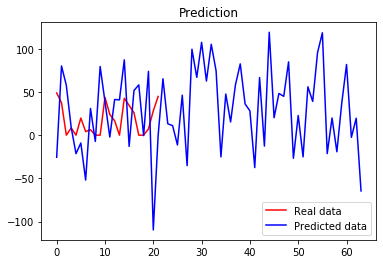

 47%|████▋     | 47/99 [09:23<10:16, 11.86s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 1905853.3750
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 377074.7500
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 74719.4141
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 17796.4180
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 6144.2578
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 4723.5474
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 4386.3740
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 2597.8247
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 2072.1714
Epoch 10/100
12/12 [==============================] - 0s 1000us/step - loss: 2087.7058
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 1868.9395
Epoch 12/100
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 1ms/step - loss: 1719.6493
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 990.1571
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1401.7964


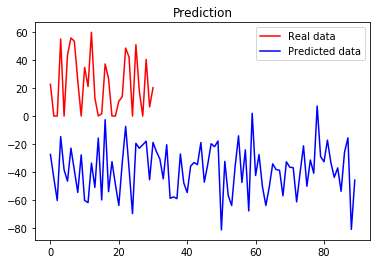

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 997us/step - loss: 1825694.3750
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 164510.9062
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 114989.5469
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 71055.8125
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 48821.4336
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 52287.6602
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 41808.9453
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 34697.1602
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 36326.8945
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 30229.2227
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 22682.3008
Epoch 12/100
12/12 [==============================]

Epoch 98/100
12/12 [==============================] - 0s 997us/step - loss: 1054.4191
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 934.5387
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 827.4658


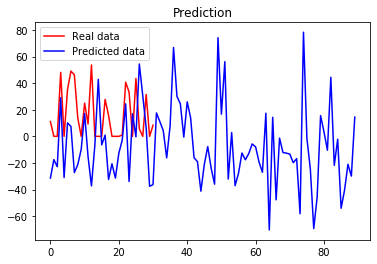

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 13104001.0000
Epoch 2/100
12/12 [==============================] - 0s 914us/step - loss: 2733422.0000
Epoch 3/100
12/12 [==============================] - 0s 917us/step - loss: 679225.4375
Epoch 4/100
12/12 [==============================] - 0s 833us/step - loss: 218471.5156
Epoch 5/100
12/12 [==============================] - 0s 834us/step - loss: 85344.0938
Epoch 6/100
12/12 [==============================] - 0s 997us/step - loss: 52444.7383
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 46449.2539
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 33323.3438
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 30193.0410
Epoch 10/100
12/12 [==============================] - 0s 998us/step - loss: 29606.1113
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 23253.4727
Epoch 12/100
12/12 [======================

12/12 [==============================] - 0s 1ms/step - loss: 3682.1536
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2474.5371
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 3635.7876
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 3428.0044


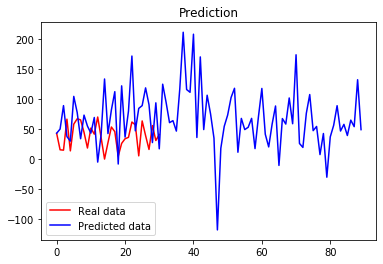

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 6965066.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 1660294.3750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 619416.0000
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 218671.3594
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 95509.6250
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 57864.6758
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 31750.6074
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 14522.4297
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 7868.1309
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 4555.2529
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 3211.3928
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 3040.1201
Ep

8/8 [==============================] - 0s 1ms/step - loss: 1686.4174


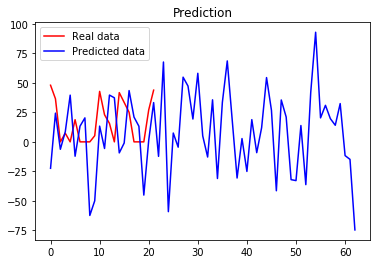

 48%|████▊     | 48/99 [09:34<09:56, 11.70s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 3455716.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 727346.8125
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 253665.7344
Epoch 4/100
12/12 [==============================] - 0s 997us/step - loss: 58509.9648
Epoch 5/100
12/12 [==============================] - 0s 836us/step - loss: 18554.0273
Epoch 6/100
12/12 [==============================] - 0s 997us/step - loss: 12756.0781
Epoch 7/100
12/12 [==============================] - 0s 997us/step - loss: 5827.9805
Epoch 8/100
12/12 [==============================] - 0s 997us/step - loss: 4454.0776
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 4451.5801
Epoch 10/100
12/12 [==============================] - 0s 997us/step - loss: 5536.3770
Epoch 11/100
12/12 [==============================] - 0s 1000us/step - loss: 4541.0034
Epoch 12/100
12/12 [===========================

12/12 [==============================] - 0s 1ms/step - loss: 4686.3706
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2355.5723
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2278.2397
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1046.6787


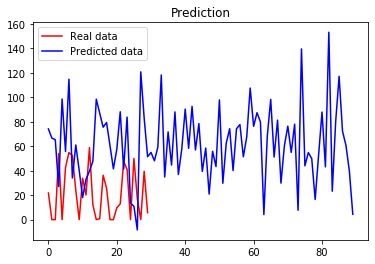

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 831us/step - loss: 1991211.3750
Epoch 2/100
12/12 [==============================] - 0s 996us/step - loss: 542772.8750
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 242563.6250
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 85453.0781
Epoch 5/100
12/12 [==============================] - 0s 831us/step - loss: 73836.1641
Epoch 6/100
12/12 [==============================] - 0s 831us/step - loss: 44750.1641
Epoch 7/100
12/12 [==============================] - 0s 831us/step - loss: 33238.6562
Epoch 8/100
12/12 [==============================] - 0s 914us/step - loss: 26402.1230
Epoch 9/100
12/12 [==============================] - 0s 834us/step - loss: 28977.2852
Epoch 10/100
12/12 [==============================] - 0s 997us/step - loss: 25099.4746
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 25498.2051
Epoch 12/100
12/12 [=========================

12/12 [==============================] - 0s 1ms/step - loss: 3184.0649
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 1384.1272
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 1286.7944
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1570.5891


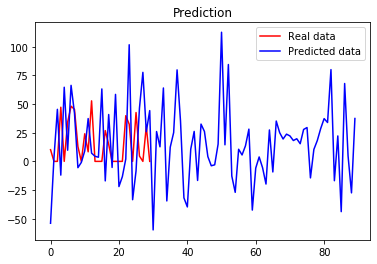

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 23297764.0000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 3955968.0000
Epoch 3/100
12/12 [==============================] - 0s 2ms/step - loss: 1118910.7500
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 377811.2500
Epoch 5/100
12/12 [==============================] - 0s 2ms/step - loss: 215762.5781
Epoch 6/100
12/12 [==============================] - 0s 2ms/step - loss: 134338.0000
Epoch 7/100
12/12 [==============================] - 0s 2ms/step - loss: 122056.3438
Epoch 8/100
12/12 [==============================] - 0s 2ms/step - loss: 120053.5234
Epoch 9/100
12/12 [==============================] - 0s 2ms/step - loss: 118980.5469
Epoch 10/100
12/12 [==============================] - 0s 2ms/step - loss: 103787.3906
Epoch 11/100
12/12 [==============================] - 0s 2ms/step - loss: 95058.3984
Epoch 12/100
12/12 [==============================]

Epoch 97/100
12/12 [==============================] - 0s 1ms/step - loss: 2626.4702
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 3049.0593
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 3177.2246
Epoch 100/100
12/12 [==============================] - ETA: 0s - loss: 3529.75 - 0s 1ms/step - loss: 2495.6548


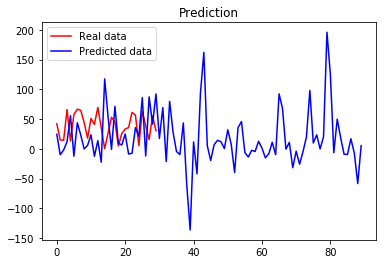

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 2134196.2500
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 406691.6875
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 214286.7656
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 63150.2969
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 48624.0156
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 18092.5312
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 17896.6406
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 16331.0928
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 10463.7754
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 13836.2520
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 14535.6514
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 18292.423

8/8 [==============================] - 0s 1ms/step - loss: 3267.5295


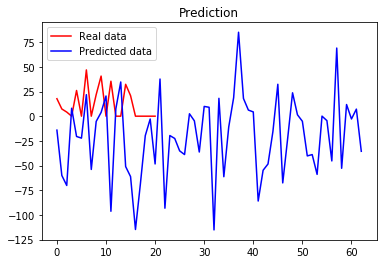

 49%|████▉     | 49/99 [09:47<09:59, 11.99s/it]

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 1ms/step - loss: 3051654.5000
Epoch 2/100
12/12 [==============================] - 0s 1ms/step - loss: 371904.6250
Epoch 3/100
12/12 [==============================] - 0s 1ms/step - loss: 123565.8438
Epoch 4/100
12/12 [==============================] - 0s 1ms/step - loss: 39639.1133
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 8461.9160
Epoch 6/100
12/12 [==============================] - 0s 1ms/step - loss: 7323.4873
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 4224.2134
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 4203.5601
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 2288.2190
Epoch 10/100
12/12 [==============================] - 0s 1ms/step - loss: 2290.0879
Epoch 11/100
12/12 [==============================] - 0s 1ms/step - loss: 2554.7500
Epoch 12/100
12/12 [==============================] - 0s 1ms/step - 

12/12 [==============================] - 0s 1ms/step - loss: 1014.9395
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 754.8702
Epoch 100/100
12/12 [==============================] - 0s 2ms/step - loss: 1401.2260


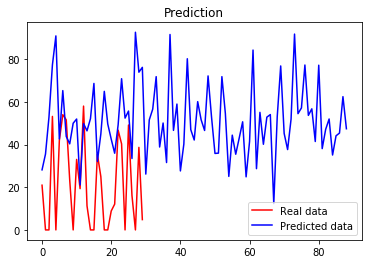

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 914us/step - loss: 2355510.0000
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 425813.6562
Epoch 3/100
12/12 [==============================] - 0s 997us/step - loss: 185596.6562
Epoch 4/100
12/12 [==============================] - 0s 834us/step - loss: 78191.3750
Epoch 5/100
12/12 [==============================] - 0s 832us/step - loss: 35878.3047
Epoch 6/100
12/12 [==============================] - 0s 914us/step - loss: 25039.7617
Epoch 7/100
12/12 [==============================] - 0s 914us/step - loss: 25257.8320
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 19748.3672
Epoch 9/100
12/12 [==============================] - 0s 1ms/step - loss: 19847.0508
Epoch 10/100
12/12 [==============================] - 0s 917us/step - loss: 15728.7246
Epoch 11/100
12/12 [==============================] - 0s 997us/step - loss: 17376.4121
Epoch 12/100
12/12 [=======================

12/12 [==============================] - 0s 1ms/step - loss: 1841.9427
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 2934.8323
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 2538.3884
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 1144.1877


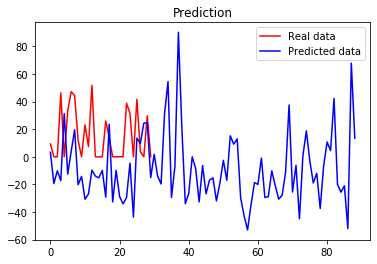

(168, 4)
Epoch 1/100
12/12 [==============================] - 0s 910us/step - loss: 13039183.0000
Epoch 2/100
12/12 [==============================] - 0s 997us/step - loss: 2736124.7500
Epoch 3/100
12/12 [==============================] - 0s 917us/step - loss: 996818.4375
Epoch 4/100
12/12 [==============================] - 0s 831us/step - loss: 424495.4688
Epoch 5/100
12/12 [==============================] - 0s 1ms/step - loss: 182950.5469
Epoch 6/100
12/12 [==============================] - 0s 997us/step - loss: 99480.5938
Epoch 7/100
12/12 [==============================] - 0s 1ms/step - loss: 85571.6641
Epoch 8/100
12/12 [==============================] - 0s 1ms/step - loss: 64923.8203
Epoch 9/100
12/12 [==============================] - 0s 914us/step - loss: 54597.7656
Epoch 10/100
12/12 [==============================] - 0s 831us/step - loss: 51627.5547
Epoch 11/100
12/12 [==============================] - 0s 919us/step - loss: 46171.1953
Epoch 12/100
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 8116.2607
Epoch 97/100
12/12 [==============================] - 0s 1ms/step - loss: 5941.5562
Epoch 98/100
12/12 [==============================] - 0s 1ms/step - loss: 5099.8218
Epoch 99/100
12/12 [==============================] - 0s 1ms/step - loss: 11198.1260
Epoch 100/100
12/12 [==============================] - 0s 1ms/step - loss: 7444.2783


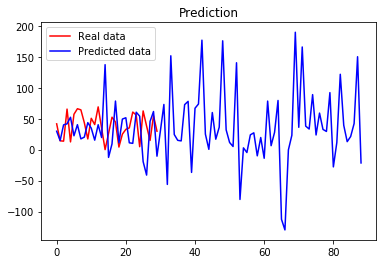

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 2098591.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 475485.3750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 283000.6562
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 165886.0156
Epoch 5/100
8/8 [==============================] - 0s 996us/step - loss: 52175.3555
Epoch 6/100
8/8 [==============================] - 0s 873us/step - loss: 30327.5859
Epoch 7/100
8/8 [==============================] - 0s 873us/step - loss: 12611.4082
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 7043.4424
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 7368.9448
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 5151.0244
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 4915.2988
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 3988.882

8/8 [==============================] - 0s 1ms/step - loss: 1756.2615


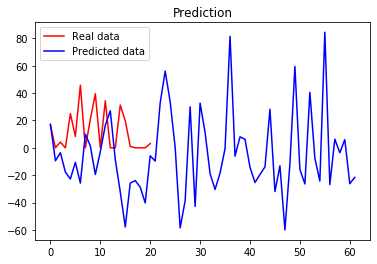

 51%|█████     | 50/99 [09:58<09:40, 11.84s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 8009046.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 1627707.1250
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 472611.0938
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 223214.7344
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 45879.5586
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 23323.5684
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 12391.9834
Epoch 8/100
11/11 [==============================] - 0s 2ms/step - loss: 11169.7178
Epoch 9/100
11/11 [==============================] - 0s 907us/step - loss: 7053.8394
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 8313.2100
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 7578.9985
Epoch 12/100
11/11 [==============================

11/11 [==============================] - 0s 1ms/step - loss: 5152.2637
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 4266.7886
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3310.0203
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2541.9492


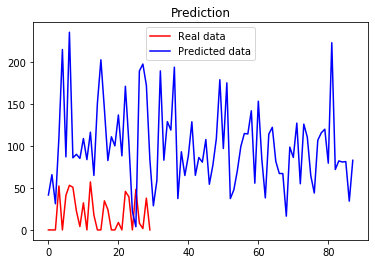

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2968737.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 662784.5625
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 188843.2656
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 73839.5547
Epoch 5/100
11/11 [==============================] - 0s 815us/step - loss: 74413.0312
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 105999.2266
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 115498.5078
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 65185.0859
Epoch 9/100
11/11 [==============================] - 0s 907us/step - loss: 52970.5469
Epoch 10/100
11/11 [==============================] - 0s 816us/step - loss: 48145.7148
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 46892.5742
Epoch 12/100
11/11 [=====================

11/11 [==============================] - 0s 1ms/step - loss: 1879.5426
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2382.4192
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2817.8716
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2369.9995


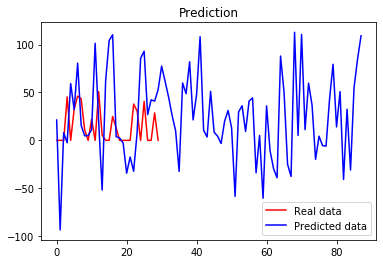

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2307077.7500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 559082.0625
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 203395.1875
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 168525.7344
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 183773.8906
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 133420.5312
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 87056.8750
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 107244.7812
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 83959.7969
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 70943.7891
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 56988.7617
Epoch 12/100
11/11 [==============================] - 0s 

Epoch 98/100
11/11 [==============================] - 0s 998us/step - loss: 5402.6973
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3310.4297
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2391.5032


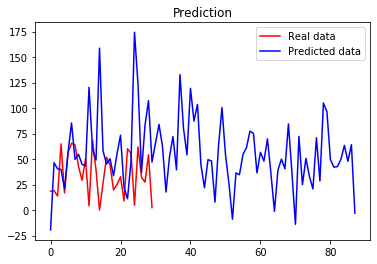

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 873us/step - loss: 4053699.5000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 1309788.6250
Epoch 3/100
8/8 [==============================] - 0s 748us/step - loss: 481668.1562
Epoch 4/100
8/8 [==============================] - 0s 873us/step - loss: 180362.4062
Epoch 5/100
8/8 [==============================] - 0s 873us/step - loss: 79137.2578
Epoch 6/100
8/8 [==============================] - 0s 873us/step - loss: 34124.3672
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 13833.6963
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 8562.9482
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 4990.4434
Epoch 10/100
8/8 [==============================] - 0s 873us/step - loss: 4218.2217
Epoch 11/100
8/8 [==============================] - 0s 878us/step - loss: 3255.9285
Epoch 12/100
8/8 [==============================] - 0s 873us/step -

8/8 [==============================] - 0s 1ms/step - loss: 2543.6870


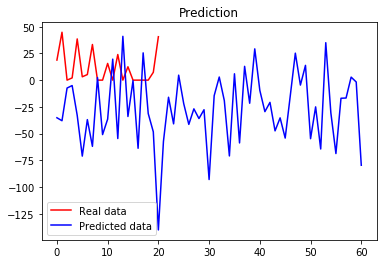

 52%|█████▏    | 51/99 [10:09<09:11, 11.49s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 910us/step - loss: 8713122.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 1924245.7500
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 445649.0000
Epoch 4/100
11/11 [==============================] - 0s 816us/step - loss: 104889.3438
Epoch 5/100
11/11 [==============================] - 0s 816us/step - loss: 37496.5625
Epoch 6/100
11/11 [==============================] - 0s 995us/step - loss: 18210.6348
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 6898.3198
Epoch 8/100
11/11 [==============================] - 0s 818us/step - loss: 3046.0496
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 1927.6398
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 1458.9653
Epoch 11/100
11/11 [==============================] - 0s 908us/step - loss: 1353.9900
Epoch 12/100
11/11 [========================

Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1682.1460
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1239.7130
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1427.7200


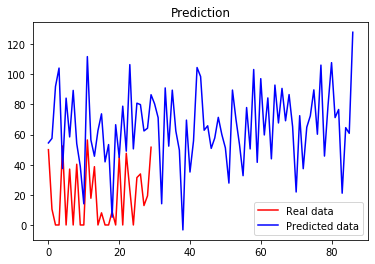

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 6696168.5000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 1052112.7500
Epoch 3/100
11/11 [==============================] - 0s 910us/step - loss: 339184.8125
Epoch 4/100
11/11 [==============================] - 0s 910us/step - loss: 225614.7188
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 114887.3984
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 71810.0391
Epoch 7/100
11/11 [==============================] - 0s 908us/step - loss: 63582.6797
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 46973.7461
Epoch 9/100
11/11 [==============================] - 0s 910us/step - loss: 42472.2344
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 45246.0352
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 38379.6641
Epoch 12/100
11/11 [==========================

11/11 [==============================] - 0s 997us/step - loss: 1312.9949
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1155.2468
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1810.7999
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1448.0468


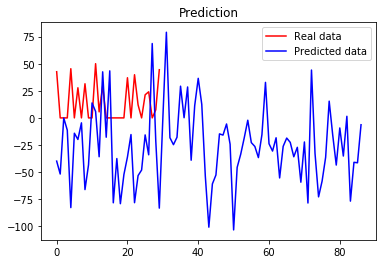

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 906us/step - loss: 4236790.5000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 1348897.2500
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 746496.7500
Epoch 4/100
11/11 [==============================] - 0s 910us/step - loss: 188509.5938
Epoch 5/100
11/11 [==============================] - 0s 816us/step - loss: 157413.1562
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 124306.7734
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 124258.3594
Epoch 8/100
11/11 [==============================] - 0s 907us/step - loss: 113399.0469
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 104999.2188
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 105635.8750
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 105570.8984
Epoch 12/100
11/11 [==============

11/11 [==============================] - 0s 1ms/step - loss: 3020.5342
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 6424.5942
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2747.6365
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1526.7719


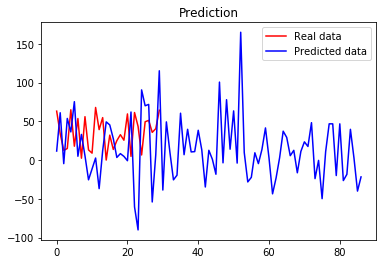

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 2782268.5000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 973736.0625
Epoch 3/100
8/8 [==============================] - 0s 873us/step - loss: 331282.0938
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 268922.7188
Epoch 5/100
8/8 [==============================] - 0s 877us/step - loss: 94022.0781
Epoch 6/100
8/8 [==============================] - 0s 877us/step - loss: 105405.2500
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 33257.0820
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 24874.4043
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 24419.5332
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 18428.9082
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 12546.5742
Epoch 12/100
8/8 [==============================] - 0s 1ms/step -

8/8 [==============================] - 0s 2ms/step - loss: 7884.4287
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 9400.2090


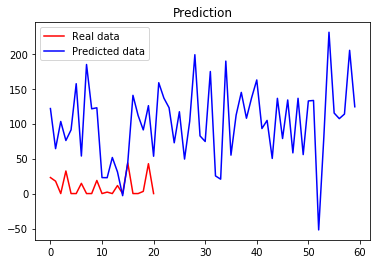

 53%|█████▎    | 52/99 [10:20<08:49, 11.27s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2149800.7500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 383723.5938
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 113655.5312
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 40541.7305
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 14688.2314
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 6922.4727
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 2615.5540
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 1398.3660
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 1485.8059
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 1621.1207
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 1435.6022
Epoch 12/100
11/11 [==============================] - 0s 1ms/step -

Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2607.3440
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3904.0283
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 4953.3281


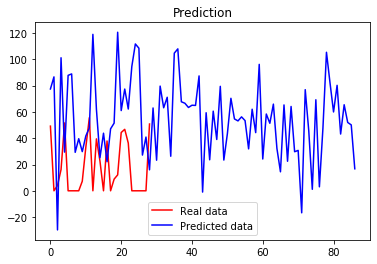

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 2854097.0000
Epoch 2/100
11/11 [==============================] - 0s 1000us/step - loss: 463213.8750
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 194121.2344
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 102841.8281
Epoch 5/100
11/11 [==============================] - 0s 911us/step - loss: 70369.7266
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 63871.9531
Epoch 7/100
11/11 [==============================] - 0s 998us/step - loss: 50266.2812
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 46486.8320
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 36596.4844
Epoch 10/100
11/11 [==============================] - 0s 994us/step - loss: 33713.9961
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 28552.8418
Epoch 12/100
11/11 [=====================

11/11 [==============================] - 0s 997us/step - loss: 2600.2759
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1809.5061
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2212.5774
Epoch 100/100
11/11 [==============================] - 0s 997us/step - loss: 2193.2483


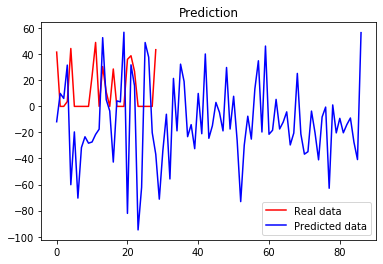

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 1627776.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 367923.0312
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 281268.0625
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 96045.3203
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 70660.2734
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 77911.5625
Epoch 7/100
11/11 [==============================] - 0s 820us/step - loss: 102493.6875
Epoch 8/100
11/11 [==============================] - 0s 907us/step - loss: 77489.0938
Epoch 9/100
11/11 [==============================] - 0s 910us/step - loss: 48335.1133
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 63576.7227
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 78234.1406
Epoch 12/100
11/11 [======================

11/11 [==============================] - 0s 1ms/step - loss: 1430.7657
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 843.4116
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1835.7249
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1241.9043


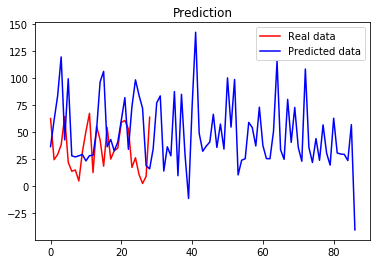

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 998us/step - loss: 3091488.2500
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 640782.6875
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 410445.3125
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 135001.9219
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 51105.5156
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 27506.5234
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 19048.8887
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 13880.9727
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 12518.7158
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 12793.1240
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 15881.1514
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 14

8/8 [==============================] - 0s 2ms/step - loss: 1768.1257


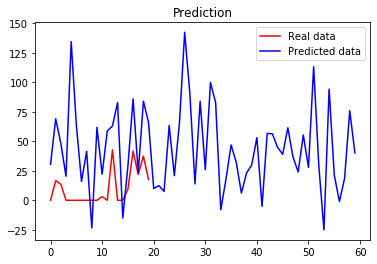

 54%|█████▎    | 53/99 [10:32<08:51, 11.55s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2095784.8750
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 414364.1250
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 136567.4062
Epoch 4/100
11/11 [==============================] - 0s 2ms/step - loss: 50815.6875
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 20125.0059
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 7093.8438
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 8399.4209
Epoch 8/100
11/11 [==============================] - 0s 2ms/step - loss: 7345.7876
Epoch 9/100
11/11 [==============================] - 0s 2ms/step - loss: 5606.6797
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 4349.9302
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 3985.6047
Epoch 12/100
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 1ms/step - loss: 2597.8696
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 4340.1167
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2749.8245
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3372.4932


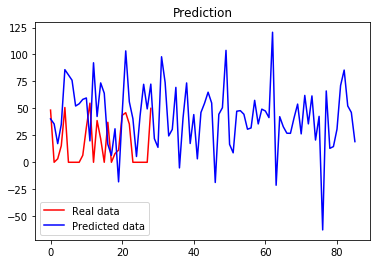

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 3738679.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 801635.6250
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 457244.9375
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 201730.4219
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 173080.6719
Epoch 6/100
11/11 [==============================] - 0s 2ms/step - loss: 137332.9375
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 104060.2344
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 74896.9062
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 65525.6445
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 66070.3984
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 68865.5469
Epoch 12/100
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 2ms/step - loss: 2791.2971
Epoch 99/100
11/11 [==============================] - 0s 2ms/step - loss: 1216.1305
Epoch 100/100
11/11 [==============================] - 0s 2ms/step - loss: 1262.3585


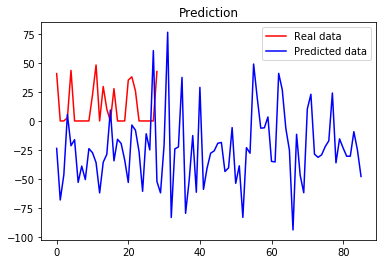

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 3007441.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 624384.8125
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 173709.1406
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 143556.6562
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 112188.8594
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 76297.7812
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 47952.6367
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 46402.7461
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 45316.3633
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 42104.1289
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 30048.2480
Epoch 12/100
11/11 [==============================] - 0

11/11 [==============================] - 0s 1ms/step - loss: 2644.6899
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1552.6398
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2015.9435
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2876.4954


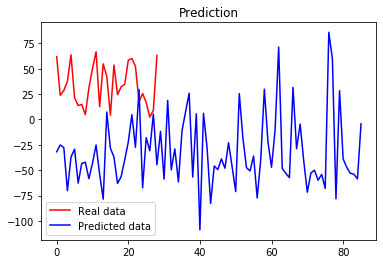

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 6157466.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 1250665.1250
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 450937.5625
Epoch 4/100
8/8 [==============================] - 0s 2ms/step - loss: 155281.4531
Epoch 5/100
8/8 [==============================] - 0s 2ms/step - loss: 100697.2344
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 53859.8438
Epoch 7/100
8/8 [==============================] - 0s 2ms/step - loss: 28074.3652
Epoch 8/100
8/8 [==============================] - 0s 2ms/step - loss: 11122.3984
Epoch 9/100
8/8 [==============================] - 0s 2ms/step - loss: 4099.4385
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 2147.9958
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 1576.9417
Epoch 12/100
8/8 [==============================] - 0s 2ms/step - loss: 1572.5216
E

8/8 [==============================] - 0s 1ms/step - loss: 1631.4062


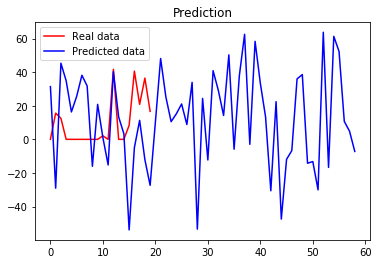

 55%|█████▍    | 54/99 [10:45<08:56, 11.92s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2983961.5000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 501818.2188
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 137655.7812
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 39138.6602
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 18397.5879
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 7147.4521
Epoch 7/100
11/11 [==============================] - 0s 2ms/step - loss: 5008.2480
Epoch 8/100
11/11 [==============================] - 0s 2ms/step - loss: 4222.2417
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 2985.3452
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 2932.3052
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 4033.5291
Epoch 12/100
11/11 [==============================] - 0s 1ms/step -

11/11 [==============================] - 0s 1ms/step - loss: 2962.1265
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3157.9841
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 7244.7603


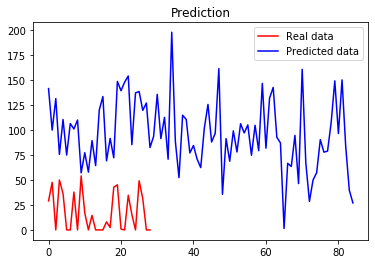

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 906us/step - loss: 8556732.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 1650239.6250
Epoch 3/100
11/11 [==============================] - 0s 910us/step - loss: 353737.8750
Epoch 4/100
11/11 [==============================] - 0s 816us/step - loss: 130942.9844
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 107885.4375
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 81849.2969
Epoch 7/100
11/11 [==============================] - 0s 910us/step - loss: 56320.6367
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 49141.4922
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 62091.4297
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 50248.5195
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 41680.2227
Epoch 12/100
11/11 [======================

11/11 [==============================] - 0s 1ms/step - loss: 4784.8667
Epoch 97/100
11/11 [==============================] - 0s 1ms/step - loss: 4206.4048
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 3626.2117
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3448.6946
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 4265.6050


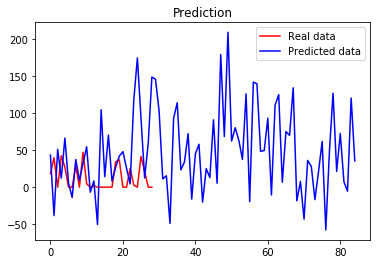

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 3361547.7500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 566573.4375
Epoch 3/100
11/11 [==============================] - 0s 910us/step - loss: 417071.7500
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 135758.6875
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 92509.3359
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 126970.1641
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 106295.1641
Epoch 8/100
11/11 [==============================] - 0s 910us/step - loss: 52286.2109
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 45417.4688
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 46081.2188
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 40720.8789
Epoch 12/100
11/11 [============================

11/11 [==============================] - 0s 1ms/step - loss: 1170.8062
Epoch 99/100
11/11 [==============================] - 0s 2ms/step - loss: 1947.9498
Epoch 100/100
11/11 [==============================] - 0s 2ms/step - loss: 1330.4156


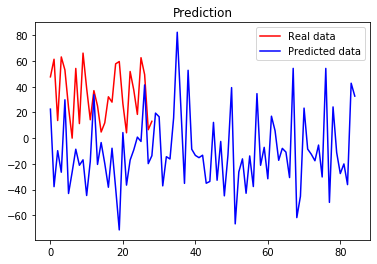

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 3650779.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 1482188.5000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 423745.7812
Epoch 4/100
8/8 [==============================] - 0s 872us/step - loss: 313537.6562
Epoch 5/100
8/8 [==============================] - 0s 877us/step - loss: 98306.8906
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 91494.0156
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 35509.4297
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 39457.0508
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 20126.7559
Epoch 10/100
8/8 [==============================] - 0s 992us/step - loss: 12968.5605
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 9344.4551
Epoch 12/100
8/8 [==============================] - 0s 873us/step 

8/8 [==============================] - 0s 1ms/step - loss: 3557.2686
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 9594.4160


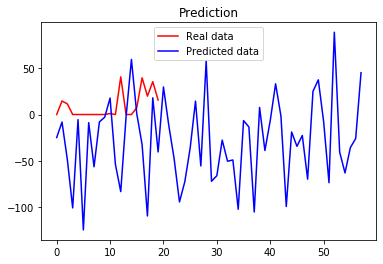

 56%|█████▌    | 55/99 [10:56<08:37, 11.75s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 2438483.5000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 408628.0000
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 137248.3125
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 56241.1172
Epoch 5/100
11/11 [==============================] - 0s 998us/step - loss: 18079.3105
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 15046.7520
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 5026.9087
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 5555.2563
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 7054.3652
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 7145.0781
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 3895.2671
Epoch 12/100
11/11 [==============================] - 0s 1

11/11 [==============================] - 0s 1ms/step - loss: 1251.6920
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2735.9827
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2316.7542
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1711.1328


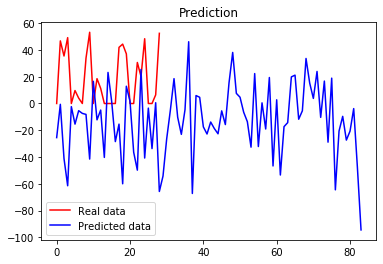

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 4048444.2500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 595728.5000
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 333956.6875
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 84915.9922
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 48370.0820
Epoch 6/100
11/11 [==============================] - 0s 910us/step - loss: 40099.1914
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 32790.6328
Epoch 8/100
11/11 [==============================] - 0s 910us/step - loss: 23808.2090
Epoch 9/100
11/11 [==============================] - 0s 907us/step - loss: 22587.3613
Epoch 10/100
11/11 [==============================] - 0s 819us/step - loss: 22079.5957
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 20692.7734
Epoch 12/100
11/11 [===========================

11/11 [==============================] - 0s 997us/step - loss: 1382.4430
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1098.3916
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1699.6619
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1459.6542


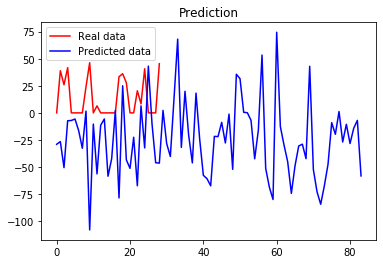

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 17772330.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 4654978.0000
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 1720305.3750
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 746961.3750
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 419657.0000
Epoch 6/100
11/11 [==============================] - 0s 998us/step - loss: 343932.3438
Epoch 7/100
11/11 [==============================] - 0s 910us/step - loss: 292486.0312
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 289936.8750
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 252722.0000
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 231353.3750
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 218578.2656
Epoch 12/100
11/11 [========================

11/11 [==============================] - 0s 1ms/step - loss: 3439.0698
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 3199.8245
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3704.3521
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 6103.7090


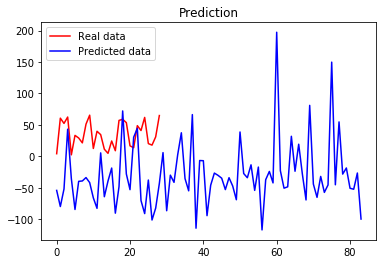

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 873us/step - loss: 6869546.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 2314143.5000
Epoch 3/100
8/8 [==============================] - 0s 873us/step - loss: 860567.2500
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 309874.3438
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 209850.9375
Epoch 6/100
8/8 [==============================] - 0s 1000us/step - loss: 72446.9062
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 15901.5498
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 8465.7207
Epoch 9/100
8/8 [==============================] - 0s 878us/step - loss: 9737.2529
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 8590.4990
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 13150.3398
Epoch 12/100
8/8 [==============================] - 0s 877us/ste

8/8 [==============================] - 0s 997us/step - loss: 9324.2070
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 8084.7627


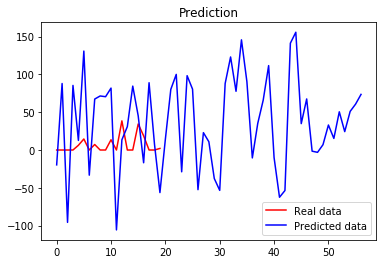

 57%|█████▋    | 56/99 [11:07<08:11, 11.44s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 30523550.0000
Epoch 2/100
11/11 [==============================] - 0s 2ms/step - loss: 6740724.0000
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 2049469.3750
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 531740.6875
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 189625.6875
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 70318.9375
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 46090.1328
Epoch 8/100
11/11 [==============================] - 0s 910us/step - loss: 13002.2754
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 10615.1992
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 10920.7314
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 8787.6250
Epoch 12/100
11/11 [=============================

11/11 [==============================] - 0s 1ms/step - loss: 8368.7539
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 6737.8979
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 5556.7563
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 6670.7388


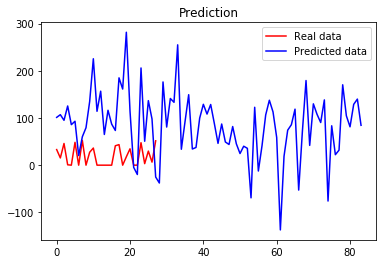

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 4051358.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 897273.5000
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 422011.7188
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 158640.4219
Epoch 5/100
11/11 [==============================] - 0s 2ms/step - loss: 71031.3906
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 56247.1055
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 51221.2812
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 56008.0938
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 57532.7578
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 60767.4688
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 38477.8203
Epoch 12/100
11/11 [==============================] - 0s 1ms

11/11 [==============================] - 0s 1ms/step - loss: 2614.0208
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 2588.3398
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 3122.2322
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3857.8962


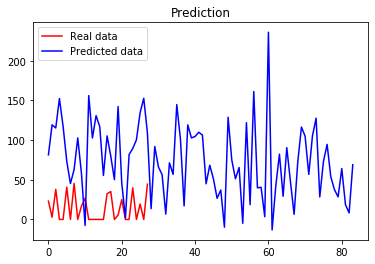

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 10592268.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 2885977.7500
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 790612.4375
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 299439.5312
Epoch 5/100
11/11 [==============================] - 0s 997us/step - loss: 220578.6875
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 192386.4531
Epoch 7/100
11/11 [==============================] - 0s 820us/step - loss: 165217.1719
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 142419.0781
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 132909.4062
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 112869.0703
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 114709.9297
Epoch 12/100
11/11 [=====================

11/11 [==============================] - 0s 1ms/step - loss: 1904.1289
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2400.2183
Epoch 99/100
11/11 [==============================] - 0s 997us/step - loss: 1660.0677
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1424.1697


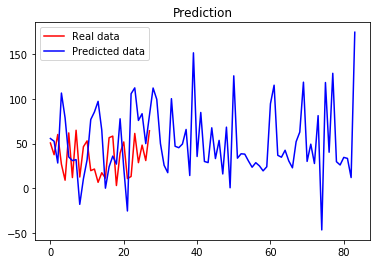

(132, 4)
Epoch 1/100
8/8 [==============================] - 0s 873us/step - loss: 2386848.2500
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 607761.1250
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 197540.3125
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 77266.2422
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 39204.8477
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 19441.4766
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 8298.9346
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 10357.3779
Epoch 9/100
8/8 [==============================] - 0s 877us/step - loss: 7819.4077
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 4411.5454
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 5189.7900
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 4

8/8 [==============================] - 0s 2ms/step - loss: 3272.6450


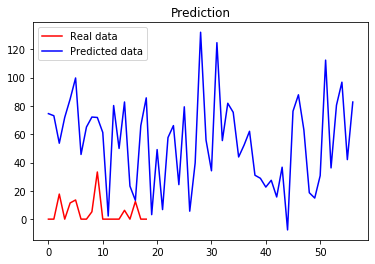

 58%|█████▊    | 57/99 [11:18<08:03, 11.50s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 2872341.7500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 579141.5625
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 146688.0938
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 66226.8828
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 16714.0762
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 8447.0479
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 3941.0813
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 2457.2581
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 2030.5098
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 1307.2574
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 1034.6615
Epoch 12/100
11/11 [==============================] - 0s 1ms/step

11/11 [==============================] - 0s 1ms/step - loss: 724.4306
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1211.2773
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1937.5676


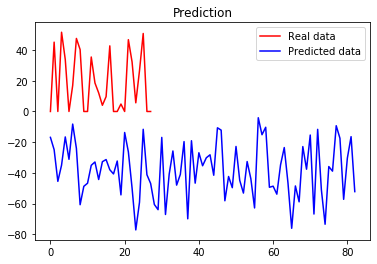

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 6610402.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 1686140.5000
Epoch 3/100
11/11 [==============================] - 0s 908us/step - loss: 407460.1875
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 160143.7812
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 87692.4609
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 60638.1211
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 28892.3711
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 22256.0723
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 19087.8066
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 25366.5547
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 21989.9727
Epoch 12/100
11/11 [==============================] -

11/11 [==============================] - 0s 2ms/step - loss: 2379.0938
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2644.7488
Epoch 99/100
11/11 [==============================] - 0s 2ms/step - loss: 1796.6742
Epoch 100/100
11/11 [==============================] - 0s 2ms/step - loss: 2293.1604


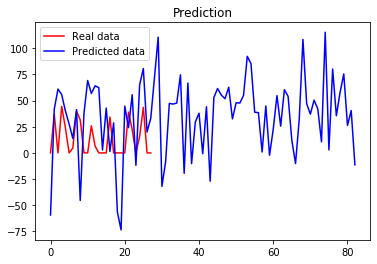

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 2ms/step - loss: 1535141.3750
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 333651.4688
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 134484.1875
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 157342.1562
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 54993.2461
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 44300.1328
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 35744.5430
Epoch 8/100
11/11 [==============================] - 0s 2ms/step - loss: 33735.8477
Epoch 9/100
11/11 [==============================] - 0s 2ms/step - loss: 28990.0762
Epoch 10/100
11/11 [==============================] - 0s 2ms/step - loss: 25341.7227
Epoch 11/100
11/11 [==============================] - 0s 2ms/step - loss: 24279.3516
Epoch 12/100
11/11 [==============================] - 0s 2ms

Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 2759.6543
Epoch 99/100
11/11 [==============================] - 0s 997us/step - loss: 1429.6219
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1729.1244


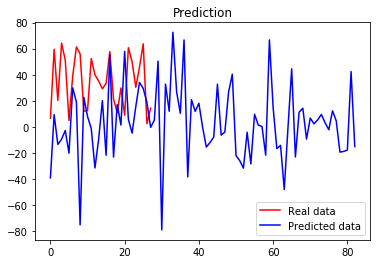

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 997us/step - loss: 5171785.0000
Epoch 2/100
7/7 [==============================] - 0s 861us/step - loss: 1816865.3750
Epoch 3/100
7/7 [==============================] - 0s 997us/step - loss: 712721.4375
Epoch 4/100
7/7 [==============================] - 0s 2ms/step - loss: 299165.3125
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 146817.4531
Epoch 6/100
7/7 [==============================] - 0s 997us/step - loss: 67781.2422
Epoch 7/100
7/7 [==============================] - 0s 855us/step - loss: 34429.9375
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 20461.8750
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 13609.4131
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 8455.8896
Epoch 11/100
7/7 [==============================] - 0s 997us/step - loss: 5675.5830
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss

Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 7649.7124


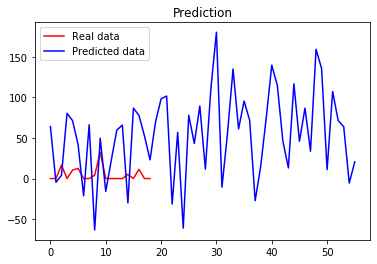

 59%|█████▊    | 58/99 [11:30<07:51, 11.51s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 2580378.7500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 464434.1875
Epoch 3/100
11/11 [==============================] - 0s 907us/step - loss: 168038.2500
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 47986.1445
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 19445.9258
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 11774.6689
Epoch 7/100
11/11 [==============================] - 0s 997us/step - loss: 5195.6128
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 3897.9346
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 3009.3933
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 1734.0835
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 3685.6211
Epoch 12/100
11/11 [==============================] - 0s 1ms

Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1315.0568
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1542.6101
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1861.0903


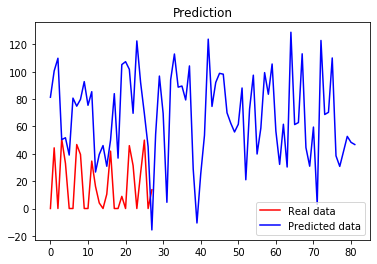

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 1049912.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 196685.8438
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 109463.7422
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 59465.0000
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 69863.7188
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 41759.6953
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 30966.0312
Epoch 8/100
11/11 [==============================] - 0s 996us/step - loss: 35452.2969
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 30306.7656
Epoch 10/100
11/11 [==============================] - 0s 997us/step - loss: 23233.4902
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 19638.6777
Epoch 12/100
11/11 [==============================] - 0

11/11 [==============================] - 0s 1ms/step - loss: 744.9854
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 548.9636
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 312.7174


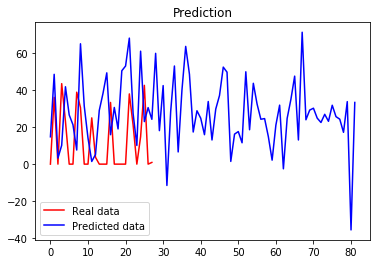

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 5498337.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 987270.8125
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 320173.3750
Epoch 4/100
11/11 [==============================] - 0s 997us/step - loss: 277276.1562
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 163867.0312
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 104928.3047
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 107639.1094
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 95201.4297
Epoch 9/100
11/11 [==============================] - 0s 998us/step - loss: 79989.2734
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 57125.0469
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 44932.3320
Epoch 12/100
11/11 [==============================] -

11/11 [==============================] - 0s 1ms/step - loss: 4353.2715
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 2187.2026
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2859.7480
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3644.7854


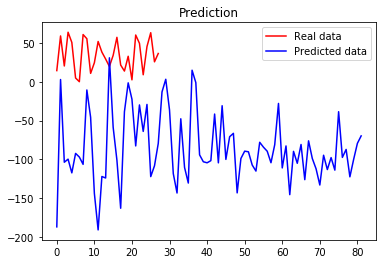

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 72434272.0000
Epoch 2/100
7/7 [==============================] - 0s 997us/step - loss: 26939856.0000
Epoch 3/100
7/7 [==============================] - 0s 2ms/step - loss: 1809107.2500
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 3939082.2500
Epoch 5/100
7/7 [==============================] - 0s 855us/step - loss: 535957.3750
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 735970.1875
Epoch 7/100
7/7 [==============================] - 0s 997us/step - loss: 141549.5625
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 177514.5938
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 32408.0176
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 45512.4062
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 6720.5776
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - lo

Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 1270.0244


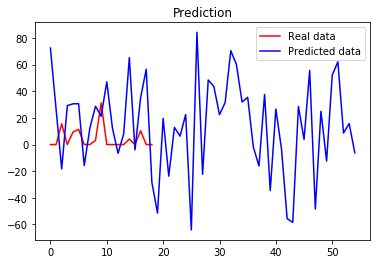

 60%|█████▉    | 59/99 [11:41<07:39, 11.50s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 5594289.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 893929.0625
Epoch 3/100
11/11 [==============================] - 0s 910us/step - loss: 455001.5938
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 112132.4453
Epoch 5/100
11/11 [==============================] - 0s 816us/step - loss: 58528.8594
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 14589.8105
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 6708.3818
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 3682.1902
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 2331.0767
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 2496.6035
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 2190.1584
Epoch 12/100
11/11 [==============================]

Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 1069.4220
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1663.6204
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3270.1675


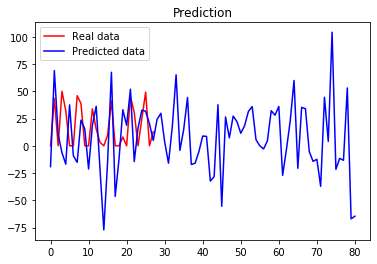

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 4264219.5000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 654677.0000
Epoch 3/100
11/11 [==============================] - 0s 910us/step - loss: 153052.6719
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 102740.3984
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 72564.9297
Epoch 6/100
11/11 [==============================] - 0s 907us/step - loss: 46928.5664
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 61942.5078
Epoch 8/100
11/11 [==============================] - 0s 910us/step - loss: 71448.7969
Epoch 9/100
11/11 [==============================] - 0s 912us/step - loss: 37216.3438
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 33677.5391
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 27870.3633
Epoch 12/100
11/11 [====================

Epoch 97/100
11/11 [==============================] - 0s 1ms/step - loss: 4462.7681
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 3876.2446
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2715.7087
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 2725.2402


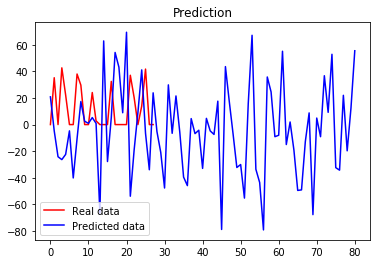

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 907us/step - loss: 26382206.0000
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 4513001.0000
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 1607770.6250
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 800049.5000
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 397584.2812
Epoch 6/100
11/11 [==============================] - 0s 997us/step - loss: 228359.9688
Epoch 7/100
11/11 [==============================] - 0s 997us/step - loss: 177662.2656
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 157286.8594
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 134816.8906
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 149950.0938
Epoch 11/100
11/11 [==============================] - 0s 997us/step - loss: 143915.6250
Epoch 12/100
11/11 [============

Epoch 97/100
11/11 [==============================] - 0s 1ms/step - loss: 2664.8484
Epoch 98/100
11/11 [==============================] - 0s 907us/step - loss: 2450.1018
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 4293.1138
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 3412.9333


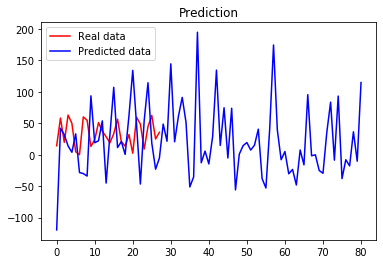

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 997us/step - loss: 5798295.0000
Epoch 2/100
7/7 [==============================] - 0s 997us/step - loss: 1914767.5000
Epoch 3/100
7/7 [==============================] - 0s 855us/step - loss: 1000619.3125
Epoch 4/100
7/7 [==============================] - 0s 860us/step - loss: 544300.1250
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 288742.1875
Epoch 6/100
7/7 [==============================] - 0s 998us/step - loss: 133057.1562
Epoch 7/100
7/7 [==============================] - 0s 861us/step - loss: 69644.5859
Epoch 8/100
7/7 [==============================] - 0s 855us/step - loss: 34100.2461
Epoch 9/100
7/7 [==============================] - 0s 997us/step - loss: 17413.6973
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 13837.6338
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 9558.3096
Epoch 12/100
7/7 [==============================] - 0s 997us/st

7/7 [==============================] - 0s 1ms/step - loss: 6381.4541


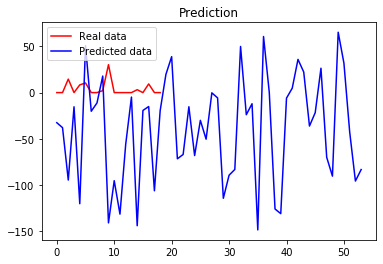

 61%|██████    | 60/99 [11:52<07:22, 11.35s/it]

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 6598809.0000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 1414400.5000
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 332825.4688
Epoch 4/100
11/11 [==============================] - 0s 910us/step - loss: 104292.7500
Epoch 5/100
11/11 [==============================] - 0s 907us/step - loss: 42563.9844
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 16426.6367
Epoch 7/100
11/11 [==============================] - 0s 906us/step - loss: 4124.2246
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 2560.1301
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 1774.9369
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 1076.3715
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 1440.2296
Epoch 12/100
11/11 [============================

11/11 [==============================] - 0s 1ms/step - loss: 867.0825
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 1063.7523
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 931.2712


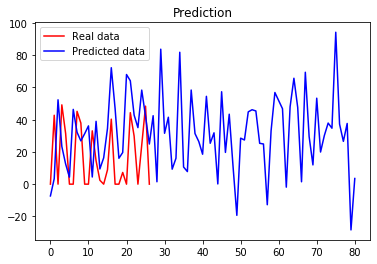

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 1ms/step - loss: 3163700.2500
Epoch 2/100
11/11 [==============================] - 0s 1ms/step - loss: 908000.8750
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 291280.1250
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 165312.5781
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 94755.7188
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 73122.1016
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 76146.9141
Epoch 8/100
11/11 [==============================] - 0s 1ms/step - loss: 62670.6484
Epoch 9/100
11/11 [==============================] - 0s 1ms/step - loss: 43169.8281
Epoch 10/100
11/11 [==============================] - 0s 1ms/step - loss: 108592.3828
Epoch 11/100
11/11 [==============================] - 0s 1ms/step - loss: 60927.7969
Epoch 12/100
11/11 [==============================] - 0s 1m

11/11 [==============================] - 0s 1ms/step - loss: 1334.8962
Epoch 98/100
11/11 [==============================] - 0s 1ms/step - loss: 965.1517
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 703.8293
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 1424.9893


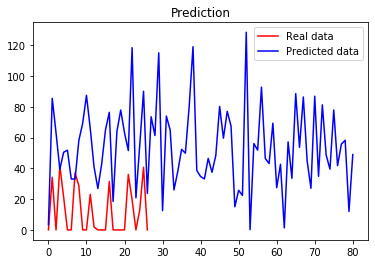

(168, 4)
Epoch 1/100
11/11 [==============================] - 0s 997us/step - loss: 3881014.5000
Epoch 2/100
11/11 [==============================] - 0s 997us/step - loss: 1010381.8125
Epoch 3/100
11/11 [==============================] - 0s 997us/step - loss: 262093.5000
Epoch 4/100
11/11 [==============================] - 0s 907us/step - loss: 112817.5312
Epoch 5/100
11/11 [==============================] - 0s 1ms/step - loss: 100325.9688
Epoch 6/100
11/11 [==============================] - 0s 1ms/step - loss: 72448.6016
Epoch 7/100
11/11 [==============================] - 0s 907us/step - loss: 86634.4062
Epoch 8/100
11/11 [==============================] - 0s 997us/step - loss: 186344.9375
Epoch 9/100
11/11 [==============================] - 0s 997us/step - loss: 93261.3984
Epoch 10/100
11/11 [==============================] - 0s 907us/step - loss: 109932.8516
Epoch 11/100
11/11 [==============================] - 0s 907us/step - loss: 73089.6875
Epoch 12/100
11/11 [==================

11/11 [==============================] - 0s 1ms/step - loss: 1901.2980
Epoch 98/100
11/11 [==============================] - 0s 997us/step - loss: 2170.9463
Epoch 99/100
11/11 [==============================] - 0s 1ms/step - loss: 2391.0188
Epoch 100/100
11/11 [==============================] - 0s 1ms/step - loss: 5842.9893


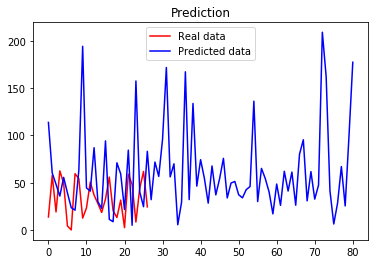

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 998us/step - loss: 3517723.7500
Epoch 2/100
7/7 [==============================] - 0s 998us/step - loss: 1113965.7500
Epoch 3/100
7/7 [==============================] - 0s 997us/step - loss: 607816.8125
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 280770.0000
Epoch 5/100
7/7 [==============================] - 0s 860us/step - loss: 124973.7500
Epoch 6/100
7/7 [==============================] - 0s 861us/step - loss: 55787.0156
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 28787.4102
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 15868.5117
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 11325.5205
Epoch 10/100
7/7 [==============================] - 0s 860us/step - loss: 11688.1621
Epoch 11/100
7/7 [==============================] - 0s 996us/step - loss: 5815.5645
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - l

Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 2013.8309


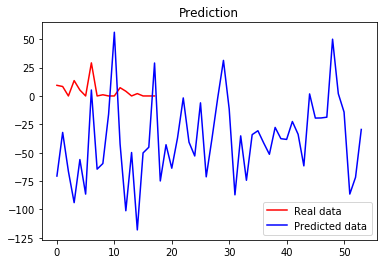

 62%|██████▏   | 61/99 [12:04<07:13, 11.40s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 5383092.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 943739.3125
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 451953.0938
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 96936.8438
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 55631.6953
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 21010.6348
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 11896.5215
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 9407.9629
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 8297.3418
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 5456.2686
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 4483.6021
Epoch 12/100
10/10 [==============================] - 0s 997u

10/10 [==============================] - 0s 898us/step - loss: 3231.7349
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 4538.4199
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2156.5806
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2921.3774


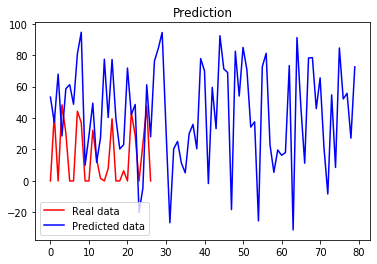

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 3851760.7500
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1227608.6250
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 837810.5000
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 340510.8125
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 241234.1562
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 205520.0469
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 176637.7500
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 123977.0391
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 149729.2188
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 130981.8750
Epoch 11/100
10/10 [==============================] - 0s 998us/step - loss: 119330.9375
Epoch 12/100
10/10 [====================

10/10 [==============================] - 0s 997us/step - loss: 3179.3384
Epoch 97/100
10/10 [==============================] - 0s 1ms/step - loss: 3181.4868
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 5465.2817
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 4926.6807
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 4733.3193


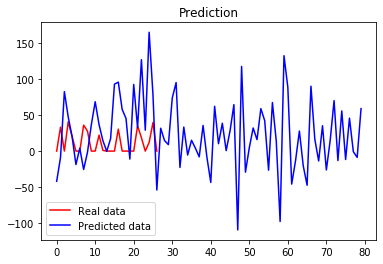

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 26125844.0000
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 4877030.0000
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 1758066.6250
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 605828.1250
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 330420.1250
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 241784.0781
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 144623.5625
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 114669.0234
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 98586.5469
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 77195.3359
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 72354.9688
Epoch 12/100
10/10 [=====================

10/10 [==============================] - 0s 1ms/step - loss: 3222.6458
Epoch 97/100
10/10 [==============================] - 0s 1ms/step - loss: 4262.9424
Epoch 98/100
10/10 [==============================] - 0s 998us/step - loss: 3912.3547
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2491.5039
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2720.2539


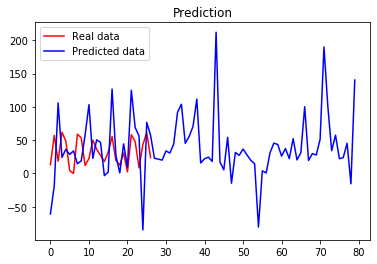

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 2837511.2500
Epoch 2/100
7/7 [==============================] - 0s 1ms/step - loss: 955496.3750
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 292029.9688
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 145595.5312
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 74845.3828
Epoch 6/100
7/7 [==============================] - 0s 2ms/step - loss: 45759.7266
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 24215.8438
Epoch 8/100
7/7 [==============================] - 0s 2ms/step - loss: 9822.1787
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 6164.9849
Epoch 10/100
7/7 [==============================] - 0s 2ms/step - loss: 3613.0488
Epoch 11/100
7/7 [==============================] - 0s 2ms/step - loss: 2590.1094
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss: 1949.6578
Epoc

7/7 [==============================] - 0s 1ms/step - loss: 1125.8704


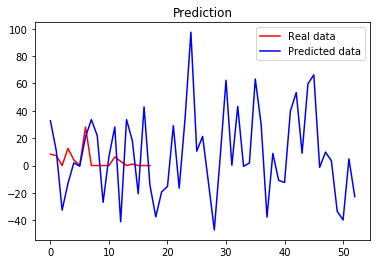

 63%|██████▎   | 62/99 [12:14<06:52, 11.15s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 2126359.2500
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 483050.3750
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 166532.1406
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 63598.8555
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 25484.6035
Epoch 6/100
10/10 [==============================] - 0s 901us/step - loss: 10617.5312
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 4246.0498
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 2124.9255
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 2450.3110
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 2217.9414
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 1945.1315
Epoch 12/100
10/10 [==============================] - 0s 1

10/10 [==============================] - 0s 1ms/step - loss: 4769.4097
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2372.8638
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1269.4266


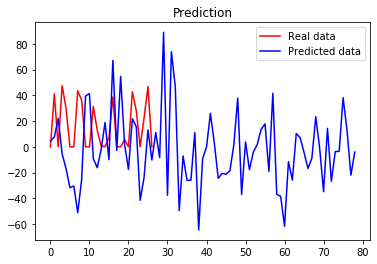

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 8362962.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 2067856.2500
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 1114282.0000
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 425429.0625
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 266921.8125
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 167725.3906
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 132812.7500
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 136126.7812
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 125476.2891
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 116930.2500
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 128911.7578
Epoch 12/100
10/10 [=====================

Epoch 97/100
10/10 [==============================] - 0s 1ms/step - loss: 8177.9092
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 6911.8657
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 6041.3301
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 5185.1021


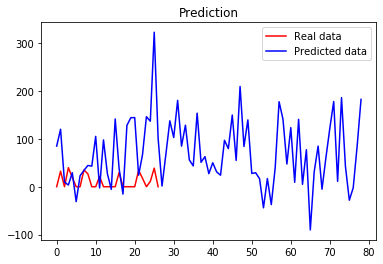

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 998us/step - loss: 1908523.5000
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 551221.3750
Epoch 3/100
10/10 [==============================] - 0s 901us/step - loss: 104692.8828
Epoch 4/100
10/10 [==============================] - 0s 898us/step - loss: 56996.7344
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 41449.3086
Epoch 6/100
10/10 [==============================] - 0s 897us/step - loss: 35381.6562
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 29636.5000
Epoch 8/100
10/10 [==============================] - 0s 993us/step - loss: 22404.0137
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 18965.8047
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 17680.4785
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 18396.1113
Epoch 12/100
10/10 [=======================

10/10 [==============================] - 0s 1ms/step - loss: 379.7680
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 557.5038
Epoch 100/100
10/10 [==============================] - 0s 998us/step - loss: 592.0039


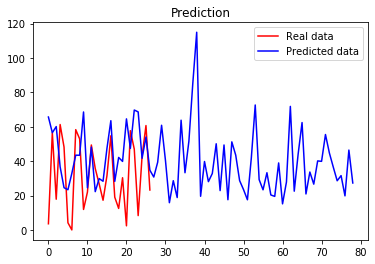

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 997us/step - loss: 9798700.0000
Epoch 2/100
7/7 [==============================] - 0s 855us/step - loss: 2503604.0000
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 1025908.4375
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 379667.5312
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 173723.0000
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 142717.8594
Epoch 7/100
7/7 [==============================] - 0s 855us/step - loss: 74274.2812
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 37693.0547
Epoch 9/100
7/7 [==============================] - 0s 855us/step - loss: 17449.2031
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 5376.7002
Epoch 11/100
7/7 [==============================] - 0s 860us/step - loss: 3238.0505
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss

Epoch 100/100
7/7 [==============================] - 0s 2ms/step - loss: 5669.5493


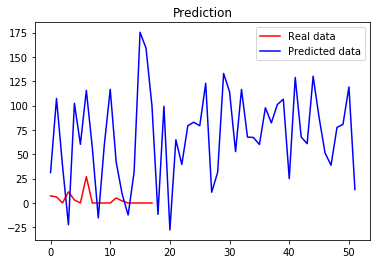

 64%|██████▎   | 63/99 [12:25<06:38, 11.06s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 3627523.2500
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 999173.6250
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 218723.0312
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 118083.0391
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 48442.4023
Epoch 6/100
10/10 [==============================] - 0s 998us/step - loss: 16111.1006
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 7482.2573
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 6408.7334
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 3909.0261
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 2649.4265
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 2524.5068
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 1ms/step - loss: 4288.1260
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 9747.5928
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2373.1167
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1697.0619


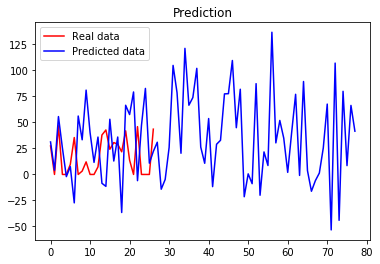

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 2225751.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 446423.6875
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 179736.6250
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 136051.5156
Epoch 5/100
10/10 [==============================] - 0s 901us/step - loss: 120325.2031
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 80354.2344
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 73322.0469
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 62158.4492
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 54064.8984
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 62554.6172
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 41886.6953
Epoch 12/100
10/10 [==============================]

Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 3020.3416
Epoch 99/100
10/10 [==============================] - 0s 997us/step - loss: 3085.3931
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1569.1656


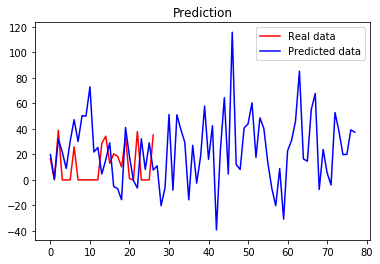

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 902us/step - loss: 5319342.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1130352.8750
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 629462.0625
Epoch 4/100
10/10 [==============================] - 0s 898us/step - loss: 248518.3281
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 157814.2031
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 97477.1797
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 102540.9844
Epoch 8/100
10/10 [==============================] - 0s 902us/step - loss: 93108.3750
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 65209.1484
Epoch 10/100
10/10 [==============================] - 0s 798us/step - loss: 55370.3086
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 58149.7188
Epoch 12/100
10/10 [=======================

10/10 [==============================] - 0s 1ms/step - loss: 2706.4778
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2433.2363
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1849.1721
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2811.9214


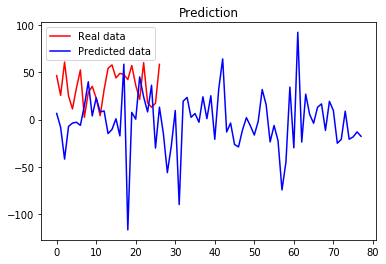

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 998us/step - loss: 3017641.5000
Epoch 2/100
7/7 [==============================] - 0s 860us/step - loss: 1028680.9375
Epoch 3/100
7/7 [==============================] - 0s 997us/step - loss: 303082.8750
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 140885.8594
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 74852.0391
Epoch 6/100
7/7 [==============================] - 0s 997us/step - loss: 46866.7617
Epoch 7/100
7/7 [==============================] - 0s 997us/step - loss: 30973.5371
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 12598.4189
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 6929.6001
Epoch 10/100
7/7 [==============================] - 0s 997us/step - loss: 5797.9878
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 6916.2021
Epoch 12/100
7/7 [==============================] - 0s 855us/step - loss

7/7 [==============================] - 0s 1ms/step - loss: 2743.9480


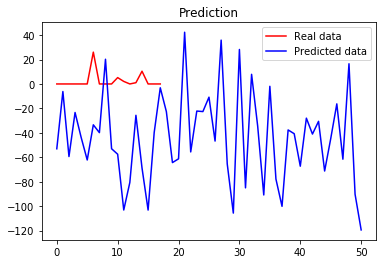

 65%|██████▍   | 64/99 [12:36<06:26, 11.05s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 3782574.7500
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 902400.1875
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 189316.8125
Epoch 4/100
10/10 [==============================] - 0s 902us/step - loss: 104812.5000
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 30593.2441
Epoch 6/100
10/10 [==============================] - 0s 898us/step - loss: 10692.1816
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 5700.1074
Epoch 8/100
10/10 [==============================] - 0s 997us/step - loss: 3927.3669
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 2195.9861
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 2129.4348
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 1519.7542
Epoch 12/100
10/10 [==============================]

10/10 [==============================] - 0s 1ms/step - loss: 961.6980
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 1030.3060
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1040.1978
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2225.1797


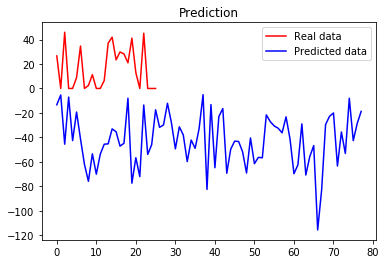

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 4006777.5000
Epoch 2/100
10/10 [==============================] - 0s 997us/step - loss: 1111066.6250
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 438127.0625
Epoch 4/100
10/10 [==============================] - 0s 802us/step - loss: 227273.3281
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 74403.5625
Epoch 6/100
10/10 [==============================] - 0s 897us/step - loss: 42937.3633
Epoch 7/100
10/10 [==============================] - 0s 901us/step - loss: 25050.2441
Epoch 8/100
10/10 [==============================] - 0s 898us/step - loss: 18159.2344
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 17379.2715
Epoch 10/100
10/10 [==============================] - 0s 998us/step - loss: 16731.8652
Epoch 11/100
10/10 [==============================] - 0s 993us/step - loss: 18356.5723
Epoch 12/100
10/10 [===================

10/10 [==============================] - 0s 2ms/step - loss: 540.1697
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 561.4145
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 624.4042
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 737.3746


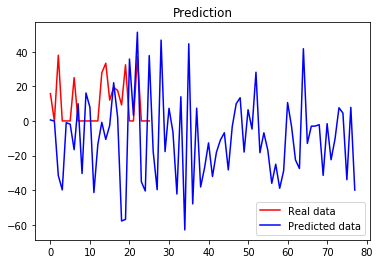

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 3994184.2500
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1056363.5000
Epoch 3/100
10/10 [==============================] - 0s 902us/step - loss: 406336.6875
Epoch 4/100
10/10 [==============================] - 0s 798us/step - loss: 200259.7969
Epoch 5/100
10/10 [==============================] - 0s 902us/step - loss: 147527.0156
Epoch 6/100
10/10 [==============================] - 0s 898us/step - loss: 113053.1172
Epoch 7/100
10/10 [==============================] - 0s 898us/step - loss: 95875.4453
Epoch 8/100
10/10 [==============================] - 0s 902us/step - loss: 88051.7734
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 86122.6250
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 61346.9023
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 61964.7227
Epoch 12/100
10/10 [=====================

10/10 [==============================] - 0s 1ms/step - loss: 1658.7839
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2026.8387
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1770.4135
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 3134.8574


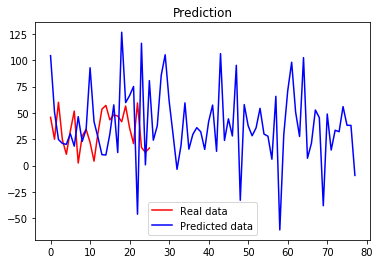

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 7338077.5000
Epoch 2/100
7/7 [==============================] - 0s 997us/step - loss: 2388130.7500
Epoch 3/100
7/7 [==============================] - 0s 997us/step - loss: 1266369.5000
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 607950.3125
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 289244.8750
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 139312.6250
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 64917.0625
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 28876.8867
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 17923.1406
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 13809.6221
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 10158.8779
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss: 93

7/7 [==============================] - 0s 1ms/step - loss: 4382.6748


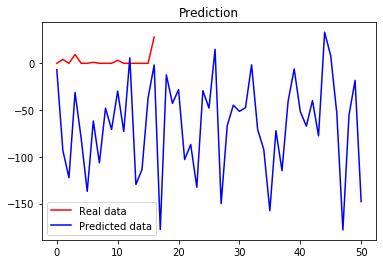

 66%|██████▌   | 65/99 [12:48<06:19, 11.16s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 22182830.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 4477430.5000
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 1510308.1250
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 486485.1562
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 147039.2812
Epoch 6/100
10/10 [==============================] - 0s 898us/step - loss: 48161.6953
Epoch 7/100
10/10 [==============================] - 0s 899us/step - loss: 19487.6680
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 7595.3604
Epoch 9/100
10/10 [==============================] - 0s 997us/step - loss: 4557.5381
Epoch 10/100
10/10 [==============================] - 0s 997us/step - loss: 2793.6401
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 1513.6836
Epoch 12/100
10/10 [==========================

10/10 [==============================] - 0s 1ms/step - loss: 976.6855
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 1034.3523
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1129.3782
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1230.0807


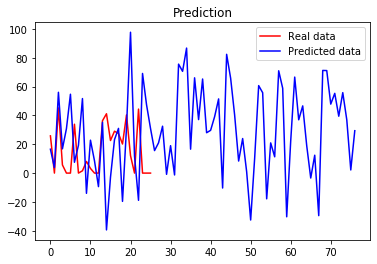

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 7193199.5000
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 1416301.2500
Epoch 3/100
10/10 [==============================] - 0s 901us/step - loss: 677576.1250
Epoch 4/100
10/10 [==============================] - 0s 898us/step - loss: 240215.6094
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 132047.2344
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 188151.6406
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 83797.7812
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 63145.2227
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 63054.5703
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 58808.5391
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 54460.8711
Epoch 12/100
10/10 [=========================

10/10 [==============================] - 0s 1ms/step - loss: 3116.1074
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 5950.4155
Epoch 99/100
10/10 [==============================] - 0s 2ms/step - loss: 10580.7549
Epoch 100/100
10/10 [==============================] - 0s 2ms/step - loss: 5322.3306


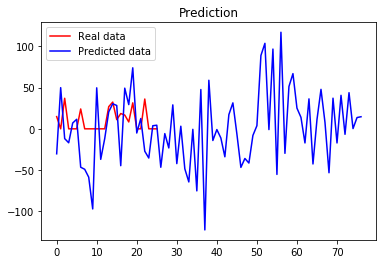

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 28236458.0000
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 3491486.2500
Epoch 3/100
10/10 [==============================] - 0s 901us/step - loss: 1200582.6250
Epoch 4/100
10/10 [==============================] - 0s 897us/step - loss: 612785.8750
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 289542.2188
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 165502.2500
Epoch 7/100
10/10 [==============================] - 0s 997us/step - loss: 82044.9375
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 66042.4453
Epoch 9/100
10/10 [==============================] - 0s 1000us/step - loss: 57468.0000
Epoch 10/100
10/10 [==============================] - 0s 898us/step - loss: 52863.6953
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 51009.4297
Epoch 12/100
10/10 [================

10/10 [==============================] - 0s 1ms/step - loss: 2260.7710
Epoch 98/100
10/10 [==============================] - 0s 997us/step - loss: 2083.3179
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2135.6213
Epoch 100/100
10/10 [==============================] - 0s 997us/step - loss: 2049.0417


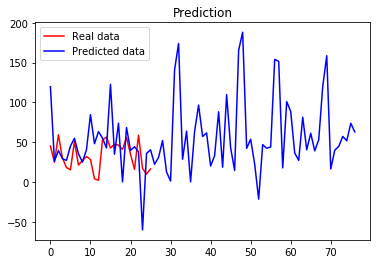

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 3021590.7500
Epoch 2/100
7/7 [==============================] - 0s 1ms/step - loss: 841997.4375
Epoch 3/100
7/7 [==============================] - 0s 997us/step - loss: 370429.7500
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 221655.5469
Epoch 5/100
7/7 [==============================] - 0s 997us/step - loss: 103896.5625
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 37438.8516
Epoch 7/100
7/7 [==============================] - 0s 2ms/step - loss: 29830.8379
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 12846.0723
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 8378.3779
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 5469.9170
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 4844.5073
Epoch 12/100
7/7 [==============================] - 0s 2ms/step - loss: 5009.518

7/7 [==============================] - 0s 1ms/step - loss: 1042.4167


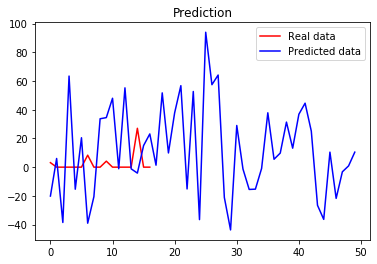

 67%|██████▋   | 66/99 [12:59<06:11, 11.26s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 2309362.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 528366.1250
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 202545.6875
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 58611.5977
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 17185.7070
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 6180.8218
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 2566.7476
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 1495.6218
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 1991.5084
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 1673.4379
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 1050.2010
Epoch 12/100
10/10 [==============================] - 0s 1ms/step -

10/10 [==============================] - 0s 1ms/step - loss: 813.2988
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 920.3627
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1298.3202


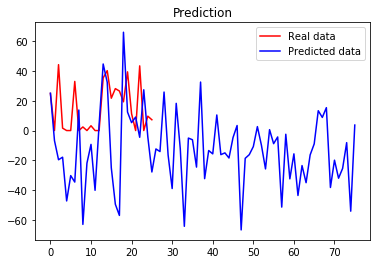

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 3264163.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1012624.4375
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 334716.2812
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 149581.8125
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 95950.8281
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 82703.6406
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 63989.5078
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 57947.2227
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 63011.7891
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 55876.3359
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 64965.3438
Epoch 12/100
10/10 [==============================] - 0s 

10/10 [==============================] - 0s 1ms/step - loss: 3671.3384
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 5537.1973
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2770.1877
Epoch 100/100
10/10 [==============================] - 0s 997us/step - loss: 4312.3457


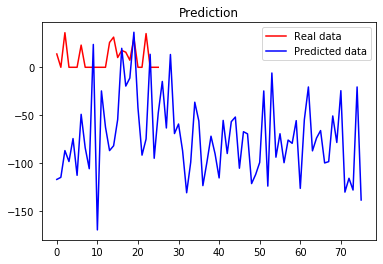

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 4080390.7500
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 883412.8125
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 575819.5000
Epoch 4/100
10/10 [==============================] - 0s 2ms/step - loss: 285679.5938
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 170327.7500
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 92760.8828
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 70616.0469
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 59322.2617
Epoch 9/100
10/10 [==============================] - 0s 2ms/step - loss: 55372.1523
Epoch 10/100
10/10 [==============================] - 0s 2ms/step - loss: 66238.1797
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 56604.7188
Epoch 12/100
10/10 [==============================] - 0s 1m

Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 1624.4603
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1175.9025
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1245.1504


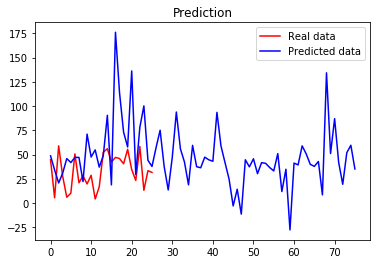

(132, 4)
Epoch 1/100
7/7 [==============================] - 0s 849us/step - loss: 33444964.0000
Epoch 2/100
7/7 [==============================] - 0s 855us/step - loss: 5388048.0000
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 4552333.5000
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 1976003.6250
Epoch 5/100
7/7 [==============================] - 0s 998us/step - loss: 317095.5625
Epoch 6/100
7/7 [==============================] - 0s 997us/step - loss: 575953.9375
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 177336.4531
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 67303.7891
Epoch 9/100
7/7 [==============================] - 0s 998us/step - loss: 84998.7734
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 32753.4414
Epoch 11/100
7/7 [==============================] - 0s 997us/step - loss: 19702.4902
Epoch 12/100
7/7 [==============================] - 0s 1ms/step

7/7 [==============================] - 0s 1ms/step - loss: 7622.4419


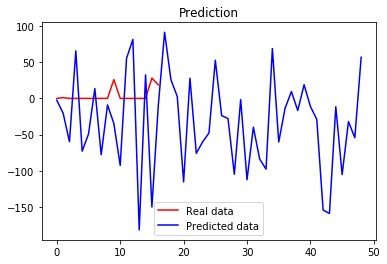

 68%|██████▊   | 67/99 [13:10<05:59, 11.24s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 899us/step - loss: 7740266.0000
Epoch 2/100
10/10 [==============================] - 0s 898us/step - loss: 1583612.7500
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 752572.9375
Epoch 4/100
10/10 [==============================] - 0s 898us/step - loss: 279663.6875
Epoch 5/100
10/10 [==============================] - 0s 902us/step - loss: 106860.8438
Epoch 6/100
10/10 [==============================] - 0s 997us/step - loss: 41795.5859
Epoch 7/100
10/10 [==============================] - 0s 898us/step - loss: 21785.8691
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 7791.9541
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 7121.6382
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 6562.6982
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 5311.8076
Epoch 12/100
10/10 [==============================

Epoch 98/100
10/10 [==============================] - 0s 2ms/step - loss: 16373.8867
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 5926.1104
Epoch 100/100
10/10 [==============================] - 0s 2ms/step - loss: 8198.1768


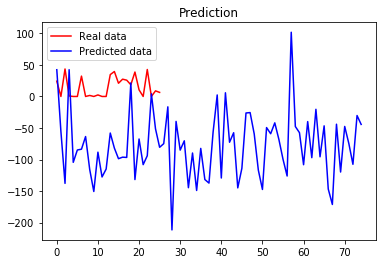

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 3050058.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 660029.2500
Epoch 3/100
10/10 [==============================] - 0s 997us/step - loss: 196240.8750
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 155558.5000
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 99303.3672
Epoch 6/100
10/10 [==============================] - 0s 998us/step - loss: 70123.0625
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 82037.8750
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 77662.0000
Epoch 9/100
10/10 [==============================] - 0s 998us/step - loss: 109967.6562
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 61487.4453
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 76222.7656
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 1ms/step - loss: 3031.0195
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2555.5938
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 3064.6978
Epoch 100/100
10/10 [==============================] - 0s 2ms/step - loss: 2760.9817


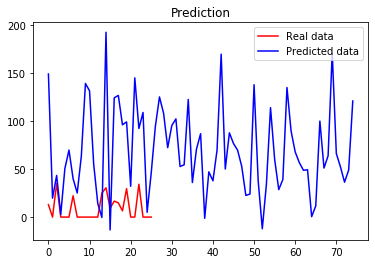

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 5440050.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1406269.7500
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 582165.6250
Epoch 4/100
10/10 [==============================] - 0s 2ms/step - loss: 312483.7812
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 140357.2500
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 134921.2031
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 112925.0703
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 124564.4297
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 94956.7969
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 83930.3906
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 75196.9062
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 1ms/step - loss: 4124.9468
Epoch 97/100
10/10 [==============================] - 0s 1ms/step - loss: 6236.4546
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 6037.4897
Epoch 99/100
10/10 [==============================] - ETA: 0s - loss: 7051.41 - 0s 1ms/step - loss: 4234.1353
Epoch 100/100
10/10 [==============================] - 0s 2ms/step - loss: 2595.9751


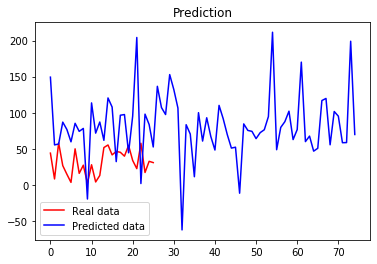

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 997us/step - loss: 3181222.2500
Epoch 2/100
6/6 [==============================] - 0s 831us/step - loss: 1079128.3750
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 428214.8438
Epoch 4/100
6/6 [==============================] - 0s 831us/step - loss: 199041.7969
Epoch 5/100
6/6 [==============================] - 0s 997us/step - loss: 113174.7109
Epoch 6/100
6/6 [==============================] - 0s 831us/step - loss: 65107.8398
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 39387.5469
Epoch 8/100
6/6 [==============================] - 0s 831us/step - loss: 21537.4668
Epoch 9/100
6/6 [==============================] - 0s 831us/step - loss: 14019.4336
Epoch 10/100
6/6 [==============================] - 0s 997us/step - loss: 5928.6406
Epoch 11/100
6/6 [==============================] - 0s 997us/step - loss: 6401.2441
Epoch 12/100
6/6 [==============================] - 0s 838us/ste

6/6 [==============================] - 0s 1ms/step - loss: 4948.4268
Epoch 100/100
6/6 [==============================] - 0s 1ms/step - loss: 5064.0879


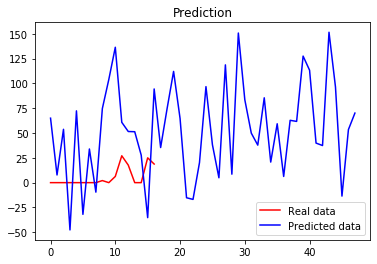

 69%|██████▊   | 68/99 [13:22<05:47, 11.21s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 13229274.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 2949403.0000
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 975424.1250
Epoch 4/100
10/10 [==============================] - 0s 997us/step - loss: 495637.2188
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 152852.0781
Epoch 6/100
10/10 [==============================] - 0s 998us/step - loss: 61937.9453
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 31574.6172
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 13216.0029
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 7358.6484
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 5641.5874
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 7188.4492
Epoch 12/100
10/10 [==============================] - 0s

Epoch 98/100
10/10 [==============================] - 0s 2ms/step - loss: 3660.2458
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 2960.8105
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2739.9641


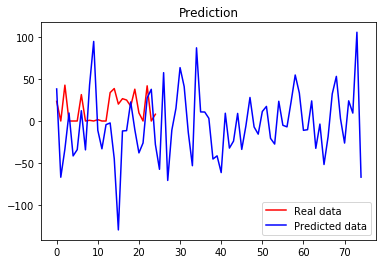

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 7553351.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1703064.3750
Epoch 3/100
10/10 [==============================] - 0s 798us/step - loss: 987377.9375
Epoch 4/100
10/10 [==============================] - 0s 802us/step - loss: 338849.7500
Epoch 5/100
10/10 [==============================] - 0s 898us/step - loss: 204893.6719
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 133980.5156
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 96301.9219
Epoch 8/100
10/10 [==============================] - 0s 997us/step - loss: 87237.7500
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 102991.8828
Epoch 10/100
10/10 [==============================] - 0s 901us/step - loss: 80362.3828
Epoch 11/100
10/10 [==============================] - 0s 997us/step - loss: 69425.7031
Epoch 12/100
10/10 [======================

10/10 [==============================] - 0s 1ms/step - loss: 2384.0137
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2901.7224
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 10319.2852
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 17269.5801


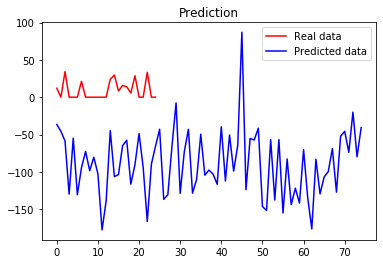

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 997us/step - loss: 5849369.5000
Epoch 2/100
10/10 [==============================] - 0s 902us/step - loss: 1628015.7500
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 580067.0000
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 465276.7500
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 200515.3906
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 134800.5625
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 84282.6172
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 47411.1172
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 41021.5273
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 31853.7441
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 28710.8828
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 1ms/step - loss: 2718.6292
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2199.0703
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1894.9236
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2681.0972


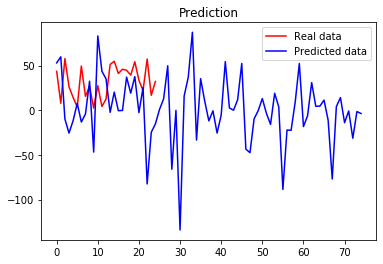

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 2206545.0000
Epoch 2/100
6/6 [==============================] - 0s 997us/step - loss: 616833.6250
Epoch 3/100
6/6 [==============================] - 0s 997us/step - loss: 298898.5000
Epoch 4/100
6/6 [==============================] - 0s 1ms/step - loss: 183951.0625
Epoch 5/100
6/6 [==============================] - 0s 1ms/step - loss: 97223.7734
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 48665.0664
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 31843.6816
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 13914.3086
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 6848.4067
Epoch 10/100
6/6 [==============================] - 0s 1ms/step - loss: 4921.9507
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 5670.9868
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - loss: 3920.5027

6/6 [==============================] - 0s 1ms/step - loss: 1186.1782


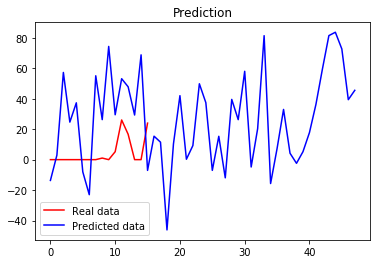

 70%|██████▉   | 69/99 [13:33<05:39, 11.32s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 2ms/step - loss: 1734502.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 372405.5312
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 87094.1172
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 50044.4922
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 10214.9531
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 5343.5483
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 3319.6799
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 1214.1981
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 1239.7129
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 932.4090
Epoch 11/100
10/10 [==============================] - 0s 3ms/step - loss: 1045.4399
Epoch 12/100
10/10 [==============================] - 0s 2ms/step - l

10/10 [==============================] - 0s 2ms/step - loss: 347.4419
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 753.4846


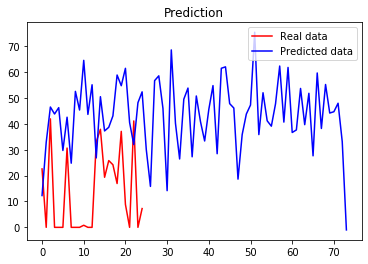

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 898us/step - loss: 9900867.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 2124711.2500
Epoch 3/100
10/10 [==============================] - 0s 898us/step - loss: 582392.5625
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 233155.8438
Epoch 5/100
10/10 [==============================] - 0s 997us/step - loss: 87250.9453
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 59020.9141
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 36854.5625
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 34892.1328
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 33528.0273
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 36509.1133
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 54725.7031
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 1ms/step - loss: 3903.2534
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 5216.4712
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 6267.2993
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 8175.4932


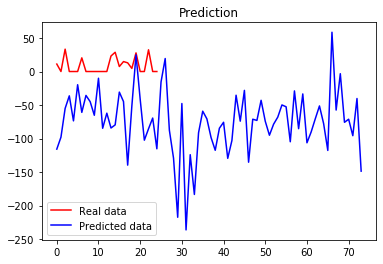

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 2544938.5000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 671404.1875
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 402663.2188
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 253787.1094
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 121716.6250
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 105937.3984
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 151120.6562
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 120696.8516
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 110341.1172
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 138012.1094
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 86624.3281
Epoch 12/100
10/10 [==============================] - 

10/10 [==============================] - 0s 1ms/step - loss: 2954.3650
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2076.9106
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 1533.3879
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 1780.6484


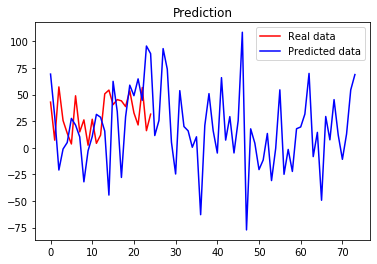

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 997us/step - loss: 2148222.7500
Epoch 2/100
6/6 [==============================] - 0s 1ms/step - loss: 632142.3750
Epoch 3/100
6/6 [==============================] - 0s 998us/step - loss: 257776.3906
Epoch 4/100
6/6 [==============================] - 0s 998us/step - loss: 128715.2656
Epoch 5/100
6/6 [==============================] - 0s 998us/step - loss: 66882.4844
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 35594.2500
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 23428.0488
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 16875.1504
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 11717.6992
Epoch 10/100
6/6 [==============================] - 0s 997us/step - loss: 8373.4521
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 3440.5811
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - loss: 10

6/6 [==============================] - 0s 1ms/step - loss: 1478.5325


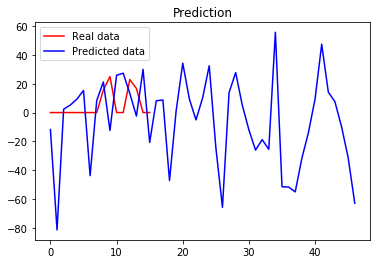

 71%|███████   | 70/99 [13:45<05:33, 11.48s/it]

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 2ms/step - loss: 18134378.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 4399625.0000
Epoch 3/100
10/10 [==============================] - 0s 2ms/step - loss: 1170692.6250
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 655883.4375
Epoch 5/100
10/10 [==============================] - 0s 2ms/step - loss: 172315.2812
Epoch 6/100
10/10 [==============================] - 0s 3ms/step - loss: 74314.9141
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 22799.1465
Epoch 8/100
10/10 [==============================] - 0s 2ms/step - loss: 7179.8472
Epoch 9/100
10/10 [==============================] - 0s 2ms/step - loss: 4087.6892
Epoch 10/100
10/10 [==============================] - 0s 2ms/step - loss: 3206.5964
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 2781.4629
Epoch 12/100
10/10 [==============================] - 0s 1ms

10/10 [==============================] - 0s 2ms/step - loss: 2544.2339
Epoch 99/100
10/10 [==============================] - 0s 2ms/step - loss: 4502.6963
Epoch 100/100
10/10 [==============================] - 0s 2ms/step - loss: 5809.3730


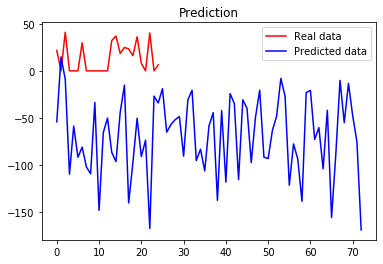

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 8533114.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1356497.3750
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 269548.5625
Epoch 4/100
10/10 [==============================] - 0s 2ms/step - loss: 131628.2344
Epoch 5/100
10/10 [==============================] - 0s 2ms/step - loss: 108869.3828
Epoch 6/100
10/10 [==============================] - 0s 1ms/step - loss: 81676.2656
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 135360.2031
Epoch 8/100
10/10 [==============================] - 0s 2ms/step - loss: 99859.7188
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 90433.2969
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 69082.2422
Epoch 11/100
10/10 [==============================] - 0s 2ms/step - loss: 80209.1953
Epoch 12/100
10/10 [==============================] - 0s 

10/10 [==============================] - 0s 1ms/step - loss: 14576.8662
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 7943.2520
Epoch 99/100
10/10 [==============================] - 0s 2ms/step - loss: 5440.1108
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2593.9438


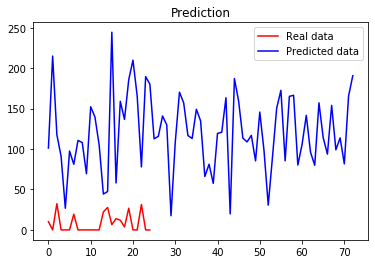

(168, 4)
Epoch 1/100
10/10 [==============================] - 0s 1ms/step - loss: 6680362.0000
Epoch 2/100
10/10 [==============================] - 0s 1ms/step - loss: 1265395.3750
Epoch 3/100
10/10 [==============================] - 0s 1ms/step - loss: 1085217.7500
Epoch 4/100
10/10 [==============================] - 0s 1ms/step - loss: 467858.1875
Epoch 5/100
10/10 [==============================] - 0s 1ms/step - loss: 299694.5625
Epoch 6/100
10/10 [==============================] - 0s 2ms/step - loss: 208574.3438
Epoch 7/100
10/10 [==============================] - 0s 1ms/step - loss: 171378.2188
Epoch 8/100
10/10 [==============================] - 0s 1ms/step - loss: 131021.3125
Epoch 9/100
10/10 [==============================] - 0s 1ms/step - loss: 105179.4688
Epoch 10/100
10/10 [==============================] - 0s 1ms/step - loss: 96760.1406
Epoch 11/100
10/10 [==============================] - 0s 1ms/step - loss: 84353.6016
Epoch 12/100
10/10 [==============================] -

10/10 [==============================] - 0s 2ms/step - loss: 4348.7505
Epoch 98/100
10/10 [==============================] - 0s 1ms/step - loss: 2327.6060
Epoch 99/100
10/10 [==============================] - 0s 1ms/step - loss: 3161.6750
Epoch 100/100
10/10 [==============================] - 0s 1ms/step - loss: 2410.7817


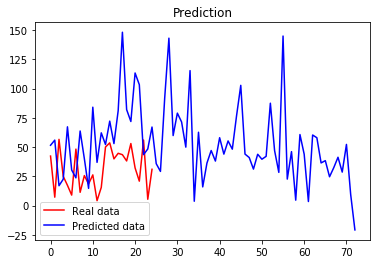

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 10674460.0000
Epoch 2/100
6/6 [==============================] - 0s 1ms/step - loss: 2106998.0000
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 885750.9375
Epoch 4/100
6/6 [==============================] - 0s 1ms/step - loss: 869791.5625
Epoch 5/100
6/6 [==============================] - 0s 1ms/step - loss: 390694.7500
Epoch 6/100
6/6 [==============================] - 0s 2ms/step - loss: 116050.6406
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 135486.9844
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 71046.6953
Epoch 9/100
6/6 [==============================] - 0s 2ms/step - loss: 20501.6680
Epoch 10/100
6/6 [==============================] - 0s 1ms/step - loss: 22913.2305
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 13659.5107
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - loss: 4848.

6/6 [==============================] - 0s 997us/step - loss: 1373.9656


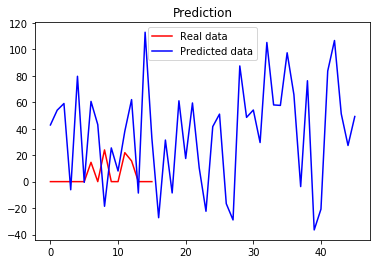

 72%|███████▏  | 71/99 [13:58<05:33, 11.90s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 8201814.0000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 2214691.5000
Epoch 3/100
9/9 [==============================] - 0s 887us/step - loss: 581521.2500
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 249265.2812
Epoch 5/100
9/9 [==============================] - 0s 887us/step - loss: 119402.7500
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 43930.0898
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 17018.2734
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 6098.0298
Epoch 9/100
9/9 [==============================] - 0s 889us/step - loss: 4817.4824
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 2825.8604
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 2430.4150
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss: 

9/9 [==============================] - 0s 1ms/step - loss: 1552.1852


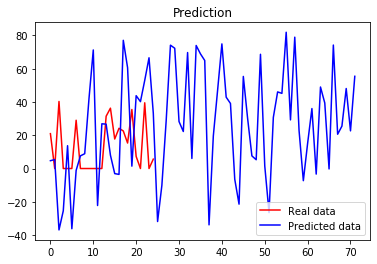

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 886us/step - loss: 3683377.0000
Epoch 2/100
9/9 [==============================] - 0s 776us/step - loss: 971229.5625
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 347649.7812
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 168238.3125
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 86822.6562
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 60948.9531
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 45563.1289
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 43299.5703
Epoch 9/100
9/9 [==============================] - 0s 887us/step - loss: 45254.7969
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 46277.7461
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 34505.4805
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 

9/9 [==============================] - 0s 1ms/step - loss: 2061.6755
Epoch 99/100
9/9 [==============================] - 0s 997us/step - loss: 3664.0374
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 3810.2869


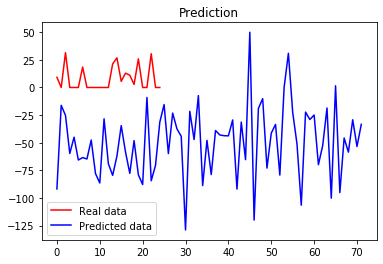

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 10188518.0000
Epoch 2/100
9/9 [==============================] - 0s 890us/step - loss: 3081969.2500
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 1174591.7500
Epoch 4/100
9/9 [==============================] - 0s 891us/step - loss: 578931.9375
Epoch 5/100
9/9 [==============================] - 0s 890us/step - loss: 288397.1875
Epoch 6/100
9/9 [==============================] - 0s 886us/step - loss: 210796.3594
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 144936.9375
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 131723.5625
Epoch 9/100
9/9 [==============================] - 0s 891us/step - loss: 120833.5938
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 120467.9297
Epoch 11/100
9/9 [==============================] - 0s 891us/step - loss: 147341.3750
Epoch 12/100
9/9 [==============================] - 0s 1

9/9 [==============================] - 0s 1ms/step - loss: 3350.1887
Epoch 100/100
9/9 [==============================] - 0s 2ms/step - loss: 3207.3848


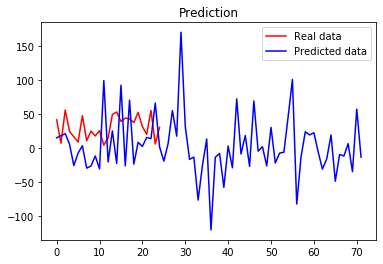

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 32645910.0000
Epoch 2/100
6/6 [==============================] - 0s 838us/step - loss: 5649273.0000
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 5391803.5000
Epoch 4/100
6/6 [==============================] - 0s 998us/step - loss: 1968514.0000
Epoch 5/100
6/6 [==============================] - 0s 1ms/step - loss: 760851.3750
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 840676.6875
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 129807.2422
Epoch 8/100
6/6 [==============================] - 0s 3ms/step - loss: 221891.1562
Epoch 9/100
6/6 [==============================] - 0s 997us/step - loss: 77975.7578
Epoch 10/100
6/6 [==============================] - 0s 1ms/step - loss: 32492.6172
Epoch 11/100
6/6 [==============================] - 0s 997us/step - loss: 41404.0625
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - 

6/6 [==============================] - 0s 1ms/step - loss: 2553.6489


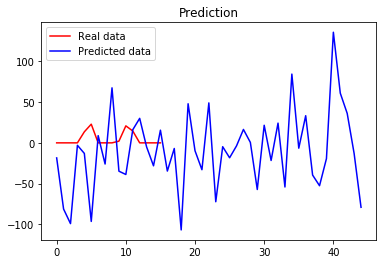

 73%|███████▎  | 72/99 [14:08<05:08, 11.43s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 886us/step - loss: 22305032.0000
Epoch 2/100
9/9 [==============================] - 0s 886us/step - loss: 4806738.5000
Epoch 3/100
9/9 [==============================] - 0s 886us/step - loss: 1806512.0000
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 679921.7500
Epoch 5/100
9/9 [==============================] - 0s 891us/step - loss: 260603.3906
Epoch 6/100
9/9 [==============================] - 0s 997us/step - loss: 98641.7031
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 44458.2461
Epoch 8/100
9/9 [==============================] - 0s 886us/step - loss: 16989.0254
Epoch 9/100
9/9 [==============================] - 0s 886us/step - loss: 6941.6240
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 3649.4531
Epoch 11/100
9/9 [==============================] - 0s 891us/step - loss: 2746.0366
Epoch 12/100
9/9 [==============================] - 0s 1ms/st

9/9 [==============================] - 0s 1ms/step - loss: 1833.8151


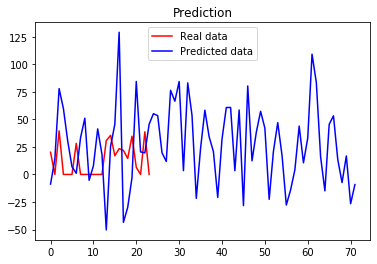

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 3751396.5000
Epoch 2/100
9/9 [==============================] - 0s 993us/step - loss: 1230997.1250
Epoch 3/100
9/9 [==============================] - 0s 886us/step - loss: 331698.7812
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 190734.2812
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 110636.4141
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 57770.0508
Epoch 7/100
9/9 [==============================] - 0s 886us/step - loss: 52395.3945
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 34510.7031
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 33293.4375
Epoch 10/100
9/9 [==============================] - 0s 886us/step - loss: 28667.7168
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 26563.9805
Epoch 12/100
9/9 [==============================] - 0s 886us/step - 

Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 1433.5382


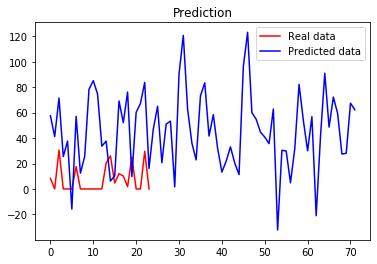

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 3224183.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 1165876.7500
Epoch 3/100
9/9 [==============================] - 0s 886us/step - loss: 195406.6406
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 189259.1562
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 155183.2344
Epoch 6/100
9/9 [==============================] - 0s 886us/step - loss: 130855.9844
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 94225.5938
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 70439.6406
Epoch 9/100
9/9 [==============================] - 0s 887us/step - loss: 52821.4570
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 41090.9375
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 35064.4219
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - l

9/9 [==============================] - 0s 2ms/step - loss: 2546.2568
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2282.1658


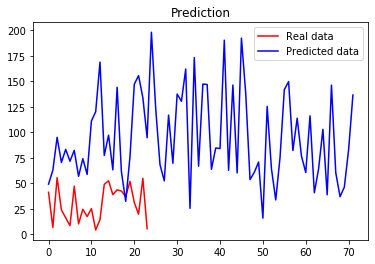

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 997us/step - loss: 9452848.0000
Epoch 2/100
6/6 [==============================] - 0s 831us/step - loss: 2787116.7500
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 1120687.5000
Epoch 4/100
6/6 [==============================] - 0s 997us/step - loss: 417860.6250
Epoch 5/100
6/6 [==============================] - 0s 1ms/step - loss: 287862.9375
Epoch 6/100
6/6 [==============================] - 0s 997us/step - loss: 223167.5938
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 119229.5469
Epoch 8/100
6/6 [==============================] - 0s 997us/step - loss: 49574.3984
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 30042.0605
Epoch 10/100
6/6 [==============================] - 0s 831us/step - loss: 17725.2090
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 12049.4570
Epoch 12/100
6/6 [==============================] - 0s 831us/step

6/6 [==============================] - 0s 2ms/step - loss: 2694.6199


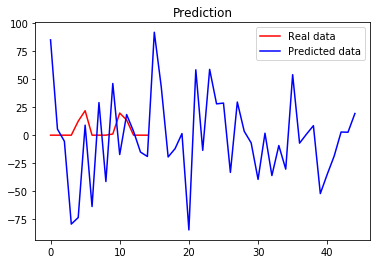

 74%|███████▎  | 73/99 [14:18<04:47, 11.07s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 5715055.0000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 963732.9375
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 550098.2500
Epoch 4/100
9/9 [==============================] - 0s 998us/step - loss: 144956.0469
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 68719.0781
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 27499.7129
Epoch 7/100
9/9 [==============================] - 0s 998us/step - loss: 10292.0264
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 3564.1853
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 1754.4620
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 1324.8387
Epoch 11/100
9/9 [==============================] - 0s 890us/step - loss: 1182.3633
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss

9/9 [==============================] - 0s 1ms/step - loss: 3716.3015


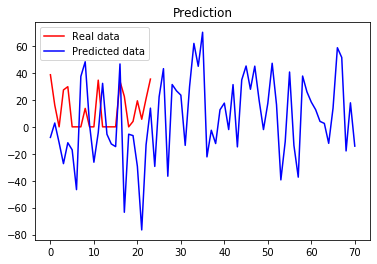

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 15476617.0000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 3799242.7500
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 1396846.7500
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 608919.2500
Epoch 5/100
9/9 [==============================] - 0s 891us/step - loss: 263879.2188
Epoch 6/100
9/9 [==============================] - 0s 891us/step - loss: 165851.8125
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 108220.0234
Epoch 8/100
9/9 [==============================] - 0s 886us/step - loss: 68301.4844
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 58997.9219
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 60702.0508
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 54168.7695
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - 

9/9 [==============================] - 0s 1ms/step - loss: 2179.4417
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2094.2512


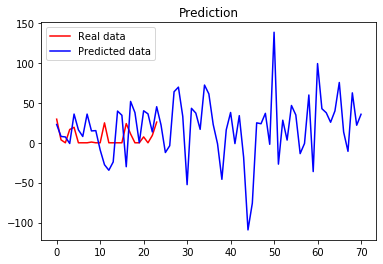

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 6935943.0000
Epoch 2/100
9/9 [==============================] - 0s 889us/step - loss: 1603583.5000
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 552311.2500
Epoch 4/100
9/9 [==============================] - 0s 887us/step - loss: 365601.8438
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 183251.8594
Epoch 6/100
9/9 [==============================] - 0s 886us/step - loss: 121515.5469
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 88347.5312
Epoch 8/100
9/9 [==============================] - 0s 887us/step - loss: 52308.2305
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 55379.0195
Epoch 10/100
9/9 [==============================] - 0s 776us/step - loss: 40542.9609
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 39316.6641
Epoch 12/100
9/9 [==============================] - 0s 886us/step -

9/9 [==============================] - 0s 1ms/step - loss: 5576.4893
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 5235.2441


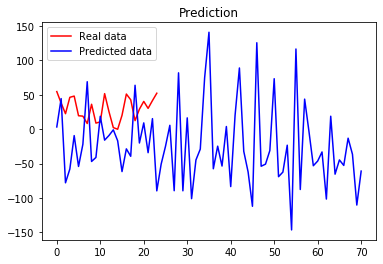

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 20934816.0000
Epoch 2/100
6/6 [==============================] - 0s 997us/step - loss: 4304806.5000
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 1624957.2500
Epoch 4/100
6/6 [==============================] - 0s 1ms/step - loss: 1895728.5000
Epoch 5/100
6/6 [==============================] - 0s 997us/step - loss: 883735.0625
Epoch 6/100
6/6 [==============================] - 0s 997us/step - loss: 191821.4531
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 319949.8125
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 143932.5469
Epoch 9/100
6/6 [==============================] - 0s 997us/step - loss: 36465.6211
Epoch 10/100
6/6 [==============================] - 0s 1ms/step - loss: 41542.5977
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 31199.4766
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - 

6/6 [==============================] - 0s 1ms/step - loss: 3226.0706


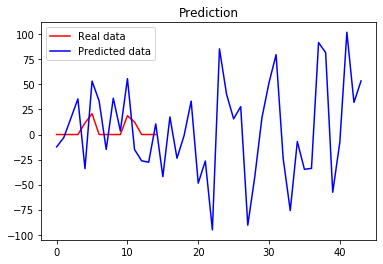

 75%|███████▍  | 74/99 [14:29<04:32, 10.88s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 2663896.5000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 469067.5000
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 273085.4688
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 73205.0156
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 48191.6016
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 11445.1279
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 5349.5742
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 1906.1000
Epoch 9/100
9/9 [==============================] - 0s 886us/step - loss: 861.6295
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 724.8959
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 657.2462
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss: 670.285

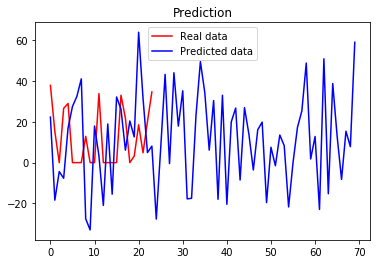

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 887us/step - loss: 11270959.0000
Epoch 2/100
9/9 [==============================] - 0s 887us/step - loss: 3433189.5000
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 1436493.6250
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 480611.8750
Epoch 5/100
9/9 [==============================] - 0s 887us/step - loss: 250036.5781
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 251692.2031
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 154334.9531
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 131344.8438
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 151870.9531
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 110039.4141
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 97849.6484
Epoch 12/100
9/9 [==============================] - 0s 997us/

9/9 [==============================] - 0s 2ms/step - loss: 1776.6465
Epoch 100/100
9/9 [==============================] - 0s 2ms/step - loss: 2160.2144


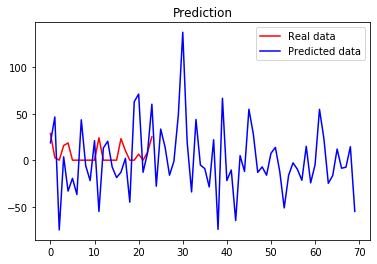

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 6381910.5000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 1503864.5000
Epoch 3/100
9/9 [==============================] - 0s 882us/step - loss: 573653.5625
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 512054.2188
Epoch 5/100
9/9 [==============================] - 0s 998us/step - loss: 370976.3125
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 203114.2344
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 177589.6875
Epoch 8/100
9/9 [==============================] - 0s 886us/step - loss: 208360.7969
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 154292.1406
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 138692.2969
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 111859.4922
Epoch 12/100
9/9 [==============================] - 0s 1ms/step 

9/9 [==============================] - 0s 1ms/step - loss: 3193.9807
Epoch 100/100
9/9 [==============================] - 0s 2ms/step - loss: 4811.4663


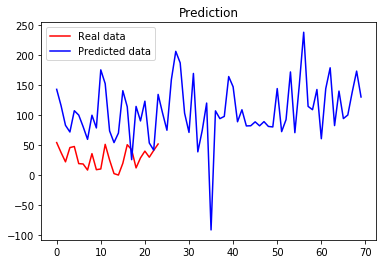

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 3324980.0000
Epoch 2/100
6/6 [==============================] - 0s 1ms/step - loss: 913871.7500
Epoch 3/100
6/6 [==============================] - 0s 1ms/step - loss: 361558.3750
Epoch 4/100
6/6 [==============================] - 0s 1ms/step - loss: 201135.4375
Epoch 5/100
6/6 [==============================] - 0s 2ms/step - loss: 130173.3984
Epoch 6/100
6/6 [==============================] - 0s 2ms/step - loss: 73396.6172
Epoch 7/100
6/6 [==============================] - 0s 2ms/step - loss: 48527.2109
Epoch 8/100
6/6 [==============================] - 0s 2ms/step - loss: 31928.7969
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 15798.5332
Epoch 10/100
6/6 [==============================] - 0s 2ms/step - loss: 7429.7603
Epoch 11/100
6/6 [==============================] - 0s 2ms/step - loss: 5095.9741
Epoch 12/100
6/6 [==============================] - 0s 2ms/step - loss: 4128.8169
E

6/6 [==============================] - 0s 2ms/step - loss: 4588.0200


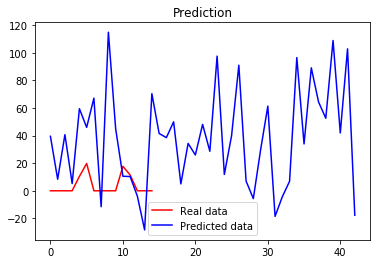

 76%|███████▌  | 75/99 [14:40<04:22, 10.95s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 23477486.0000
Epoch 2/100
9/9 [==============================] - 0s 890us/step - loss: 5245388.5000
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 2147122.7500
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 894044.8125
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 365563.5312
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 167799.5000
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 65570.7188
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 34608.3047
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 16912.2754
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 7013.9692
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 3902.3247
Epoch 12/100
9/9 [==============================] - 0s 1ms/step

9/9 [==============================] - 0s 1ms/step - loss: 2250.5557
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2109.9077


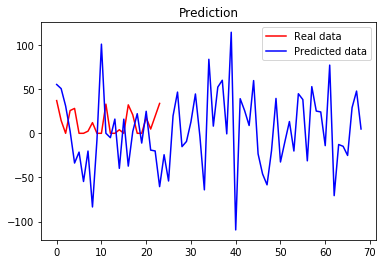

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 4737356.0000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 1102285.5000
Epoch 3/100
9/9 [==============================] - 0s 890us/step - loss: 760125.6875
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 253625.5625
Epoch 5/100
9/9 [==============================] - 0s 891us/step - loss: 91731.0938
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 81488.9453
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 56712.2227
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 56943.2734
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 61267.3242
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 60225.9805
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 39431.5352
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss:

9/9 [==============================] - 0s 997us/step - loss: 1993.0665
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 3099.1306


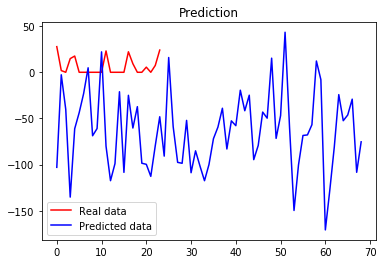

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 5685304.5000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 1565867.6250
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 715873.1250
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 347073.8125
Epoch 5/100
9/9 [==============================] - 0s 995us/step - loss: 219140.4688
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 224690.0938
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 168709.0938
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 166285.4062
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 165390.7812
Epoch 10/100
9/9 [==============================] - 0s 886us/step - loss: 152115.3281
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 141676.5469
Epoch 12/100
9/9 [==============================] - 0s 997us/step 

9/9 [==============================] - 0s 1ms/step - loss: 2907.8174
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 3873.6567


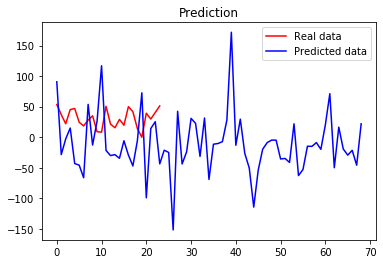

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 5351349.0000
Epoch 2/100
6/6 [==============================] - 0s 997us/step - loss: 1703096.2500
Epoch 3/100
6/6 [==============================] - 0s 997us/step - loss: 897094.5625
Epoch 4/100
6/6 [==============================] - 0s 997us/step - loss: 518105.0938
Epoch 5/100
6/6 [==============================] - 0s 997us/step - loss: 339261.9688
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 243571.0000
Epoch 7/100
6/6 [==============================] - 0s 997us/step - loss: 150096.9844
Epoch 8/100
6/6 [==============================] - 0s 998us/step - loss: 64004.6797
Epoch 9/100
6/6 [==============================] - 0s 996us/step - loss: 38838.8281
Epoch 10/100
6/6 [==============================] - 0s 997us/step - loss: 22538.6445
Epoch 11/100
6/6 [==============================] - 0s 998us/step - loss: 10307.7852
Epoch 12/100
6/6 [==============================] - 0s 997us

6/6 [==============================] - 0s 2ms/step - loss: 7399.7334
Epoch 100/100
6/6 [==============================] - 0s 1ms/step - loss: 9131.1416


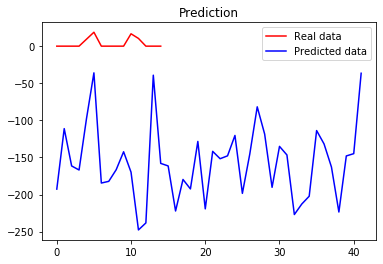

 77%|███████▋  | 76/99 [14:50<04:08, 10.79s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 11898597.0000
Epoch 2/100
9/9 [==============================] - 0s 887us/step - loss: 3258182.2500
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 1017328.0000
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 341480.8125
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 137272.3594
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 64545.6758
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 31678.7617
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 10796.7197
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 4943.8003
Epoch 10/100
9/9 [==============================] - 0s 886us/step - loss: 3382.9788
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 2800.0200
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss:

Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2737.7554


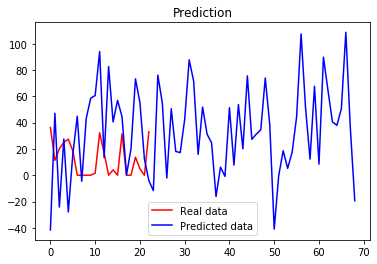

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 3765082.7500
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 1446991.0000
Epoch 3/100
9/9 [==============================] - 0s 892us/step - loss: 541251.8125
Epoch 4/100
9/9 [==============================] - 0s 887us/step - loss: 303088.6875
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 167054.8281
Epoch 6/100
9/9 [==============================] - 0s 886us/step - loss: 102850.6094
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 129362.0000
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 70626.4141
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 56914.3945
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 51225.4805
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 55103.9961
Epoch 12/100
9/9 [==============================] - 0s 891us/ste

9/9 [==============================] - 0s 2ms/step - loss: 2329.2983


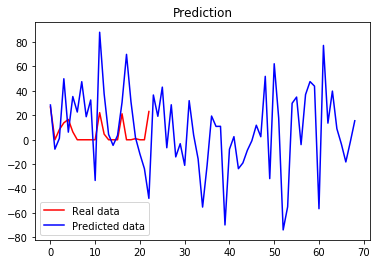

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 10177308.0000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 4369202.0000
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 1520030.7500
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 814745.9375
Epoch 5/100
9/9 [==============================] - 0s 886us/step - loss: 435997.6875
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 245127.3594
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 171677.5938
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 164324.0312
Epoch 9/100
9/9 [==============================] - 0s 887us/step - loss: 132471.0781
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 160472.6719
Epoch 11/100
9/9 [==============================] - 0s 886us/step - loss: 153468.9062
Epoch 12/100
9/9 [==============================] - ETA: 0

9/9 [==============================] - 0s 1ms/step - loss: 3449.6152
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 2834.3286


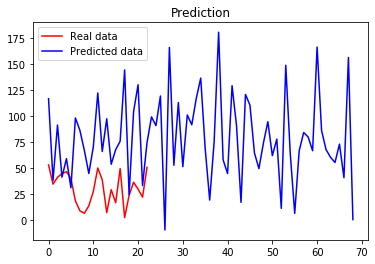

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 7952451.0000
Epoch 2/100
6/6 [==============================] - 0s 831us/step - loss: 2729918.7500
Epoch 3/100
6/6 [==============================] - 0s 998us/step - loss: 1322878.1250
Epoch 4/100
6/6 [==============================] - 0s 997us/step - loss: 443727.8125
Epoch 5/100
6/6 [==============================] - 0s 998us/step - loss: 173356.8750
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 164612.4219
Epoch 7/100
6/6 [==============================] - 0s 831us/step - loss: 113470.8359
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 51526.1367
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 29458.4727
Epoch 10/100
6/6 [==============================] - 0s 831us/step - loss: 14887.2441
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 9957.1016
Epoch 12/100
6/6 [==============================] - 0s 997us/step 

6/6 [==============================] - 0s 1ms/step - loss: 1246.1854


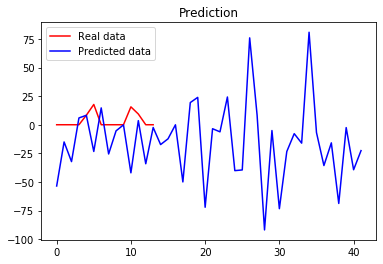

 78%|███████▊  | 77/99 [15:01<03:54, 10.67s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 7539298.5000
Epoch 2/100
9/9 [==============================] - 0s 994us/step - loss: 1670912.7500
Epoch 3/100
9/9 [==============================] - 0s 994us/step - loss: 574660.1875
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 299667.5938
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 124084.3984
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 38930.1992
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 14526.3252
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 7047.3706
Epoch 9/100
9/9 [==============================] - 0s 891us/step - loss: 2698.6960
Epoch 10/100
9/9 [==============================] - 0s 998us/step - loss: 3262.5974
Epoch 11/100
9/9 [==============================] - 0s 887us/step - loss: 2586.0271
Epoch 12/100
9/9 [==============================] - 0s 997us/step - 

9/9 [==============================] - 0s 1ms/step - loss: 1525.2528


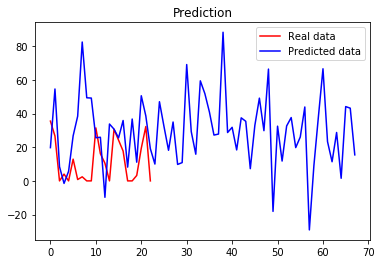

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 27775194.0000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 6778773.0000
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 2471647.5000
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 1093562.3750
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 614142.5000
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 246429.5312
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 144394.4062
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 147719.7188
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 96011.5625
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 85752.3594
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 75613.3047
Epoch 12/100
9/9 [==============================] - 0s 1ms

9/9 [==============================] - 0s 1ms/step - loss: 4841.9111
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 8682.0850


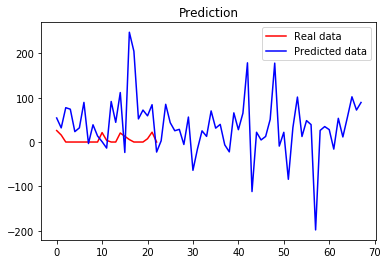

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 5180682.5000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 1161737.0000
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 401273.9375
Epoch 4/100
9/9 [==============================] - 0s 997us/step - loss: 145273.6094
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 85166.4297
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 51607.6523
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 47120.9688
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 27029.9746
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 23638.5332
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 23128.2227
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 19597.5566
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 14437

9/9 [==============================] - 0s 1ms/step - loss: 2157.9966


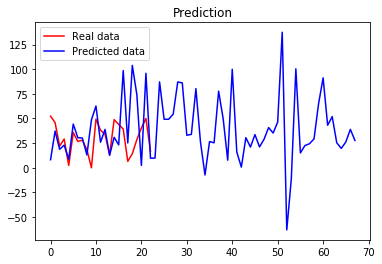

(132, 4)
Epoch 1/100
6/6 [==============================] - 0s 1ms/step - loss: 13394758.0000
Epoch 2/100
6/6 [==============================] - 0s 1ms/step - loss: 4401934.5000
Epoch 3/100
6/6 [==============================] - 0s 2ms/step - loss: 2227533.0000
Epoch 4/100
6/6 [==============================] - 0s 1ms/step - loss: 995664.1875
Epoch 5/100
6/6 [==============================] - 0s 1ms/step - loss: 444502.5312
Epoch 6/100
6/6 [==============================] - 0s 1ms/step - loss: 212138.7500
Epoch 7/100
6/6 [==============================] - 0s 1ms/step - loss: 106479.1953
Epoch 8/100
6/6 [==============================] - 0s 1ms/step - loss: 66973.9453
Epoch 9/100
6/6 [==============================] - 0s 1ms/step - loss: 41761.5664
Epoch 10/100
6/6 [==============================] - 0s 1ms/step - loss: 24929.1387
Epoch 11/100
6/6 [==============================] - 0s 1ms/step - loss: 9383.7979
Epoch 12/100
6/6 [==============================] - 0s 1ms/step - loss: 9711.

6/6 [==============================] - 0s 997us/step - loss: 2358.5198
Epoch 100/100
6/6 [==============================] - 0s 1ms/step - loss: 2112.1450


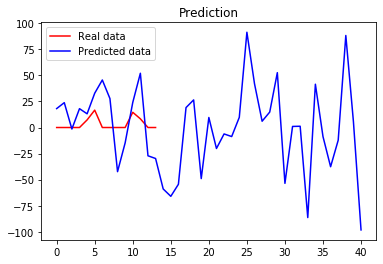

 79%|███████▉  | 78/99 [15:11<03:41, 10.53s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 10365823.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 2845711.5000
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 789172.1875
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 341685.6562
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 155861.5781
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 66740.9453
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 26899.6895
Epoch 8/100
9/9 [==============================] - 0s 998us/step - loss: 7747.2529
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 5933.6025
Epoch 10/100
9/9 [==============================] - ETA: 0s - loss: 8071.33 - 0s 1ms/step - loss: 5527.2334
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 3194.9246
Epoch 12/100
9/9 [==============================] - 0s 

9/9 [==============================] - 0s 1ms/step - loss: 3541.6023


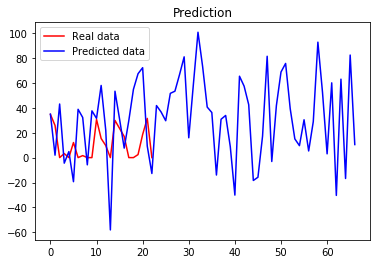

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 6984413.5000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 1881664.7500
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 1070695.8750
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 355069.0938
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 131018.8672
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 116560.5625
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 69699.8594
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 60848.2578
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 84156.5391
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 98143.8281
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 78215.9844
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 51221.

9/9 [==============================] - 0s 1ms/step - loss: 4991.0454
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 3985.2090


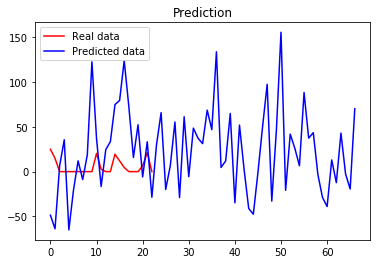

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 3235172.2500
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 1620067.6250
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 629607.3125
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 443326.4375
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 427618.7812
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 203522.0156
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 203131.6562
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 94179.0859
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 63622.5586
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 72657.7500
Epoch 11/100
9/9 [==============================] - 0s 2ms/step - loss: 72453.3828
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 44620.

9/9 [==============================] - 0s 1ms/step - loss: 778.6218


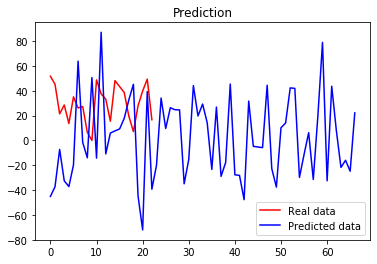

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 997us/step - loss: 14285635.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 2725101.2500
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 2944852.0000
Epoch 4/100
5/5 [==============================] - 0s 997us/step - loss: 1130447.6250
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 551722.5000
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 534815.6875
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 135889.7031
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 217605.8750
Epoch 9/100
5/5 [==============================] - 0s 805us/step - loss: 29145.1914
Epoch 10/100
5/5 [==============================] - 0s 998us/step - loss: 86315.3281
Epoch 11/100
5/5 [==============================] - 0s 997us/step - loss: 17678.5391
Epoch 12/100
5/5 [==============================] - 0s 997us/s

Epoch 100/100
5/5 [==============================] - 0s 997us/step - loss: 2012.8600


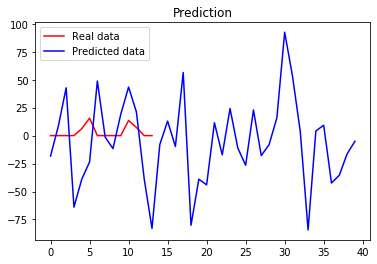

 80%|███████▉  | 79/99 [15:21<03:26, 10.31s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 3748910.5000
Epoch 2/100
9/9 [==============================] - 0s 887us/step - loss: 1128795.7500
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 310671.8125
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 154057.8906
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 40350.9531
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 28704.6641
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 8530.9473
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 3203.6389
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 1864.2125
Epoch 10/100
9/9 [==============================] - 0s 887us/step - loss: 1507.5471
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 1129.2877
Epoch 12/100
9/9 [==============================] - 0s 999us/step - loss: 

9/9 [==============================] - 0s 1ms/step - loss: 739.6063


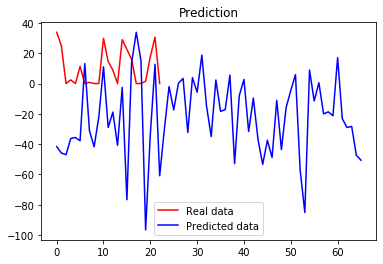

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 9775626.0000
Epoch 2/100
9/9 [==============================] - 0s 1ms/step - loss: 2112191.2500
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 796475.5000
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 397463.5000
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 162017.7969
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 120210.8281
Epoch 7/100
9/9 [==============================] - 0s 1ms/step - loss: 133970.2031
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 87470.0391
Epoch 9/100
9/9 [==============================] - 0s 2ms/step - loss: 89323.2656
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 75511.0469
Epoch 11/100
9/9 [==============================] - 0s 2ms/step - loss: 83898.6250
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 80995.

9/9 [==============================] - 0s 1ms/step - loss: 2607.2468


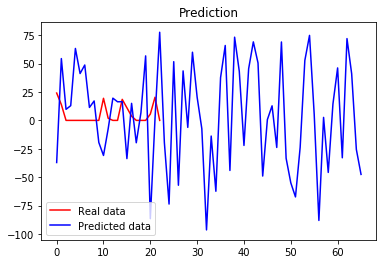

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 6391225.5000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 1209119.2500
Epoch 3/100
9/9 [==============================] - 0s 997us/step - loss: 516131.0938
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 138124.1094
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 103246.0781
Epoch 6/100
9/9 [==============================] - 0s 997us/step - loss: 93761.1172
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 73653.9766
Epoch 8/100
9/9 [==============================] - 0s 886us/step - loss: 59093.5352
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 49390.1875
Epoch 10/100
9/9 [==============================] - 0s 891us/step - loss: 53447.3086
Epoch 11/100
9/9 [==============================] - 0s 997us/step - loss: 49818.8594
Epoch 12/100
9/9 [==============================] - 0s 998us/s

9/9 [==============================] - 0s 1ms/step - loss: 3059.2969
Epoch 100/100
9/9 [==============================] - 0s 997us/step - loss: 2524.9836


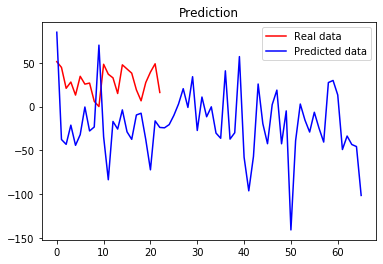

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 998us/step - loss: 18383172.0000
Epoch 2/100
5/5 [==============================] - 0s 806us/step - loss: 5279726.0000
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 3986855.7500
Epoch 4/100
5/5 [==============================] - 0s 1ms/step - loss: 676292.4375
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 1197060.8750
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 264951.8125
Epoch 7/100
5/5 [==============================] - 0s 1ms/step - loss: 364668.2812
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 141860.3906
Epoch 9/100
5/5 [==============================] - 0s 997us/step - loss: 93820.0469
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 69555.6406
Epoch 11/100
5/5 [==============================] - 0s 997us/step - loss: 26350.1992
Epoch 12/100
5/5 [==============================] - 0s 1ms/step - 

5/5 [==============================] - 0s 1ms/step - loss: 1544.5416


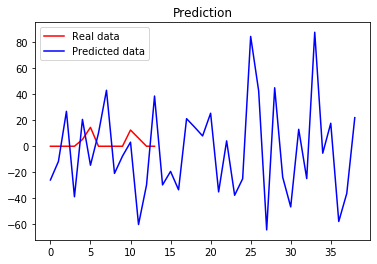

 81%|████████  | 80/99 [15:31<03:15, 10.28s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 6372906.5000
Epoch 2/100
9/9 [==============================] - 0s 997us/step - loss: 1578711.5000
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 522302.7188
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 184580.6094
Epoch 5/100
9/9 [==============================] - 0s 890us/step - loss: 83375.6562
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 38734.5156
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 15861.7412
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 6839.3276
Epoch 9/100
9/9 [==============================] - 0s 886us/step - loss: 2752.0864
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 1890.4733
Epoch 11/100
9/9 [==============================] - 0s 884us/step - loss: 756.3157
Epoch 12/100
9/9 [==============================] - 0s 1ms/step - loss: 58

9/9 [==============================] - 0s 1ms/step - loss: 504.2983


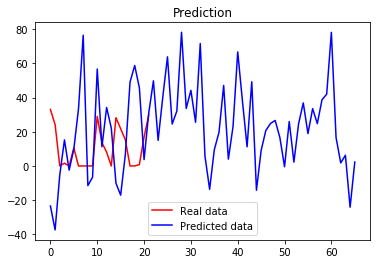

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 15933980.0000
Epoch 2/100
9/9 [==============================] - 0s 887us/step - loss: 3577480.5000
Epoch 3/100
9/9 [==============================] - 0s 889us/step - loss: 1393471.3750
Epoch 4/100
9/9 [==============================] - 0s 886us/step - loss: 554496.1250
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 271031.5000
Epoch 6/100
9/9 [==============================] - 0s 997us/step - loss: 168323.3125
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 69590.6875
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 86353.3672
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 45261.1875
Epoch 10/100
9/9 [==============================] - 0s 992us/step - loss: 35951.1602
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 32234.8633
Epoch 12/100
9/9 [==============================] - 0s 891u

9/9 [==============================] - 0s 1ms/step - loss: 5903.9351
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 5688.6016


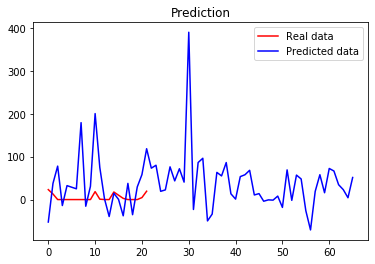

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 5688301.0000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 2396632.2500
Epoch 3/100
9/9 [==============================] - 0s 891us/step - loss: 580943.5000
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 430000.2188
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 208577.8438
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 128440.0781
Epoch 7/100
9/9 [==============================] - 0s 887us/step - loss: 103940.1016
Epoch 8/100
9/9 [==============================] - 0s 997us/step - loss: 94306.4531
Epoch 9/100
9/9 [==============================] - 0s 891us/step - loss: 81124.1016
Epoch 10/100
9/9 [==============================] - 0s 886us/step - loss: 72400.1484
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 70897.5547
Epoch 12/100
9/9 [==============================] - 0s 997us/s

9/9 [==============================] - 0s 1ms/step - loss: 3559.7954
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 7044.7754


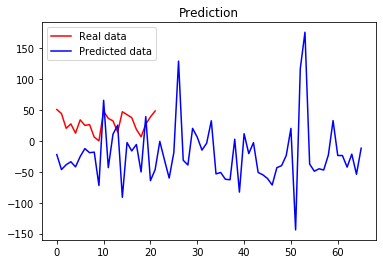

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 990us/step - loss: 10130972.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 3058628.5000
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 1120656.8750
Epoch 4/100
5/5 [==============================] - 0s 1ms/step - loss: 770289.0625
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 711752.0625
Epoch 6/100
5/5 [==============================] - 0s 998us/step - loss: 234523.5312
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 133850.7188
Epoch 8/100
5/5 [==============================] - 0s 998us/step - loss: 146499.0469
Epoch 9/100
5/5 [==============================] - 0s 997us/step - loss: 57392.9609
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 29795.7109
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 31882.0352
Epoch 12/100
5/5 [==============================] - 0s 1ms/step -

5/5 [==============================] - 0s 2ms/step - loss: 2575.3870
Epoch 100/100
5/5 [==============================] - 0s 1ms/step - loss: 2839.8152


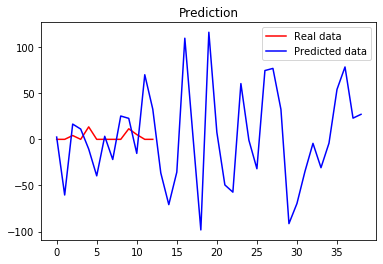

 82%|████████▏ | 81/99 [15:41<03:03, 10.21s/it]

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 1ms/step - loss: 8394793.0000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 1948698.8750
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 578467.8750
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 202799.5469
Epoch 5/100
9/9 [==============================] - 0s 997us/step - loss: 85645.8594
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 44400.8359
Epoch 7/100
9/9 [==============================] - 0s 997us/step - loss: 25877.6230
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 7873.8423
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 5225.9629
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 4480.8057
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 5761.1831
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss: 284

9/9 [==============================] - 0s 1ms/step - loss: 1224.0826


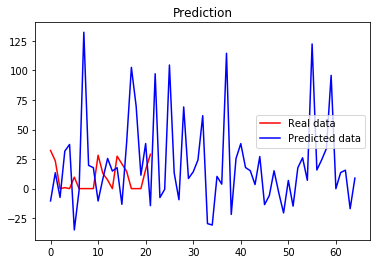

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 886us/step - loss: 1869013.8750
Epoch 2/100
9/9 [==============================] - 0s 886us/step - loss: 510438.5938
Epoch 3/100
9/9 [==============================] - 0s 1ms/step - loss: 123079.2188
Epoch 4/100
9/9 [==============================] - 0s 1ms/step - loss: 128411.1797
Epoch 5/100
9/9 [==============================] - 0s 891us/step - loss: 66665.7734
Epoch 6/100
9/9 [==============================] - 0s 1ms/step - loss: 73803.4297
Epoch 7/100
9/9 [==============================] - 0s 776us/step - loss: 26386.5625
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 20585.6484
Epoch 9/100
9/9 [==============================] - 0s 1ms/step - loss: 16471.3848
Epoch 10/100
9/9 [==============================] - 0s 997us/step - loss: 16328.6113
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 16482.2285
Epoch 12/100
9/9 [==============================] - 0s 997us/step - loss

Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 1905.8303


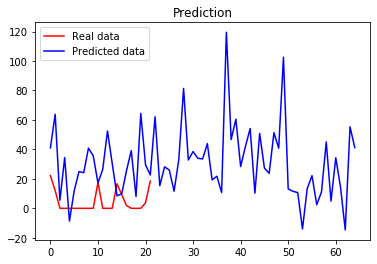

(168, 4)
Epoch 1/100
9/9 [==============================] - 0s 997us/step - loss: 4264783.5000
Epoch 2/100
9/9 [==============================] - 0s 891us/step - loss: 802826.0625
Epoch 3/100
9/9 [==============================] - 0s 887us/step - loss: 447783.2188
Epoch 4/100
9/9 [==============================] - 0s 891us/step - loss: 816875.8125
Epoch 5/100
9/9 [==============================] - 0s 1ms/step - loss: 178156.9531
Epoch 6/100
9/9 [==============================] - 0s 997us/step - loss: 108018.4609
Epoch 7/100
9/9 [==============================] - 0s 891us/step - loss: 117644.1016
Epoch 8/100
9/9 [==============================] - 0s 1ms/step - loss: 132323.0781
Epoch 9/100
9/9 [==============================] - 0s 997us/step - loss: 353921.5000
Epoch 10/100
9/9 [==============================] - 0s 1ms/step - loss: 486255.9062
Epoch 11/100
9/9 [==============================] - 0s 1ms/step - loss: 264437.5312
Epoch 12/100
9/9 [==============================] - 0s 887us/

9/9 [==============================] - 0s 3ms/step - loss: 7150.1294
Epoch 100/100
9/9 [==============================] - 0s 1ms/step - loss: 6305.6865


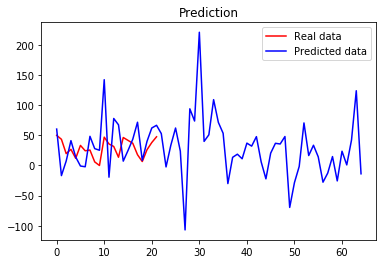

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 20210234.0000
Epoch 2/100
5/5 [==============================] - 0s 997us/step - loss: 4381150.0000
Epoch 3/100
5/5 [==============================] - 0s 2ms/step - loss: 4581718.5000
Epoch 4/100
5/5 [==============================] - 0s 1ms/step - loss: 783494.6250
Epoch 5/100
5/5 [==============================] - 0s 2ms/step - loss: 1389305.2500
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 338544.0000
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 474160.7500
Epoch 8/100
5/5 [==============================] - 0s 997us/step - loss: 136387.6094
Epoch 9/100
5/5 [==============================] - 0s 1ms/step - loss: 146069.7031
Epoch 10/100
5/5 [==============================] - 0s 997us/step - loss: 64084.7617
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 52658.2773
Epoch 12/100
5/5 [==============================] - 0s 1ms/step -

5/5 [==============================] - 0s 1ms/step - loss: 5144.5107
Epoch 100/100
5/5 [==============================] - 0s 1ms/step - loss: 4477.2896


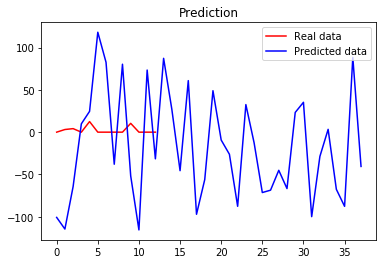

 83%|████████▎ | 82/99 [15:51<02:54, 10.27s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 873us/step - loss: 6893997.5000
Epoch 2/100
8/8 [==============================] - 0s 748us/step - loss: 1873372.7500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 761080.6250
Epoch 4/100
8/8 [==============================] - 0s 878us/step - loss: 314843.9375
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 130203.6406
Epoch 6/100
8/8 [==============================] - 0s 993us/step - loss: 58599.9453
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 22190.3867
Epoch 8/100
8/8 [==============================] - 0s 995us/step - loss: 9435.4707
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 4433.8135
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 2891.5784
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 1938.4081
Epoch 12/100
8/8 [==============================] - 0s 998us/step - loss

8/8 [==============================] - 0s 998us/step - loss: 1082.9752


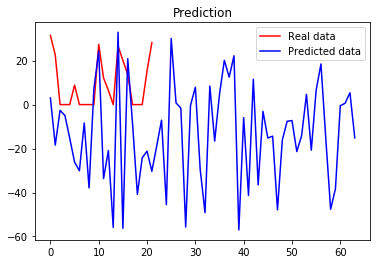

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 10056553.0000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 4259402.0000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 1486646.8750
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 548570.9375
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 305054.6875
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 175069.1094
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 106198.5859
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 63215.1016
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 44284.6406
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 41641.6797
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 39863.9688
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 40

8/8 [==============================] - 0s 996us/step - loss: 6337.0532
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 5777.2285


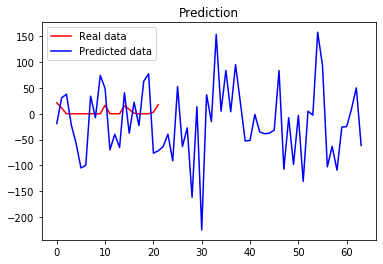

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 13304170.0000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 2108908.0000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 752694.7500
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 549790.1250
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 672543.5000
Epoch 6/100
8/8 [==============================] - 0s 2ms/step - loss: 395798.3750
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 363706.2500
Epoch 8/100
8/8 [==============================] - 0s 2ms/step - loss: 387753.5000
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 294193.4688
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 213517.2969
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 274761.8125
Epoch 12/100
8/8 [==============================] - 0s 2ms/step - loss: 2

8/8 [==============================] - 0s 1ms/step - loss: 2648.6541
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 2304.5637


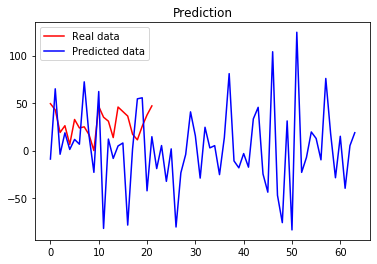

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 998us/step - loss: 34636184.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 7325823.0000
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 7992083.0000
Epoch 4/100
5/5 [==============================] - 0s 997us/step - loss: 3258656.0000
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 1159571.0000
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 1718117.8750
Epoch 7/100
5/5 [==============================] - 0s 1ms/step - loss: 277602.0000
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 515138.0938
Epoch 9/100
5/5 [==============================] - 0s 2ms/step - loss: 242331.3438
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 83825.4766
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 121839.3281
Epoch 12/100
5/5 [==============================] - 0s 2ms/step - 

5/5 [==============================] - 0s 1ms/step - loss: 4232.9160


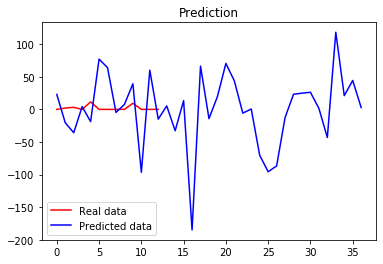

 84%|████████▍ | 83/99 [16:01<02:41, 10.07s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 5311488.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1007099.5000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 594345.4375
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 224926.6562
Epoch 5/100
8/8 [==============================] - 0s 873us/step - loss: 71413.0859
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 43437.3008
Epoch 7/100
8/8 [==============================] - 0s 878us/step - loss: 21618.7363
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 13612.3838
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 9168.5615
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 6159.1191
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 3301.3418
Epoch 12/100
8/8 [==============================] - 0s 997us/step - loss

8/8 [==============================] - 0s 1ms/step - loss: 4252.8506
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 5969.7979


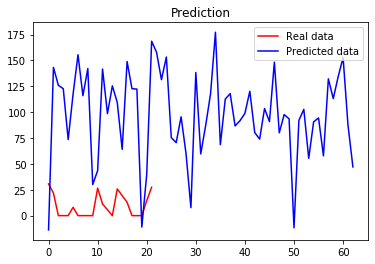

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 4127275.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 1141431.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 404929.2188
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 136021.7500
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 60862.5859
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 31503.6621
Epoch 7/100
8/8 [==============================] - 0s 872us/step - loss: 16917.9863
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 14831.0283
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 15523.7471
Epoch 10/100
8/8 [==============================] - 0s 998us/step - loss: 13771.9854
Epoch 11/100
8/8 [==============================] - 0s 996us/step - loss: 18935.2031
Epoch 12/100
8/8 [==============================] - 0s 998us/step

8/8 [==============================] - 0s 1ms/step - loss: 1053.3027


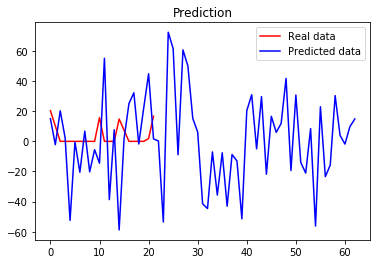

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 8618296.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 2472665.0000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 1327414.2500
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 579648.3750
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 257791.9844
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 210746.9219
Epoch 7/100
8/8 [==============================] - 0s 873us/step - loss: 139361.8125
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 123637.9219
Epoch 9/100
8/8 [==============================] - 0s 873us/step - loss: 120124.0938
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 117431.3984
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 101532.6953
Epoch 12/100
8/8 [==============================] - 0s 1ms/step -

8/8 [==============================] - 0s 1ms/step - loss: 4546.2578
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 4387.7563


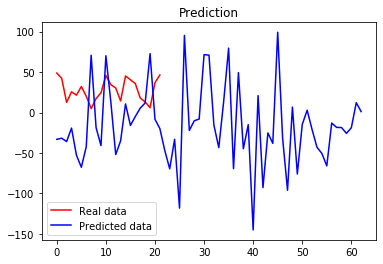

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 4677972.5000
Epoch 2/100
5/5 [==============================] - 0s 997us/step - loss: 1958692.8750
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 864246.5625
Epoch 4/100
5/5 [==============================] - 0s 997us/step - loss: 578910.7500
Epoch 5/100
5/5 [==============================] - 0s 997us/step - loss: 441911.1562
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 249142.5625
Epoch 7/100
5/5 [==============================] - 0s 1ms/step - loss: 103982.4688
Epoch 8/100
5/5 [==============================] - 0s 997us/step - loss: 41994.8594
Epoch 9/100
5/5 [==============================] - 0s 1ms/step - loss: 59082.4531
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 54126.2695
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 32796.2461
Epoch 12/100
5/5 [==============================] - 0s 1ms/step - loss

5/5 [==============================] - 0s 2ms/step - loss: 8145.9473
Epoch 100/100
5/5 [==============================] - 0s 1ms/step - loss: 5634.1543


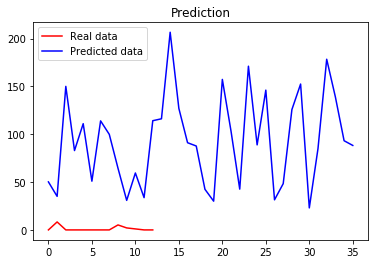

 85%|████████▍ | 84/99 [16:11<02:29,  9.97s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 6435029.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1173207.7500
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 724190.6250
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 207416.9844
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 99106.8984
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 37602.6953
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 22238.6738
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 10605.3203
Epoch 9/100
8/8 [==============================] - 0s 998us/step - loss: 8351.8555
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 7229.4771
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 6272.1240
Epoch 12/100
8/8 [==============================] - 0s 998us/step - loss

8/8 [==============================] - 0s 2ms/step - loss: 5232.9204
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 5618.0562


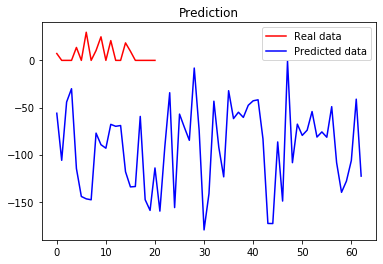

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 3656842.2500
Epoch 2/100
8/8 [==============================] - 0s 877us/step - loss: 1289613.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 485591.9062
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 202973.2188
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 86791.9219
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 58887.9961
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 34935.1602
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 29505.4785
Epoch 9/100
8/8 [==============================] - 0s 999us/step - loss: 23458.1250
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 22314.7031
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 19832.5176
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 188

8/8 [==============================] - 0s 1ms/step - loss: 1453.8988


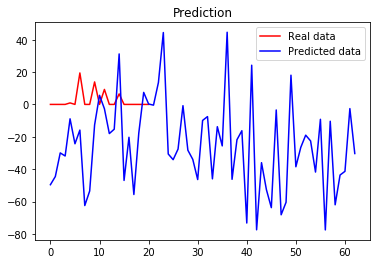

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 998us/step - loss: 6603790.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 1733429.1250
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 773979.4375
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 421676.4062
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 162637.5938
Epoch 6/100
8/8 [==============================] - 0s 998us/step - loss: 130813.4219
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 60381.5664
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 45259.5664
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 45004.0312
Epoch 10/100
8/8 [==============================] - 0s 877us/step - loss: 40658.1836
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 33283.3984
Epoch 12/100
8/8 [==============================] - 0s 1ms/step -

8/8 [==============================] - 0s 1ms/step - loss: 2296.4597


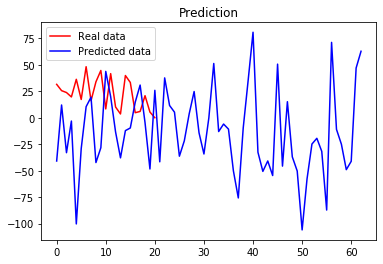

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 4984470.5000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 1952529.1250
Epoch 3/100
5/5 [==============================] - 0s 1ms/step - loss: 960304.1250
Epoch 4/100
5/5 [==============================] - 0s 798us/step - loss: 528322.3125
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 335882.8438
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 223206.6875
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 125696.6797
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 77435.0703
Epoch 9/100
5/5 [==============================] - 0s 998us/step - loss: 54386.2148
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 33991.6016
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 23399.4668
Epoch 12/100
5/5 [==============================] - 0s 1ms/step - loss: 

5/5 [==============================] - 0s 1ms/step - loss: 7028.9468


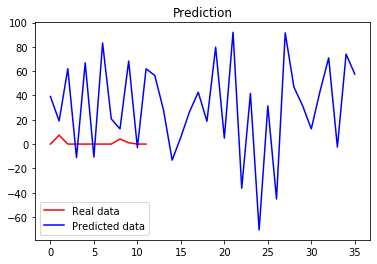

 86%|████████▌ | 85/99 [16:21<02:19,  9.97s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 27184176.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 5537573.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 1985133.6250
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 689205.3750
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 305761.6562
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 193300.8594
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 98601.8594
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 52514.5742
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 27785.0410
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 13837.7334
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 11018.2471
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - los

8/8 [==============================] - 0s 997us/step - loss: 2878.0630
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 2308.6504


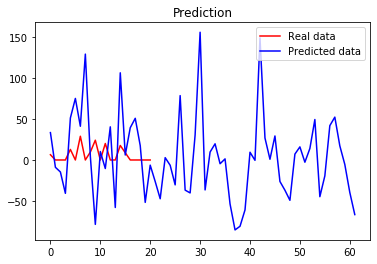

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 5977777.0000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 2649190.2500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 994672.5000
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 352082.1250
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 269254.0312
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 152415.4219
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 70384.6016
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 50826.9727
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 42271.9414
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 47298.5547
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 58203.9609
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 42547.7

8/8 [==============================] - 0s 1ms/step - loss: 5560.7988
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 2865.1501


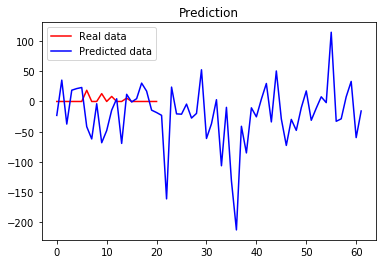

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 10842665.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 3104943.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 1183963.5000
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 710474.3125
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 319966.0625
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 175475.6406
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 88403.3906
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 88457.8516
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 75656.7969
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 74421.4453
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 52836.8320
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 613

8/8 [==============================] - 0s 1ms/step - loss: 2031.3036


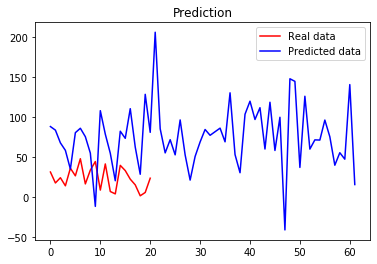

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 10939096.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 3915275.5000
Epoch 3/100
5/5 [==============================] - 0s 2ms/step - loss: 2076157.5000
Epoch 4/100
5/5 [==============================] - 0s 1ms/step - loss: 1148680.8750
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 791387.8750
Epoch 6/100
5/5 [==============================] - 0s 2ms/step - loss: 538995.0000
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 364961.4375
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 175427.6250
Epoch 9/100
5/5 [==============================] - 0s 997us/step - loss: 126911.8125
Epoch 10/100
5/5 [==============================] - 0s 997us/step - loss: 58892.4492
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 43106.9375
Epoch 12/100
5/5 [==============================] - 0s 997us/step -

5/5 [==============================] - 0s 997us/step - loss: 16211.9053
Epoch 100/100
5/5 [==============================] - 0s 997us/step - loss: 13135.2236


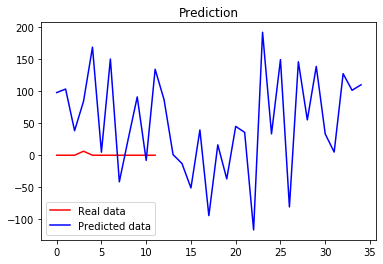

 87%|████████▋ | 86/99 [16:31<02:09,  9.99s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 2874187.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 776429.5625
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 302230.0312
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 104580.4062
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 70066.5625
Epoch 6/100
8/8 [==============================] - 0s 998us/step - loss: 24339.6270
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 14965.9805
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 6400.0762
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 3654.5291
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 1926.7081
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 1514.2517
Epoch 12/100
8/8 [==============================] - 0s 997us/step - loss: 1195.1431


8/8 [==============================] - 0s 1ms/step - loss: 1419.2277


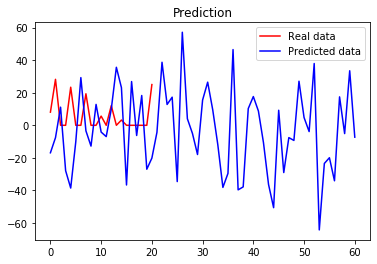

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 5202651.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1332059.6250
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 817182.5625
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 431897.7812
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 123099.6562
Epoch 6/100
8/8 [==============================] - 0s 998us/step - loss: 71043.8906
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 52315.8867
Epoch 8/100
8/8 [==============================] - 0s 877us/step - loss: 64464.5859
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 42656.3125
Epoch 10/100
8/8 [==============================] - 0s 872us/step - loss: 44507.9023
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 41613.4375
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - 

8/8 [==============================] - 0s 1ms/step - loss: 7841.1162
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 4172.8193


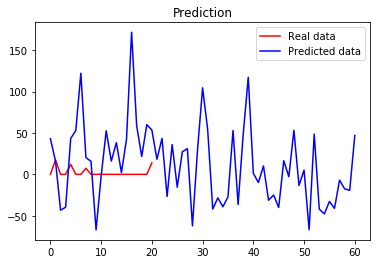

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 10453154.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 3274914.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 1243495.3750
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 697999.4375
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 376045.9062
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 241117.1250
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 168198.9062
Epoch 8/100
8/8 [==============================] - 0s 877us/step - loss: 147835.6250
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 112636.5234
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 114001.9531
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 117816.5312
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - lo

8/8 [==============================] - 0s 1ms/step - loss: 5526.3545
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 4790.1650


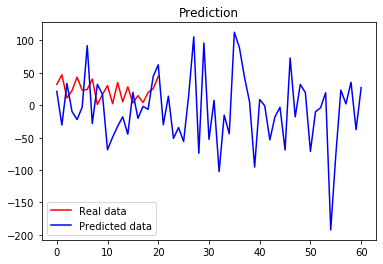

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 9789588.0000
Epoch 2/100
5/5 [==============================] - 0s 798us/step - loss: 3035981.0000
Epoch 3/100
5/5 [==============================] - 0s 806us/step - loss: 1153495.2500
Epoch 4/100
5/5 [==============================] - 0s 1ms/step - loss: 450560.1250
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 534265.8125
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 373308.1250
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 110299.9766
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 64530.1328
Epoch 9/100
5/5 [==============================] - 0s 1ms/step - loss: 78847.8125
Epoch 10/100
5/5 [==============================] - 0s 798us/step - loss: 36401.7070
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 13043.8779
Epoch 12/100
5/5 [==============================] - 0s 997us/step - l

5/5 [==============================] - 0s 4ms/step - loss: 1216.0306


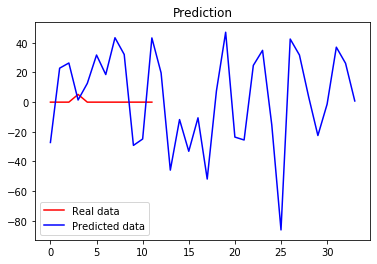

 88%|████████▊ | 87/99 [16:40<01:58,  9.86s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 998us/step - loss: 3309444.2500
Epoch 2/100
8/8 [==============================] - 0s 878us/step - loss: 1030576.2500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 275947.7812
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 183292.9219
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 64245.9375
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 26070.3359
Epoch 7/100
8/8 [==============================] - 0s 873us/step - loss: 13319.3008
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 8473.9336
Epoch 9/100
8/8 [==============================] - 0s 877us/step - loss: 3828.6650
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 2087.7612
Epoch 11/100
8/8 [==============================] - 0s 873us/step - loss: 983.2624
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 

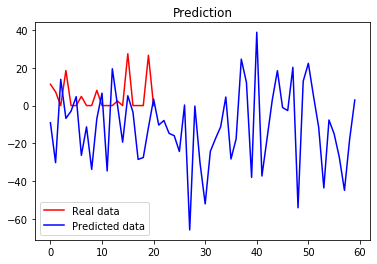

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 1664463.5000
Epoch 2/100
8/8 [==============================] - 0s 874us/step - loss: 589952.8750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 253105.0000
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 80721.7656
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 40286.1523
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 25311.2539
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 15978.8545
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 9018.2949
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 7998.7437
Epoch 10/100
8/8 [==============================] - 0s 878us/step - loss: 8070.5854
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 8840.2852
Epoch 12/100
8/8 [==============================] - 0s 878us/step - loss: 8

8/8 [==============================] - 0s 2ms/step - loss: 1101.4166


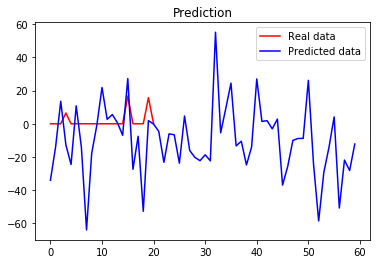

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 873us/step - loss: 6008605.5000
Epoch 2/100
8/8 [==============================] - 0s 872us/step - loss: 1798644.0000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 423828.3750
Epoch 4/100
8/8 [==============================] - 0s 873us/step - loss: 281867.5312
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 278684.1250
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 166721.0312
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 164272.8594
Epoch 8/100
8/8 [==============================] - 0s 877us/step - loss: 114283.2344
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 68079.5547
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 68229.0469
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 59588.6172
Epoch 12/100
8/8 [==============================] - 0s 997us/step

8/8 [==============================] - 0s 1ms/step - loss: 2455.4497
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 5703.0732


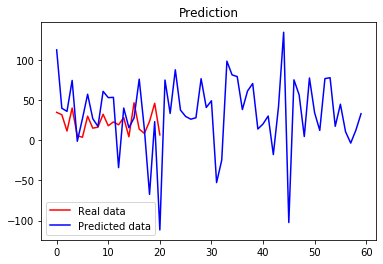

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 6439259.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 2558434.2500
Epoch 3/100
5/5 [==============================] - 0s 2ms/step - loss: 1321778.1250
Epoch 4/100
5/5 [==============================] - 0s 2ms/step - loss: 778907.7500
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 624464.0625
Epoch 6/100
5/5 [==============================] - 0s 2ms/step - loss: 404814.3750
Epoch 7/100
5/5 [==============================] - 0s 1ms/step - loss: 193008.4688
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 120701.5000
Epoch 9/100
5/5 [==============================] - 0s 1ms/step - loss: 62509.2852
Epoch 10/100
5/5 [==============================] - 0s 1ms/step - loss: 50570.3086
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 30878.5762
Epoch 12/100
5/5 [==============================] - 0s 1ms/step - loss: 1898

5/5 [==============================] - 0s 998us/step - loss: 7404.0005
Epoch 99/100
5/5 [==============================] - 0s 997us/step - loss: 3391.7253
Epoch 100/100
5/5 [==============================] - 0s 997us/step - loss: 20347.7793


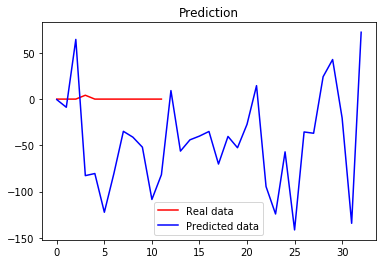

 89%|████████▉ | 88/99 [16:50<01:47,  9.82s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 7004007.5000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1426618.1250
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 733417.4375
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 197187.9688
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 132909.2656
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 37112.6797
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 27400.6113
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 13098.5693
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 13800.7930
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 8330.9893
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 5656.2832
Epoch 12/100
8/8 [==============================] - 0s 997us/step - loss: 42

8/8 [==============================] - 0s 1ms/step - loss: 11067.3896


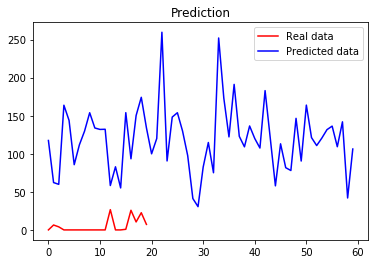

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 6935433.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 2134609.0000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 803214.9375
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 310561.2812
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 150833.8594
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 100370.3672
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 63144.7930
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 48642.9727
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 46494.3633
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 48989.7109
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 49013.9180
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 41251

8/8 [==============================] - 0s 998us/step - loss: 2511.5576
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 4139.8120


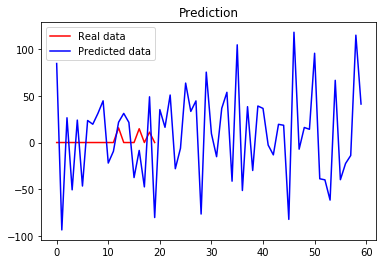

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 6371927.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 1611772.3750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 430146.6875
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 333024.1875
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 184321.8281
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 200328.1406
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 117354.1172
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 95748.9766
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 107729.8281
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 109880.6172
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 164472.8281
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 1

8/8 [==============================] - 0s 1ms/step - loss: 2597.8000
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 2775.8074


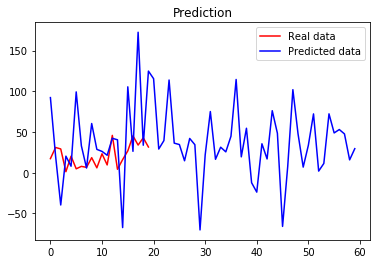

(132, 4)
Epoch 1/100
5/5 [==============================] - 0s 1ms/step - loss: 7243227.0000
Epoch 2/100
5/5 [==============================] - 0s 1ms/step - loss: 3158088.5000
Epoch 3/100
5/5 [==============================] - 0s 997us/step - loss: 1539366.1250
Epoch 4/100
5/5 [==============================] - 0s 798us/step - loss: 1463230.8750
Epoch 5/100
5/5 [==============================] - 0s 1ms/step - loss: 908107.7500
Epoch 6/100
5/5 [==============================] - 0s 1ms/step - loss: 294762.9062
Epoch 7/100
5/5 [==============================] - 0s 997us/step - loss: 135449.8281
Epoch 8/100
5/5 [==============================] - 0s 1ms/step - loss: 185323.1875
Epoch 9/100
5/5 [==============================] - 0s 1ms/step - loss: 113405.0234
Epoch 10/100
5/5 [==============================] - 0s 997us/step - loss: 48115.0547
Epoch 11/100
5/5 [==============================] - 0s 1ms/step - loss: 19934.8535
Epoch 12/100
5/5 [==============================] - 0s 998us/step 

Epoch 100/100
5/5 [==============================] - 0s 997us/step - loss: 1716.5446


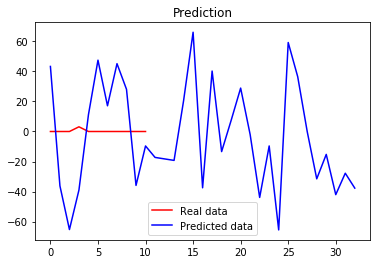

 90%|████████▉ | 89/99 [17:00<01:37,  9.73s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 4500101.5000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 972647.8750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 378062.2812
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 156735.6094
Epoch 5/100
8/8 [==============================] - 0s 2ms/step - loss: 49675.9531
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 23631.6523
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 13568.1172
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 10833.0830
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 9162.1631
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 10590.2256
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 8465.2266
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 7791.5938
Ep

8/8 [==============================] - 0s 1ms/step - loss: 4791.1479


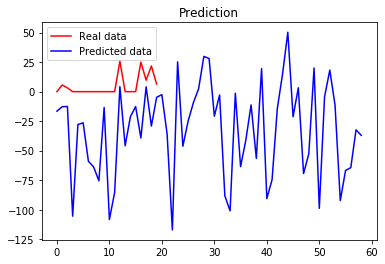

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 2168472.7500
Epoch 2/100
8/8 [==============================] - 0s 753us/step - loss: 472129.1875
Epoch 3/100
8/8 [==============================] - 0s 2ms/step - loss: 270879.3125
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 197229.3594
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 149601.5312
Epoch 6/100
8/8 [==============================] - 0s 873us/step - loss: 95702.4922
Epoch 7/100
8/8 [==============================] - 0s 997us/step - loss: 98567.2422
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 47329.1875
Epoch 9/100
8/8 [==============================] - 0s 997us/step - loss: 36387.0430
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 20925.7676
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 21924.7949
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - l

Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 987.9266


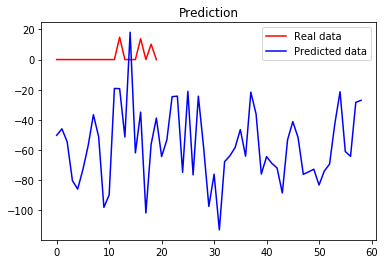

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 6315385.5000
Epoch 2/100
8/8 [==============================] - 0s 878us/step - loss: 1703610.2500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 456534.6250
Epoch 4/100
8/8 [==============================] - 0s 873us/step - loss: 340642.3125
Epoch 5/100
8/8 [==============================] - 0s 998us/step - loss: 292826.2188
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 215695.7188
Epoch 7/100
8/8 [==============================] - 0s 998us/step - loss: 235139.2188
Epoch 8/100
8/8 [==============================] - 0s 872us/step - loss: 143240.2812
Epoch 9/100
8/8 [==============================] - 0s 998us/step - loss: 98187.6328
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 132314.2812
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 108510.7969
Epoch 12/100
8/8 [==============================] - 0s 1ms/

8/8 [==============================] - 0s 1ms/step - loss: 6452.4688
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 6357.9497


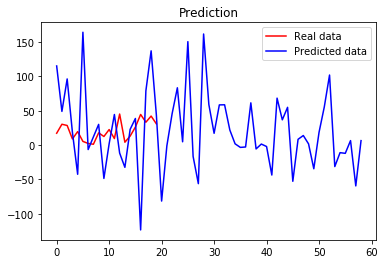

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 998us/step - loss: 14655944.0000
Epoch 2/100
4/4 [==============================] - 0s 997us/step - loss: 6226599.5000
Epoch 3/100
4/4 [==============================] - 0s 997us/step - loss: 4101399.0000
Epoch 4/100
4/4 [==============================] - 0s 997us/step - loss: 1968772.2500
Epoch 5/100
4/4 [==============================] - 0s 1ms/step - loss: 995872.8750
Epoch 6/100
4/4 [==============================] - 0s 1ms/step - loss: 1250256.3750
Epoch 7/100
4/4 [==============================] - 0s 996us/step - loss: 765233.6250
Epoch 8/100
4/4 [==============================] - 0s 998us/step - loss: 270562.9062
Epoch 9/100
4/4 [==============================] - 0s 998us/step - loss: 305838.5625
Epoch 10/100
4/4 [==============================] - 0s 998us/step - loss: 239916.4531
Epoch 11/100
4/4 [==============================] - 0s 998us/step - loss: 102360.1562
Epoch 12/100
4/4 [==============================] - 

4/4 [==============================] - 0s 1ms/step - loss: 14491.6816
Epoch 99/100
4/4 [==============================] - 0s 1ms/step - loss: 16222.6904
Epoch 100/100
4/4 [==============================] - 0s 1ms/step - loss: 15019.2129


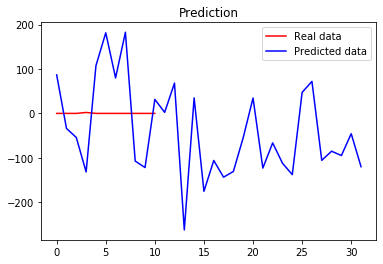

 91%|█████████ | 90/99 [17:09<01:27,  9.67s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 10616061.0000
Epoch 2/100
8/8 [==============================] - 0s 992us/step - loss: 3579861.2500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 915341.4375
Epoch 4/100
8/8 [==============================] - 0s 877us/step - loss: 572884.3750
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 213859.4531
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 101553.8906
Epoch 7/100
8/8 [==============================] - 0s 998us/step - loss: 49112.4258
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 21202.6836
Epoch 9/100
8/8 [==============================] - 0s 873us/step - loss: 11371.6943
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 5183.1724
Epoch 11/100
8/8 [==============================] - 0s 873us/step - loss: 4867.1240
Epoch 12/100
8/8 [==============================] - 0s 1ms/step 

8/8 [==============================] - 0s 998us/step - loss: 6642.8438
Epoch 100/100
8/8 [==============================] - 0s 997us/step - loss: 12239.4395


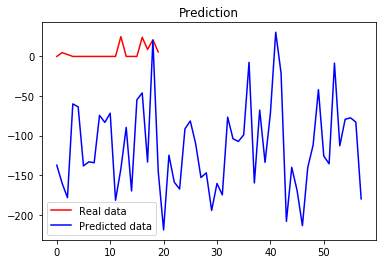

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 8429049.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 2943298.5000
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 803151.3125
Epoch 4/100
8/8 [==============================] - 0s 872us/step - loss: 264886.5625
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 267410.0625
Epoch 6/100
8/8 [==============================] - 0s 873us/step - loss: 95716.0078
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 89069.3359
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 79977.8516
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 77538.7734
Epoch 10/100
8/8 [==============================] - 0s 873us/step - loss: 67787.0234
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 42738.3164
Epoch 12/100
8/8 [==============================] - 0s 997us/step - lo

8/8 [==============================] - 0s 1ms/step - loss: 10944.2461
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 11211.0820


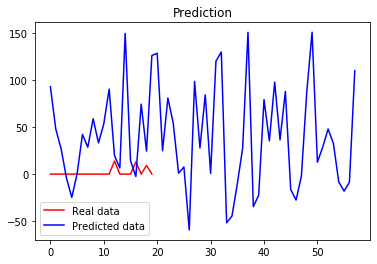

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 10968753.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 4278670.5000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 2071220.1250
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 595082.4375
Epoch 5/100
8/8 [==============================] - 0s 873us/step - loss: 316556.0312
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 179974.3750
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 128479.1953
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 122280.9531
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 89607.2188
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 72161.0312
Epoch 11/100
8/8 [==============================] - 0s 877us/step - loss: 73096.5312
Epoch 12/100
8/8 [==============================] - 0s 1ms/step

8/8 [==============================] - 0s 1ms/step - loss: 3382.8357
Epoch 100/100
8/8 [==============================] - 0s 2ms/step - loss: 3001.9265


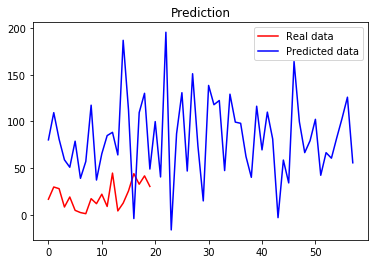

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 1ms/step - loss: 4812004.0000
Epoch 2/100
4/4 [==============================] - 0s 997us/step - loss: 3099762.0000
Epoch 3/100
4/4 [==============================] - 0s 997us/step - loss: 2172114.2500
Epoch 4/100
4/4 [==============================] - 0s 1ms/step - loss: 929262.5000
Epoch 5/100
4/4 [==============================] - 0s 1ms/step - loss: 359584.1875
Epoch 6/100
4/4 [==============================] - 0s 1ms/step - loss: 621576.5625
Epoch 7/100
4/4 [==============================] - 0s 1ms/step - loss: 223504.0000
Epoch 8/100
4/4 [==============================] - 0s 1ms/step - loss: 156092.1250
Epoch 9/100
4/4 [==============================] - 0s 1ms/step - loss: 173599.0469
Epoch 10/100
4/4 [==============================] - 0s 1ms/step - loss: 47422.5664
Epoch 11/100
4/4 [==============================] - 0s 997us/step - loss: 58504.3164
Epoch 12/100
4/4 [==============================] - 0s 1ms/step - los

4/4 [==============================] - 0s 1ms/step - loss: 2702.0881


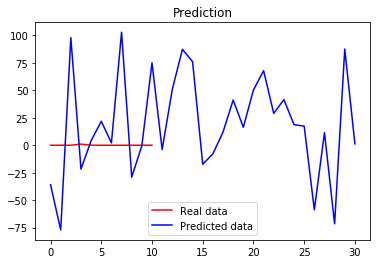

 92%|█████████▏| 91/99 [17:19<01:17,  9.73s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 10007863.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 2891716.2500
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 919745.9375
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 385052.8125
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 162617.5625
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 68850.1484
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 35015.9688
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 16970.3848
Epoch 9/100
8/8 [==============================] - 0s 2ms/step - loss: 6942.2534
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 3611.2603
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 1984.4194
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss: 1503.140

Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 1706.1035


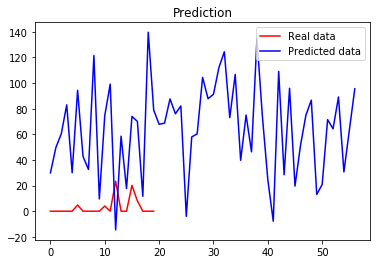

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 992us/step - loss: 7100828.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 1879046.3750
Epoch 3/100
8/8 [==============================] - 0s 1ms/step - loss: 637092.0625
Epoch 4/100
8/8 [==============================] - 0s 870us/step - loss: 356299.8125
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 153602.0000
Epoch 6/100
8/8 [==============================] - 0s 873us/step - loss: 90293.4844
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 55066.0664
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 59718.6133
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 58168.1133
Epoch 10/100
8/8 [==============================] - 0s 997us/step - loss: 37027.1875
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 32013.4512
Epoch 12/100
8/8 [==============================] - 0s 997us/step - 

8/8 [==============================] - 0s 1ms/step - loss: 15850.3359
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 15567.0293


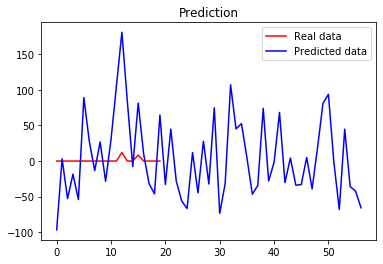

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 997us/step - loss: 21057658.0000
Epoch 2/100
8/8 [==============================] - 0s 997us/step - loss: 7875166.5000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 3088237.2500
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 1545057.2500
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 612968.8125
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 350523.0312
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 289721.8750
Epoch 8/100
8/8 [==============================] - 0s 1ms/step - loss: 200826.5625
Epoch 9/100
8/8 [==============================] - 0s 998us/step - loss: 161254.5469
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 142768.3594
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 137747.7656
Epoch 12/100
8/8 [==============================] - 0s 1m

Epoch 99/100
8/8 [==============================] - 0s 1ms/step - loss: 11238.8389
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 6055.1821


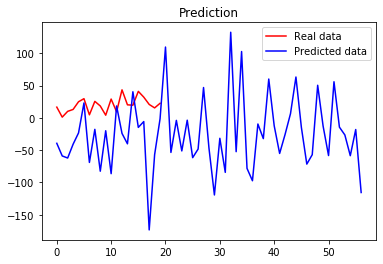

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 998us/step - loss: 4847216.5000
Epoch 2/100
4/4 [==============================] - 0s 998us/step - loss: 2536433.0000
Epoch 3/100
4/4 [==============================] - 0s 997us/step - loss: 1701928.3750
Epoch 4/100
4/4 [==============================] - 0s 1ms/step - loss: 707885.9375
Epoch 5/100
4/4 [==============================] - 0s 1ms/step - loss: 276321.4375
Epoch 6/100
4/4 [==============================] - 0s 998us/step - loss: 422193.4375
Epoch 7/100
4/4 [==============================] - 0s 1ms/step - loss: 210047.5625
Epoch 8/100
4/4 [==============================] - 0s 1000us/step - loss: 86181.2344
Epoch 9/100
4/4 [==============================] - 0s 1ms/step - loss: 114368.1406
Epoch 10/100
4/4 [==============================] - 0s 1ms/step - loss: 65747.9844
Epoch 11/100
4/4 [==============================] - 0s 1ms/step - loss: 29428.2793
Epoch 12/100
4/4 [==============================] - 0s 1ms/step -

4/4 [==============================] - 0s 1ms/step - loss: 1898.7397


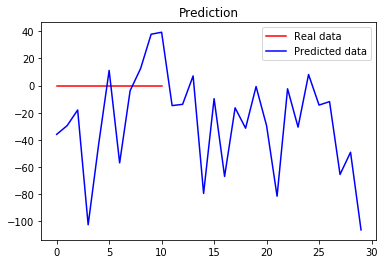

C:\Users\yash\anaconda3\lib\site-packages\ipykernel_launcher.py:192: RuntimeWarning: divide by zero encountered in true_divide
 93%|█████████▎| 92/99 [17:29<01:08,  9.74s/it]

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 22168364.0000
Epoch 2/100
8/8 [==============================] - 0s 873us/step - loss: 4539022.5000
Epoch 3/100
8/8 [==============================] - 0s 997us/step - loss: 1576774.8750
Epoch 4/100
8/8 [==============================] - 0s 997us/step - loss: 574618.8125
Epoch 5/100
8/8 [==============================] - 0s 997us/step - loss: 211308.7188
Epoch 6/100
8/8 [==============================] - 0s 997us/step - loss: 91253.4453
Epoch 7/100
8/8 [==============================] - 0s 873us/step - loss: 50781.5352
Epoch 8/100
8/8 [==============================] - 0s 997us/step - loss: 25981.8105
Epoch 9/100
8/8 [==============================] - 0s 873us/step - loss: 11133.3467
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 5969.2622
Epoch 11/100
8/8 [==============================] - 0s 997us/step - loss: 3164.6187
Epoch 12/100
8/8 [==============================] - 0s 1ms/ste

8/8 [==============================] - 0s 1ms/step - loss: 1228.9888


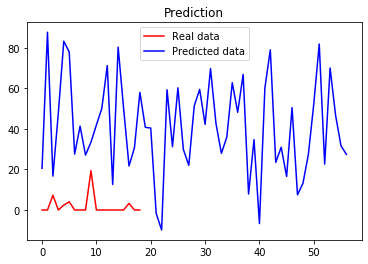

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 3830810.5000
Epoch 2/100
8/8 [==============================] - 0s 2ms/step - loss: 928834.1875
Epoch 3/100
8/8 [==============================] - 0s 2ms/step - loss: 314409.0938
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 205861.3750
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 88372.7734
Epoch 6/100
8/8 [==============================] - 0s 1ms/step - loss: 69005.9766
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 83816.8125
Epoch 8/100
8/8 [==============================] - 0s 2ms/step - loss: 57962.5977
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 48534.9336
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 34167.0977
Epoch 11/100
8/8 [==============================] - 0s 1ms/step - loss: 37349.6836
Epoch 12/100
8/8 [==============================] - 0s 2ms/step - loss: 33401.3789

8/8 [==============================] - 0s 1ms/step - loss: 1322.9841


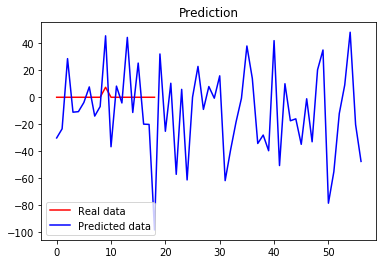

(168, 4)
Epoch 1/100
8/8 [==============================] - 0s 1ms/step - loss: 10337606.0000
Epoch 2/100
8/8 [==============================] - 0s 1ms/step - loss: 4155651.2500
Epoch 3/100
8/8 [==============================] - 0s 2ms/step - loss: 1915747.6250
Epoch 4/100
8/8 [==============================] - 0s 1ms/step - loss: 1053267.0000
Epoch 5/100
8/8 [==============================] - 0s 1ms/step - loss: 490937.3438
Epoch 6/100
8/8 [==============================] - 0s 2ms/step - loss: 477059.3750
Epoch 7/100
8/8 [==============================] - 0s 1ms/step - loss: 316187.5312
Epoch 8/100
8/8 [==============================] - 0s 2ms/step - loss: 234459.0156
Epoch 9/100
8/8 [==============================] - 0s 1ms/step - loss: 153038.6250
Epoch 10/100
8/8 [==============================] - 0s 1ms/step - loss: 111764.1172
Epoch 11/100
8/8 [==============================] - 0s 2ms/step - loss: 138956.6719
Epoch 12/100
8/8 [==============================] - 0s 1ms/step - loss:

8/8 [==============================] - 0s 1ms/step - loss: 2731.6379
Epoch 100/100
8/8 [==============================] - 0s 1ms/step - loss: 3251.3923


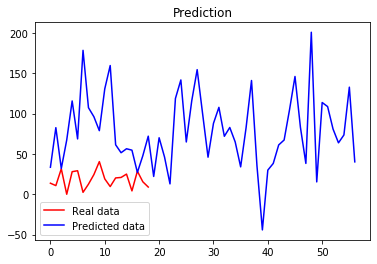

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 1ms/step - loss: 15879874.0000
Epoch 2/100
4/4 [==============================] - 0s 1ms/step - loss: 6346853.0000
Epoch 3/100
4/4 [==============================] - 0s 1ms/step - loss: 3889754.2500
Epoch 4/100
4/4 [==============================] - 0s 2ms/step - loss: 1568384.1250
Epoch 5/100
4/4 [==============================] - 0s 1ms/step - loss: 885239.7500
Epoch 6/100
4/4 [==============================] - 0s 1ms/step - loss: 907574.8750
Epoch 7/100
4/4 [==============================] - 0s 1ms/step - loss: 110836.1641
Epoch 8/100
4/4 [==============================] - 0s 1ms/step - loss: 504048.5938
Epoch 9/100
4/4 [==============================] - 0s 1ms/step - loss: 100374.0234
Epoch 10/100
4/4 [==============================] - 0s 997us/step - loss: 111905.3359
Epoch 11/100
4/4 [==============================] - 0s 1ms/step - loss: 129369.2188
Epoch 12/100
4/4 [==============================] - 0s 1ms/step - los

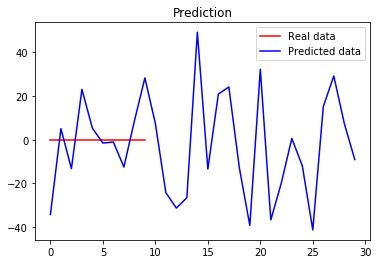

C:\Users\yash\anaconda3\lib\site-packages\ipykernel_launcher.py:192: RuntimeWarning: divide by zero encountered in true_divide
 94%|█████████▍| 93/99 [17:40<01:00, 10.06s/it]

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 13076491.0000
Epoch 2/100
7/7 [==============================] - 0s 1ms/step - loss: 3051352.0000
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 1185729.8750
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 351116.1875
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 225401.2031
Epoch 6/100
7/7 [==============================] - 0s 998us/step - loss: 160616.2031
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 64145.0664
Epoch 8/100
7/7 [==============================] - 0s 855us/step - loss: 22604.3027
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 12380.0293
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 9506.1357
Epoch 11/100
7/7 [==============================] - 0s 1000us/step - loss: 5166.4399
Epoch 12/100
7/7 [==============================] - 0s 861us/step - loss

7/7 [==============================] - 0s 998us/step - loss: 1123.5399
Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 973.5461


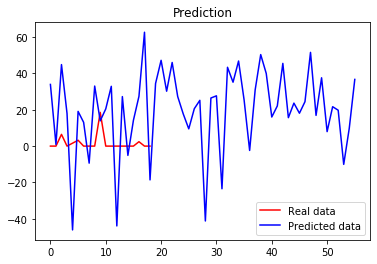

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 997us/step - loss: 8522630.0000
Epoch 2/100
7/7 [==============================] - 0s 998us/step - loss: 2200638.2500
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 997585.8750
Epoch 4/100
7/7 [==============================] - 0s 999us/step - loss: 469551.6562
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 241351.1719
Epoch 6/100
7/7 [==============================] - 0s 997us/step - loss: 116699.1875
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 73288.4844
Epoch 8/100
7/7 [==============================] - 0s 997us/step - loss: 50833.4727
Epoch 9/100
7/7 [==============================] - 0s 998us/step - loss: 56692.3359
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 30119.9707
Epoch 11/100
7/7 [==============================] - 0s 997us/step - loss: 30819.0410
Epoch 12/100
7/7 [==============================] - 0s 1ms/step -

7/7 [==============================] - 0s 1ms/step - loss: 6202.5620
Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 4476.9785


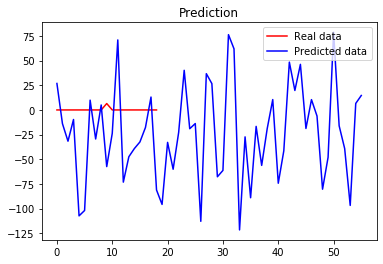

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 998us/step - loss: 6703208.5000
Epoch 2/100
7/7 [==============================] - 0s 997us/step - loss: 1508969.3750
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 1040734.3125
Epoch 4/100
7/7 [==============================] - 0s 997us/step - loss: 430472.3125
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 409563.4062
Epoch 6/100
7/7 [==============================] - 0s 855us/step - loss: 315995.6875
Epoch 7/100
7/7 [==============================] - 0s 850us/step - loss: 232523.8750
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 345845.2188
Epoch 9/100
7/7 [==============================] - 0s 858us/step - loss: 441044.5000
Epoch 10/100
7/7 [==============================] - 0s 997us/step - loss: 476318.6875
Epoch 11/100
7/7 [==============================] - 0s 855us/step - loss: 237929.7344
Epoch 12/100
7/7 [==============================] - 0s 85

7/7 [==============================] - 0s 1ms/step - loss: 9785.6855
Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 6208.1880


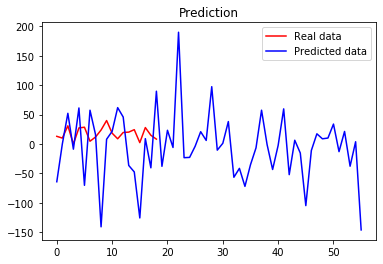

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 1ms/step - loss: 11004566.0000
Epoch 2/100
4/4 [==============================] - 0s 998us/step - loss: 4667163.0000
Epoch 3/100
4/4 [==============================] - 0s 997us/step - loss: 2790839.2500
Epoch 4/100
4/4 [==============================] - 0s 1ms/step - loss: 1177292.1250
Epoch 5/100
4/4 [==============================] - 0s 998us/step - loss: 524053.6562
Epoch 6/100
4/4 [==============================] - 0s 997us/step - loss: 775065.3125
Epoch 7/100
4/4 [==============================] - 0s 998us/step - loss: 561368.0625
Epoch 8/100
4/4 [==============================] - 0s 1ms/step - loss: 210398.3125
Epoch 9/100
4/4 [==============================] - 0s 748us/step - loss: 122329.2734
Epoch 10/100
4/4 [==============================] - 0s 1ms/step - loss: 148383.5625
Epoch 11/100
4/4 [==============================] - 0s 997us/step - loss: 94138.3281
Epoch 12/100
4/4 [==============================] - 0s 998

4/4 [==============================] - 0s 1ms/step - loss: 7355.0771
Epoch 100/100
4/4 [==============================] - 0s 2ms/step - loss: 8221.2715


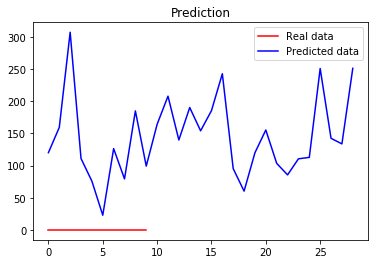

C:\Users\yash\anaconda3\lib\site-packages\ipykernel_launcher.py:192: RuntimeWarning: divide by zero encountered in true_divide
 95%|█████████▍| 94/99 [17:49<00:49,  9.82s/it]

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 45713144.0000
Epoch 2/100
7/7 [==============================] - 0s 1ms/step - loss: 8195189.5000
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 3765890.2500
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 3006717.5000
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 1039491.6875
Epoch 6/100
7/7 [==============================] - 0s 2ms/step - loss: 293203.3438
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 295496.2188
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 135100.9062
Epoch 9/100
7/7 [==============================] - 0s 2ms/step - loss: 35454.0156
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 22587.8848
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 16280.4727
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss: 7

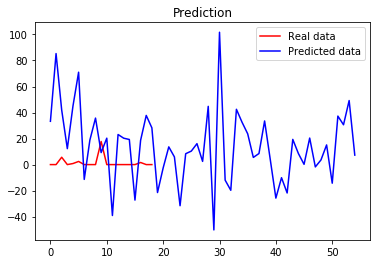

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 2962267.2500
Epoch 2/100
7/7 [==============================] - 0s 1ms/step - loss: 785214.5625
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 547139.2500
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 298001.2500
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 125785.9375
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 102261.0469
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 95100.8516
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 88545.7969
Epoch 9/100
7/7 [==============================] - 0s 1ms/step - loss: 64312.9648
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 47663.9492
Epoch 11/100
7/7 [==============================] - 0s 1ms/step - loss: 49696.7227
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss: 43811.72

7/7 [==============================] - 0s 1ms/step - loss: 1180.0510


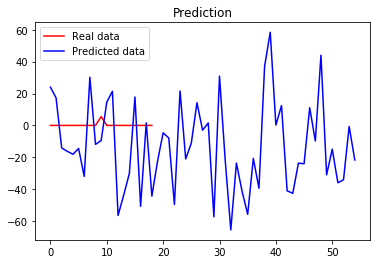

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 997us/step - loss: 14840563.0000
Epoch 2/100
7/7 [==============================] - 0s 855us/step - loss: 5087556.0000
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 3148825.0000
Epoch 4/100
7/7 [==============================] - 0s 855us/step - loss: 1622395.8750
Epoch 5/100
7/7 [==============================] - 0s 860us/step - loss: 864076.0625
Epoch 6/100
7/7 [==============================] - 0s 997us/step - loss: 733411.2500
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 474609.4062
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 295530.1875
Epoch 9/100
7/7 [==============================] - 0s 855us/step - loss: 267964.9062
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 215444.2188
Epoch 11/100
7/7 [==============================] - 0s 997us/step - loss: 174234.5469
Epoch 12/100
7/7 [==============================] - 0s 99

Epoch 99/100
7/7 [==============================] - 0s 1ms/step - loss: 6660.6641
Epoch 100/100
7/7 [==============================] - 0s 1ms/step - loss: 7734.8320


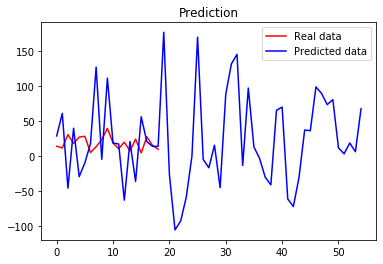

(132, 4)
Epoch 1/100
4/4 [==============================] - 0s 1ms/step - loss: 19916306.0000
Epoch 2/100
4/4 [==============================] - 0s 1ms/step - loss: 4111932.5000
Epoch 3/100
4/4 [==============================] - 0s 1ms/step - loss: 5687725.5000
Epoch 4/100
4/4 [==============================] - 0s 1ms/step - loss: 2372151.5000
Epoch 5/100
4/4 [==============================] - 0s 1ms/step - loss: 1190056.8750
Epoch 6/100
4/4 [==============================] - 0s 1ms/step - loss: 1508940.8750
Epoch 7/100
4/4 [==============================] - 0s 1ms/step - loss: 319561.4375
Epoch 8/100
4/4 [==============================] - 0s 997us/step - loss: 710927.5000
Epoch 9/100
4/4 [==============================] - 0s 1ms/step - loss: 121233.7500
Epoch 10/100
4/4 [==============================] - 0s 1ms/step - loss: 304961.7500
Epoch 11/100
4/4 [==============================] - 0s 1ms/step - loss: 77845.3125
Epoch 12/100
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 4847.4644


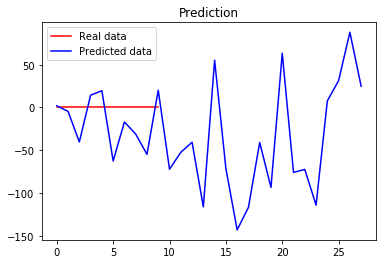

C:\Users\yash\anaconda3\lib\site-packages\ipykernel_launcher.py:192: RuntimeWarning: divide by zero encountered in true_divide
 96%|█████████▌| 95/99 [17:59<00:39,  9.81s/it]

(168, 4)
Epoch 1/100
7/7 [==============================] - 0s 1ms/step - loss: 9173649.0000
Epoch 2/100
7/7 [==============================] - 0s 849us/step - loss: 2212942.2500
Epoch 3/100
7/7 [==============================] - 0s 1ms/step - loss: 1413761.1250
Epoch 4/100
7/7 [==============================] - 0s 1ms/step - loss: 613414.9375
Epoch 5/100
7/7 [==============================] - 0s 1ms/step - loss: 268841.8750
Epoch 6/100
7/7 [==============================] - 0s 1ms/step - loss: 118886.7031
Epoch 7/100
7/7 [==============================] - 0s 1ms/step - loss: 74814.0078
Epoch 8/100
7/7 [==============================] - 0s 1ms/step - loss: 49823.3711
Epoch 9/100
7/7 [==============================] - 0s 997us/step - loss: 18063.6230
Epoch 10/100
7/7 [==============================] - 0s 1ms/step - loss: 11867.4883
Epoch 11/100
7/7 [==============================] - 0s 997us/step - loss: 10757.9541
Epoch 12/100
7/7 [==============================] - 0s 1ms/step - loss: 

In [ ]:
## Data Structure
    # Cycles[battery][param][cycle]
    # Cycles[battery][Capacity][cycle]

from sklearn.ensemble import RandomForestRegressor
from tqdm import tqdm    
import numpy as np
from keras.layers import Dense, Activation
from keras.models import Sequential
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

    
Cycles = {}
params = ['Temperature_measured', 'Voltage_measured', 'Voltage_load', 'Time']

# remove batteries from group
bs_compt = BSSS
bs_compt = removeFromGroup(bs_compt)


rmses = []
rmses_train = []

for bs_cmpt in bs_compt:
    rmses.append([bs_compt[bs_cmpt][0]])
    rmses_train.append([bs_compt[bs_cmpt][0]])
    

# iterate over the merge hyper parameter
for xx in tqdm(range(1, 100)):

    results = Texttable()
    results.add_row([ 'Compatible Batteries', 'Cycles', 'MAE', 'RMSE', 'R2 Score' ])
    
    loc = 0
    
    # iterate over all the battery sets
    for bs_cmpt in bs_compt:
        # getting data for a given set

        # y contains RUL after current cycle
        # model will train for y
        y = []

        bs = bs_compt[bs_cmpt]
        for b in bs:
            Cycles[b] = {}
            for param in params:
                Cycles[b][param] = []
                for j in range(datas[b].size):
                    if types[b][j] == 'discharge':
                        Cycles[b][param].append(datas[b][j][param][0][0][0])

            cap = []
            for j in range(datas[b].size):
                if types[b][j] == 'discharge':
                    cap.append(datas[b][j]['Capacity'][0][0][0][0])
            Cycles[b]['Capacity'] = np.array(cap)
            Cycles[b]['count'] = len(Cycles[b][params[0]])

            effective_cycle_count = 0
            for x in Cycles[b]['Capacity']:
                if (x < 1.4):
                    break
                effective_cycle_count += 1

            for i in range(len(Cycles[b]['Capacity'])):
                if (i < effective_cycle_count):
                    y.append((1 - ((i + 1) / effective_cycle_count)) * 100)
                else:
                    y.append(0)

        # preparing data for regression model
        temperature_measured = []
        voltage_measured = []
        voltage_load = []
        capacity = []

        for b in bs:        
            for c in Cycles[b]['Capacity']:
                capacity.append(c)
            for i in range(Cycles[b]['count']):
                temperature_measured.append(getTemperatureMeasuredCritical(Cycles[b]['Temperature_measured'][i], Cycles[b]['Time'][i]))
                voltage_measured.append(getVoltageMeasuredCritical(Cycles[b]['Voltage_measured'][i], Cycles[b]['Time'][i]))
                voltage_load.append(getVoltageLoadCritical(Cycles[b]['Voltage_load'][i], Cycles[b]['Time'][i]))

        # creating the model
        X = []
        for i in range(len(temperature_measured)):
            X.append(np.array([temperature_measured[i], voltage_measured[i], voltage_load[i], capacity[i]]))
    #     X.append(np.array(capacity))
        X = np.array(X)
        y = np.array(y)
        print(X.shape)
        # merge cycles
        X, y = merge(X, y, xx)
        
        # creating train test split
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)
        
        ############## ------------------ MODEL ------------------- ####################
        
        ### Liner Regression with Ridge Regularization ###
#         regressor = Ridge(alpha=0.5)
#         regressor.fit(X_train, y_train)
#         y_pred = regressor.predict(X_test)
#         y_pred_train = regressor.predict(X_train)
        
        
        ### ARDRegresssor ###
#         regressor = ARDRegression()
#         regressor.fit(X_train, y_train)
#         y_pred = regressor.predict(X_test)
#         y_pred_train = regressor.predict(X_train)
        
    
        ### Bayes Model ###
#         regressor = BayesianRidge()
#         regressor.fit(X_train, y_train)
#         y_pred = regressor.predict(X_test)
#         y_pred_train = regressor.predict(X_train)
        
    
        ### ELM Regressor ###
#         from skelm import ELMRegressor
#         estimator = ELMRegressor()
#         estimator.fit(X_train, y_train)
#         y_pred = estimator.predict(X_test)
#         y_pred_train = estimator.predict(X_train)


        ### Decision Tree ###
#         from sklearn import tree
#         regressor = tree.DecisionTreeRegressor()
#         regressor.fit(X_train, y_train)
#         y_pred = regressor.predict(X_test)
#         y_pred_train = regressor.predict(X_train)

        ### Random Forest Regressor ### (BEST)
#        regressor = RandomForestRegressor(max_depth =10, random_state= 0)
#        regressor.fit(X_train, y_train)
#        y_pred = regressor.predict(X_test)
#        y_pred_train = regressor.predict(X_train)
 
        #sc = StandardScaler()
        #X_train = sc.fit_transform(X_train)
        #X_test = sc.transform(X_test)

        # Initialising the ANN
        model = Sequential()

        # Adding the input layer and the first hidden layer
        model.add(Dense(6*xx, activation = 'linear', input_dim = xx * 4))

        # Adding the second hidden layer
        model.add(Dense(units = 6*xx, activation = 'linear'))

        # Adding the third hidden layer
        model.add(Dense(units = 6*xx, activation = 'linear'))

        # Adding the output layer

        model.add(Dense(units = 1))
        # Compiling the ANN
        model.compile(optimizer = 'adam', loss = 'mean_squared_error')

        # Fitting the ANN to the Training set
        model.fit(X_train, y_train, batch_size = 8, epochs = 100)
        y_pred = model.predict(X_train)
        y_pred_train = model.predict(X_test)

        plt.plot(y_test, color = 'red', label = 'Real data')
        plt.plot(y_pred, color = 'blue', label = 'Predicted data')
        plt.title('Prediction')
        plt.legend()
        plt.show()
        ############# ----------------- MODEL -------------------- #####################

        # model evaluation
        diff = 0
        total = 0
        rmse = 0
        for i in range(len(y_test)):
            diff += abs(y_test[i] - y_pred[i])
            rmse += ((y_test[i] - y_pred[i]) * (y_test[i] - y_pred[i]))
            total += y_test[i]
        diff /= len(y_test)
        total /= len(y_test)
        rmse = math.sqrt(rmse / len(y_test))
        accuracy2 = ((total - diff) / total) * 100
        #accuracy = r2_score(y_test, y_pred)

        # Adding evaluation to result array to print in a table
#         results.add_row([ str(bs), str(Cycles[bs[0]]['count']), diff, rmse, accuracy, accuracy2 ])
        
        rmses[loc].append(rmse)
        
        #### adding rmses of the train
        #rmse_train = 0
        #for i in range(len(y_train) - 1):
            #rmse_train += ((y_train[i] - y_pred_train[i]) * (y_train[i] - y_pred_train[i]))
        #rmse_train = math.sqrt(rmse_train / len(y_train))
        #rmses_train[loc].append(rmse_train)
        loc += 1

    # printing results
#     print(f'Evaluation: Clubbing Compatible Batteries for cycle param: {xx}\n{results.draw()}')

In [ ]:
for i in range(len(rmses)):
    rm = rmses[i]
    rm_train = rmses_train[i]
    
    mn = 100000
    mn_train = 100000
    loc, loc_train = -1, -1
    for i in range(1, len(rm)):
        if (mn > rm[i]):
            mn = rm[i]
            loc = i
        
        #if (mn_train > rm_train[i]):
            #mn_train = rm_train[i]
            #loc_train = i
            
    print(f"Minima Test: {mn}, Merge: {loc}")
    #print(f"Minima Train: {mn_train}, Merge: {loc_train}")
    
    fig, ax = plt.subplots()
    ax.plot(range(1, len(rm)), rm[1:])
    #ax.plot(range(1, len(rm)), rm_train[1:])
    plt.ylabel(rm[0])
    plt.show()